### Dataset
https://archive.ics.uci.edu/ml/machine-learning-databases/00350/

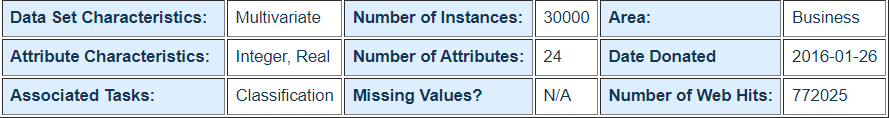

### Data Set Information:

This research aimed at the case of customersâ€™ default payments in Taiwan and compares the predictive accuracy of probability of default among six data mining methods. From the perspective of risk management, the result of predictive accuracy of the estimated probability of default will be more valuable than the binary result of classification - credible or not credible clients. Because the real probability of default is unknown, this study presented the novel â€œSorting Smoothing Methodâ€ to estimate the real probability of default. With the real probability of default as the response variable (Y), and the predictive probability of default as the independent variable (X), the simple linear regression result (Y = A + BX) shows that the forecasting model produced by artificial neural network has the highest coefficient of determination; its regression intercept (A) is close to zero, and regression coefficient (B) to one. Therefore, among the six data mining techniques, artificial neural network is the only one that can accurately estimate the real probability of default.

### Attribute Information:

This research employed a binary variable, default payment (Yes = 1, No = 0), as the response variable. This study reviewed the literature and used the following 23 variables as explanatory variables:

X1: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.

X2: Gender (1 = male; 2 = female).

X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).

X4: Marital status (1 = married; 2 = single; 3 = others).

X5: Age (year).

X6 - X11: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows: X6 = the repayment status in September, 2005; X7 = the repayment status in August, 2005; . . .;X11 = the repayment status in April, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.

X12-X17: Amount of bill statement (NT dollar). X12 = amount of bill statement in September, 2005; X13 = amount of bill statement in August, 2005; . . .; X17 = amount of bill statement in April, 2005.

X18-X23: Amount of previous payment (NT dollar). X18 = amount paid in September, 2005; X19 = amount paid in August, 2005; . . .;X23 = amount paid in April, 2005.



### Relevant Papers:

Yeh, I. C., & Lien, C. H. (2009). The comparisons of data mining techniques for the predictive accuracy of probability of default of credit card clients. Expert Systems with Applications, 36(2), 2473-2480.

### In this data set we explore 6 Algorithm and Compare them
#### 1. Logistic Regression Classifier 
#### 2. SVM Clasifier 
#### 3. Artificial Neural Network (ANN) Classifier 
#### 4. Random Forest Classifier 
#### 5. XGBoost Classifier 
#### 6. Convolution Neural Network (CNN) Classifier

## Code 

In [1]:
# Import Libraries
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import urllib.parse
import requests
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV,  ParameterGrid
from joblib import Parallel, delayed
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc, confusion_matrix, log_loss, roc_auc_score
import sklearn.metrics
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.utils import shuffle
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
from scipy.stats import zscore
import graphviz
from sklearn.tree import export_graphviz
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import time
import pickle
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from keras.utils import to_categorical
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# URL of the .xls file from UCI Machine Learning Repository
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00350/default%20of%20credit%20card%20clients.xls"

# Download the file locally
response = requests.get(url)
with open("data.xls", "wb") as file:
    file.write(response.content)

# Read the locally saved .xls file into a DataFrame
data = pd.read_excel("data.xls",header=1)  # first row contains column names

In [3]:
# We can see the overview of the whole data set 

data

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [4]:
# head is use to see the first 5 data from the whole dataset

data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [5]:
# tail is use to see the last 5 data from the whole dataset

data.tail()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1
29999,30000,50000,1,2,1,46,0,0,0,0,...,36535,32428,15313,2078,1800,1430,1000,1000,1000,1


In [6]:
# shape tells the number of rows and column in the dataset 

data.shape

(30000, 25)

In [7]:
# describe tells the count, mean, std, min, max, etc., of the numerical data from the whole dataset  

data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,30000.0,15000.500000,8660.398374,1.0,7500.75,15000.5,22500.25,30000.0
LIMIT_BAL,30000.0,167484.322667,129747.661567,10000.0,50000.00,140000.0,240000.00,1000000.0
SEX,30000.0,1.603733,0.489129,1.0,1.00,2.0,2.00,2.0
EDUCATION,30000.0,1.853133,0.790349,0.0,1.00,2.0,2.00,6.0
MARRIAGE,30000.0,1.551867,0.521970,0.0,1.00,2.0,2.00,3.0
AGE,30000.0,35.485500,9.217904,21.0,28.00,34.0,41.00,79.0
PAY_0,30000.0,-0.016700,1.123802,-2.0,-1.00,0.0,0.00,8.0
PAY_2,30000.0,-0.133767,1.197186,-2.0,-1.00,0.0,0.00,8.0
PAY_3,30000.0,-0.166200,1.196868,-2.0,-1.00,0.0,0.00,8.0
PAY_4,30000.0,-0.220667,1.169139,-2.0,-1.00,0.0,0.00,8.0


In [8]:
# info tells the column attributes and its name along with data type and does the column attribute have any null value or not 

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

In [9]:
data.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default payment next month    0
dtype: int64

In [10]:
# Check for duplicate records
print(data.duplicated().sum())

0


## Basic EDA

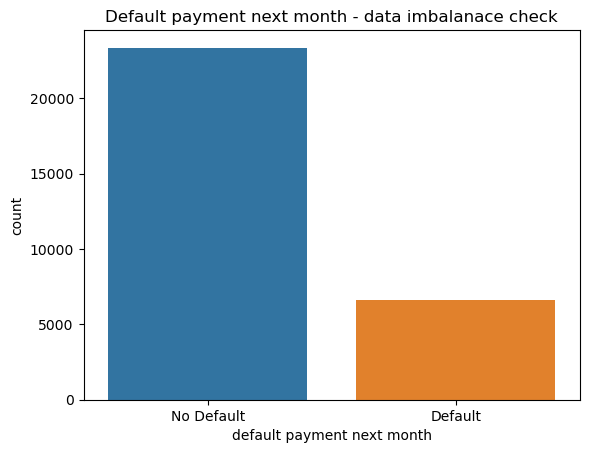

In [11]:
# Check the imbalance of defaulter and non- defaulter in data
data['default payment next month'].value_counts()
plt.title('Default payment next month - data imbalanace check')
ax1 = sns.countplot(x = 'default payment next month', data = data)
ax1.set_xticklabels(['No Default','Default'])
plt.show()

The above graphs shows that the data is not hughe imbalance, but still it may effect our model accuracy. As No Defaulter data is more compare to defaulter. 

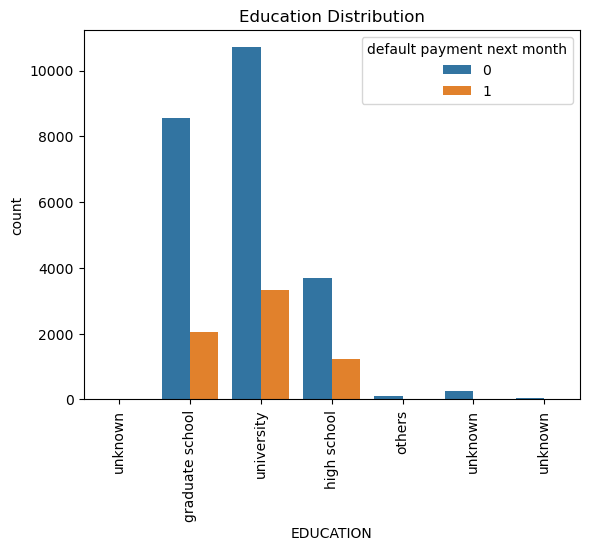

In [12]:
# Education Distribution 
plt.title("Education Distribution")
ax2 = sns.countplot(x = 'EDUCATION', hue= 'default payment next month', data = data)
ax2.set_xticklabels(["unknown","graduate school", "university", "high school", "others", "unknown", "unknown"], rotation = 90)
plt.show()

From the above plot, we can see that most of the defaulters have the degree of graduate/university/high school. Among them, clients who have a university degrees are more likely to default than others.

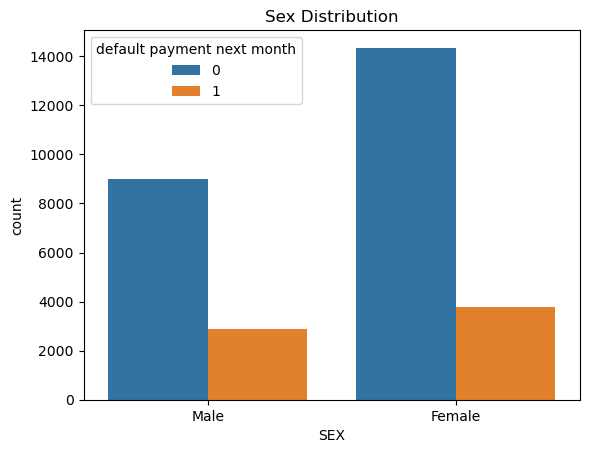

In [13]:
# SEX distribution
plt.title('Sex Distribution')
ax3 = sns.countplot(x= 'SEX', hue = 'default payment next month', data = data)
ax3.set_xticklabels ([ 'Male', 'Female'])
plt.show()

Female has more probability of default than male.

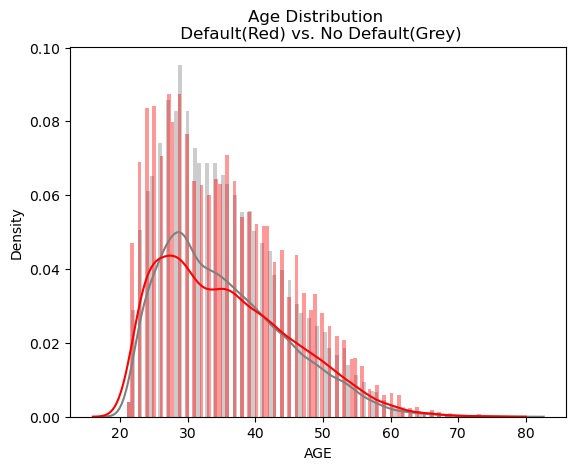

In [14]:
# Age Distribution
plt.title('Age Distribution \n Default(Red) vs. No Default(Grey)')
agedist0 = data[data['default payment next month']==0]['AGE']
agedist1 = data[data['default payment next month']==1]['AGE']
sns.distplot(agedist0, bins = 100, color = "grey") 
sns.distplot(agedist1, bins = 100, color = 'red')
plt.show()

As age increases to 30, the probability of default increases. Meanwhile, when clients are over 30, the probability decreases when aging.

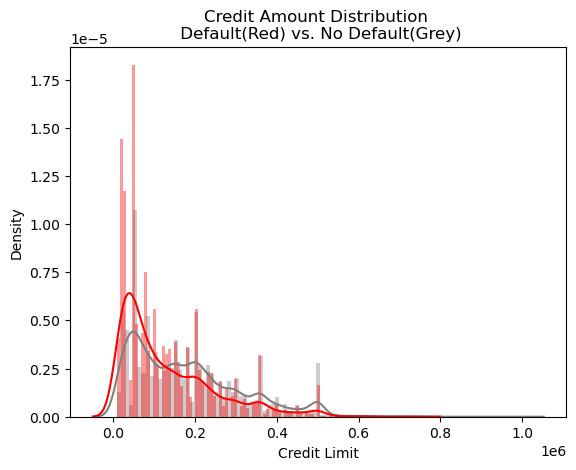

In [15]:
# Credit Amount Distribution
plt.title('Credit Amount Distribution \n Default(Red) vs. No Default(Grey)')
cadist0 = data[data['default payment next month']==0]['LIMIT_BAL'] 
cadist1 = data[data['default payment next month']==1]['LIMIT_BAL']
sns.distplot(cadist0, bins = 100, color = "grey")
sns.distplot(cadist1, bins = 100, color = 'red')
plt.xlabel("Credit Limit")
plt.show()

Clients with amounts lower than 100000 tend to default. Especially those with credit amount around 65000 default most.

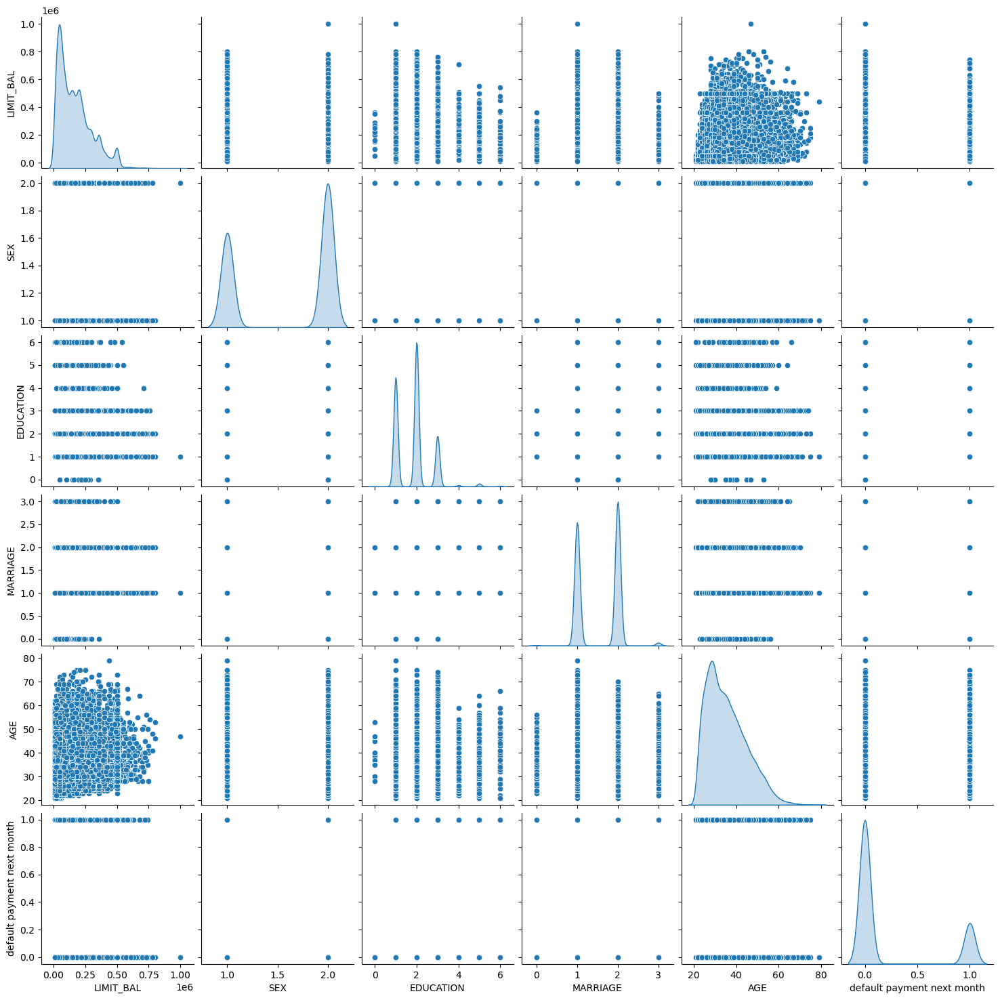

In [16]:
# Pairwise scatter plot of selected features
selected_features = ['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'default payment next month']
sns.pairplot(data[selected_features], diag_kind='kde')

## Features correlation

In [17]:
print("Data Correlation")
corr = data.corr()
corr

Data Correlation


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
ID,1.000000,0.026179,0.018497,0.039177,-0.029079,0.018678,-0.030575,-0.011215,-0.018494,-0.002735,...,0.040351,0.016705,0.016730,0.009742,0.008406,0.039151,0.007793,0.000652,0.003000,-0.013952
LIMIT_BAL,0.026179,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,...,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595,-0.153520
SEX,0.018497,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,...,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766,-0.039961
EDUCATION,0.039177,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,...,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200,0.028006
MARRIAGE,-0.029079,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,...,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641,-0.024339
AGE,0.018678,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,...,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478,0.013890
PAY_0,-0.030575,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,...,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673,0.324794
PAY_2,-0.011215,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,...,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500,0.263551
PAY_3,-0.018494,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,...,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861,0.235253
PAY_4,-0.002735,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,...,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565,0.216614


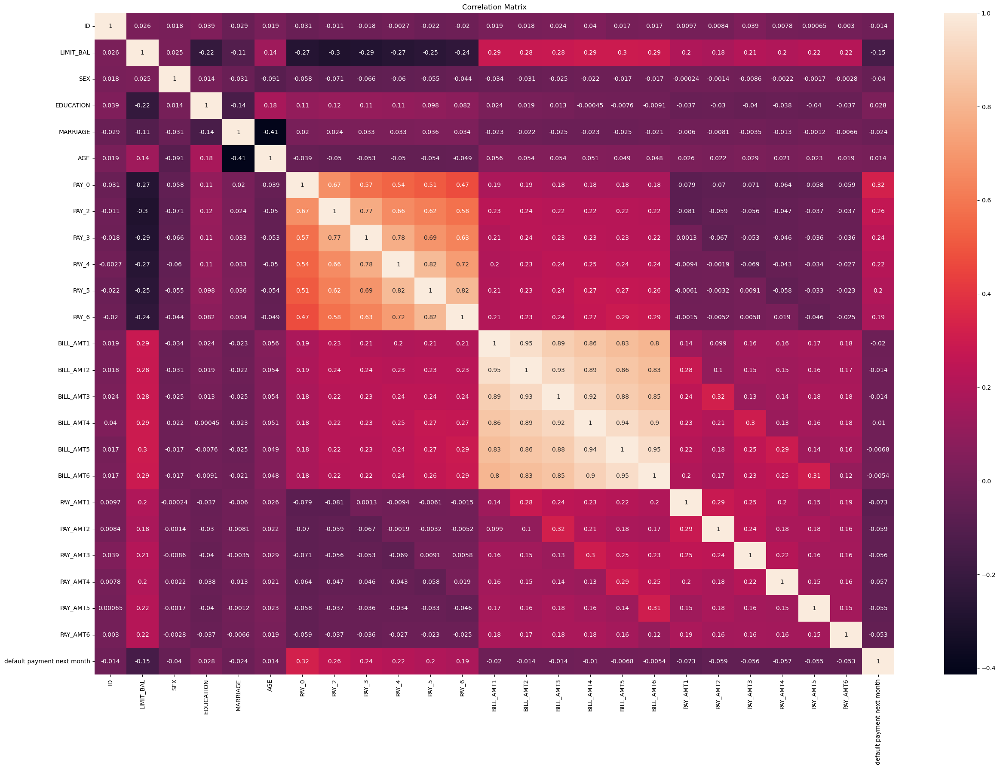

In [18]:
plt.subplots(figsize=(30,20))
sns.heatmap(data.corr(), annot=True)
plt.title('Correlation Matrix')
plt.show()

#### Check the correlation of the Amount of bill statement in April — September 2005.

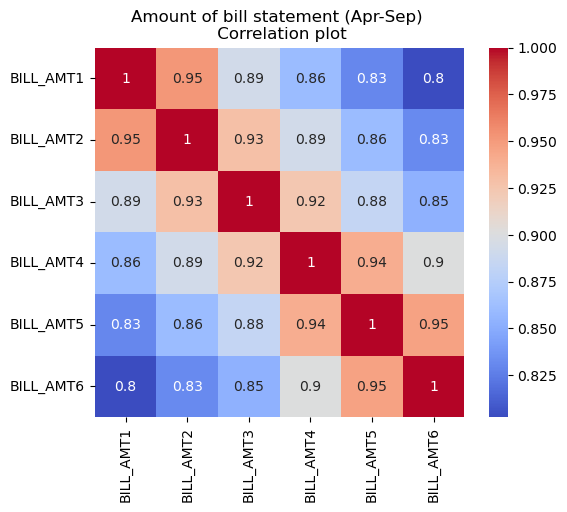

In [19]:
# List of columns to analyze
columns_to_analyze = ['BILL_AMT1','BILL_AMT2','BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']
# Plot the correlation matrix
corr = data[columns_to_analyze].corr()
plt.title('Amount of bill statement (Apr-Sep) \n Correlation plot')
sns.heatmap(corr, annot=True, cmap='coolwarm', square=True)
plt.show()

Correlation is decreasing with distance between months. Lowest correlations are between Sept-April.

#### Check the correlation of Amount of previous payment in April — September 2005.

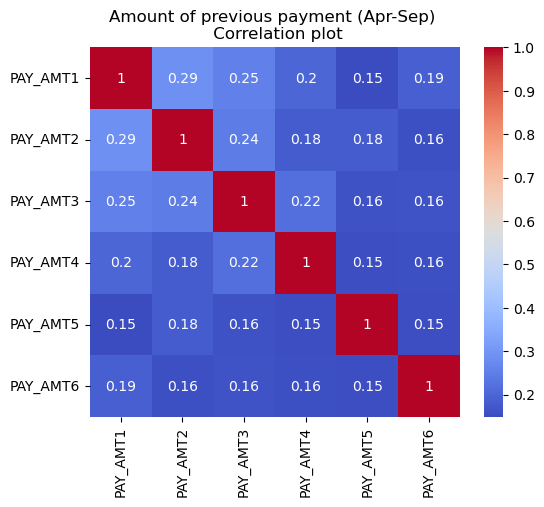

In [20]:
# List of columns to analyze
columns_to_analyze = ['PAY_AMT1','PAY_AMT2','PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']
# Plot the correlation matrix
corr = data[columns_to_analyze].corr()
plt.title('Amount of previous payment (Apr-Sep) \n Correlation plot')
sns.heatmap(corr, annot=True, cmap='coolwarm', square=True)
plt.show()

There are no correlations between amounts of previous payments for April-Sept 2005.

#### Check the correlation between Repayment status in April — September 2005

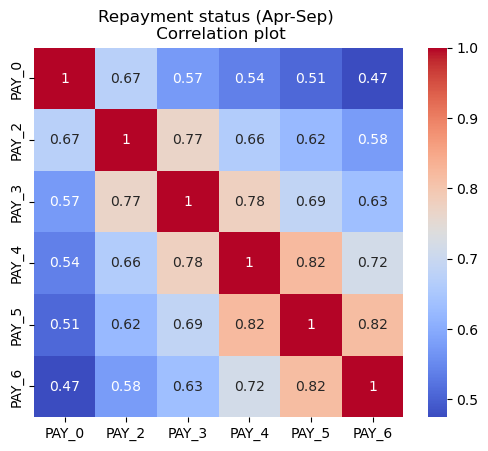

In [21]:
# List of columns to analyze
columns_to_analyze = ['PAY_0','PAY_2','PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
# Plot the correlation matrix
corr = data[columns_to_analyze].corr()
plt.title('Repayment status (Apr-Sep) \n Correlation plot')
sns.heatmap(corr, annot=True, cmap='coolwarm', square=True)
plt.show()

Correlation is decreasing with distance between months. Lowest correlations are between Sept-April.

## Data Pre-Processing 

### Outlier Detection 

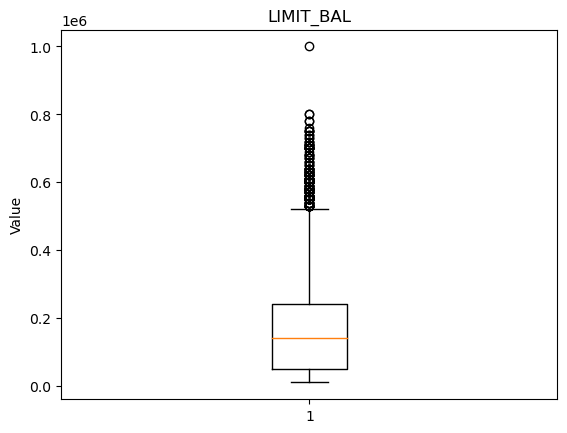

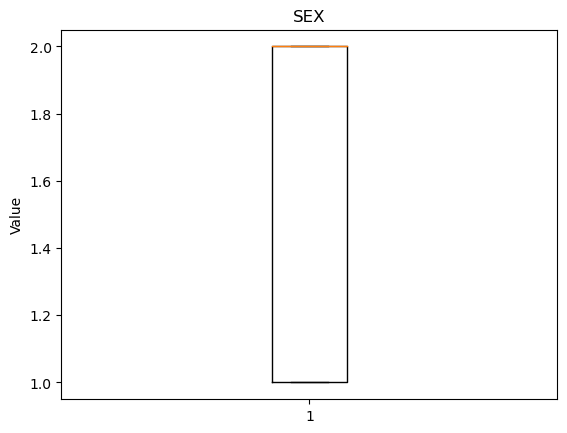

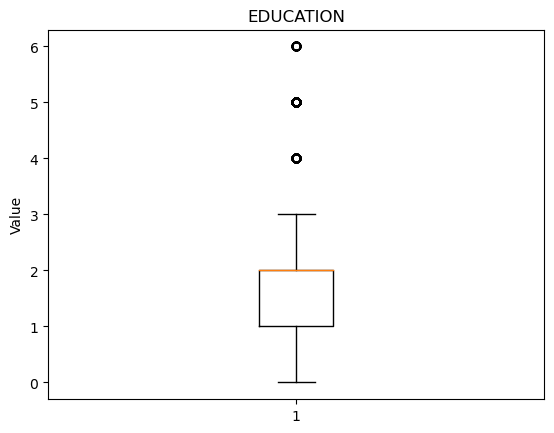

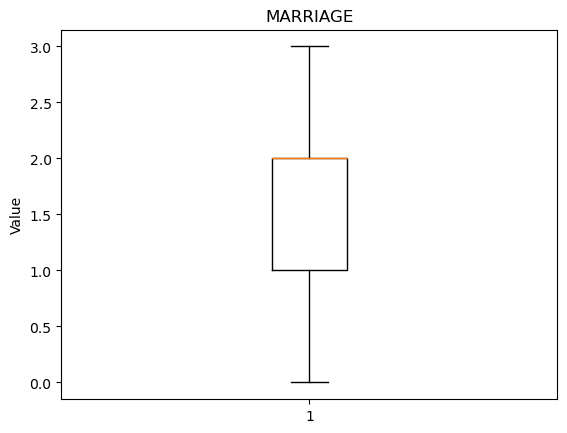

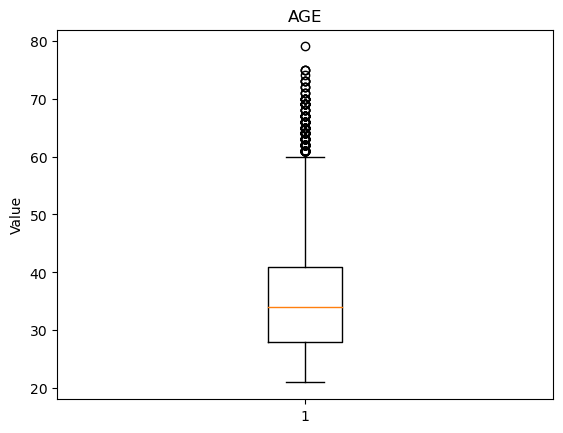

...

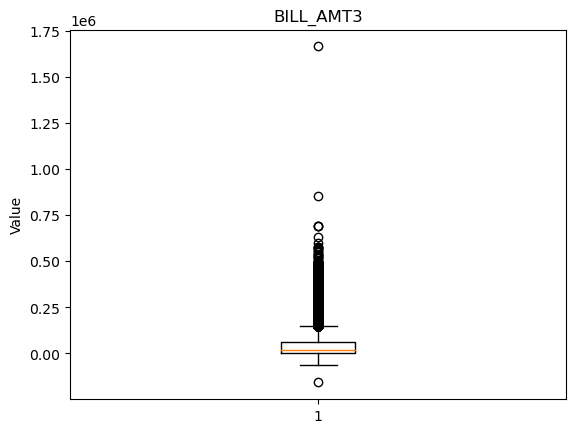

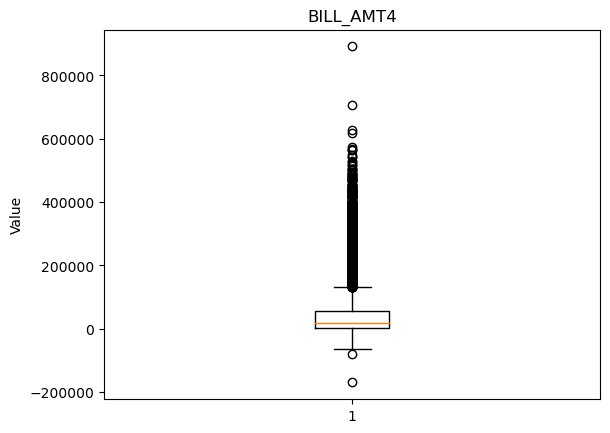

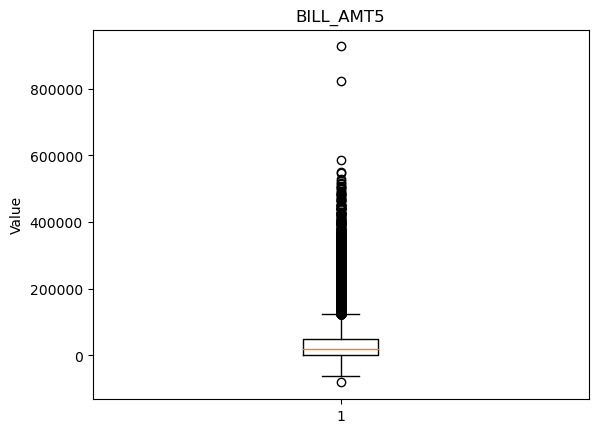

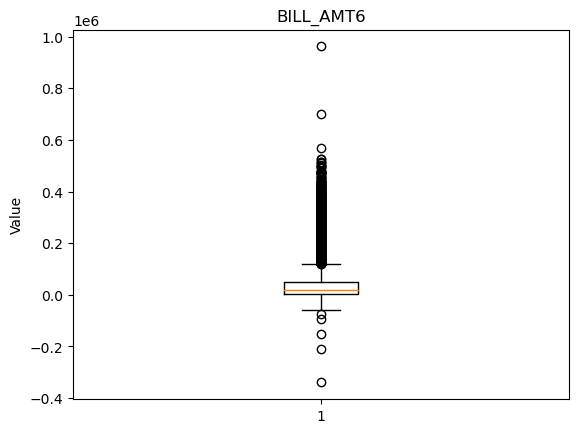

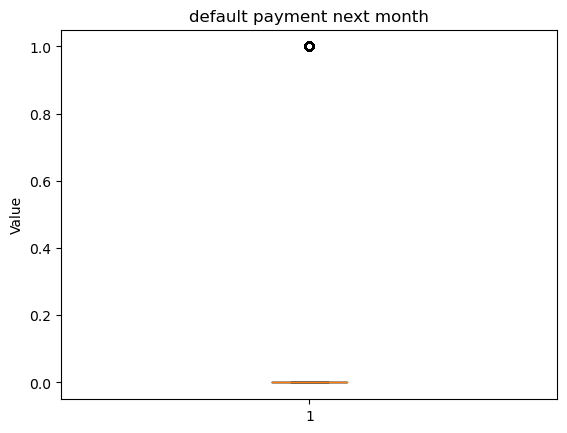

In [22]:
# List of columns to analyze
columns_to_analyze = ['LIMIT_BAL','SEX','EDUCATION','MARRIAGE','AGE','PAY_0','PAY_2','PAY_3', 'PAY_4', 'PAY_5', 'PAY_6','PAY_AMT1','PAY_AMT2','PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6','BILL_AMT1','BILL_AMT2','BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6','default payment next month']

# Create box plots
for column in columns_to_analyze:
    fig, ax = plt.subplots()
    ax.boxplot(data[column])
    ax.set_title(column)
    ax.set_ylabel('Value')
    plt.show()

By generating box plots for each column, we can visually inspect the distribution of values, identify potential outliers, and gain insights into the variability and central tendency of the data for each feature.

This Colums has most outlier:

PAY_AMT6, 
PAY_AMT5, 
PAY_AMT4,
PAY_AMT3, 
PAY_AMT2, 
PAY_AMT1,
BILL_AMT6, 
BILL_AMT5, 
BILL_AMT4, 
BILL_AMT3, 
BILL_AMT2,
BILL_AMT1

Shape of dataset without outliers: (26429, 25)


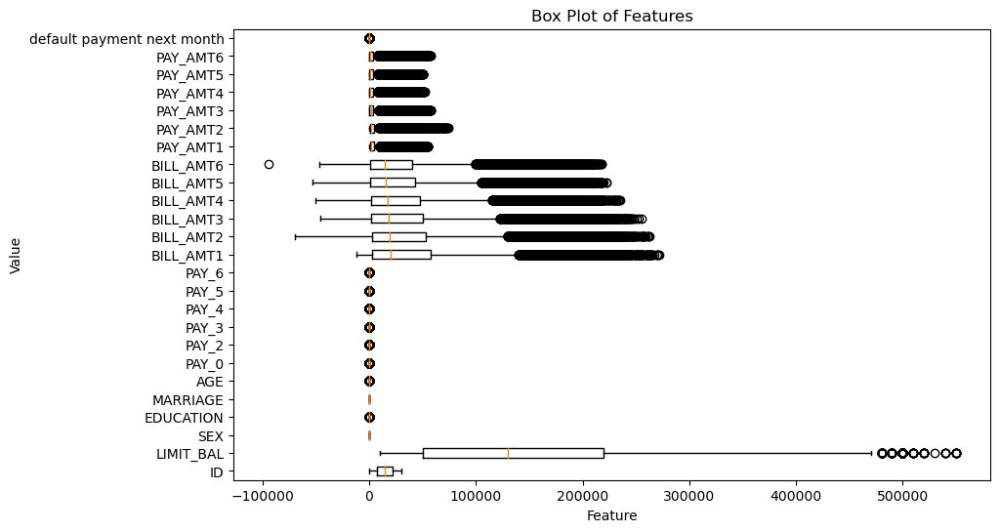

In [23]:
# Calculate the z-scores for each column in the dataset
z_scores = zscore(data)

# Define a threshold for outlier detection (e.g., z-score > 3 or < -3)
threshold = 3

# Find the indices of rows with outliers for each column
outlier_indices = np.where(np.abs(z_scores) > threshold)

# Remove the rows with outliers from the dataset
data_no_outliers = data.drop(outlier_indices[0])

# Print the shape of the new dataset without outliers
print("Shape of dataset without outliers:", data_no_outliers.shape)


# Plot the data using a box plot
plt.figure(figsize=(10, 6))
plt.boxplot(data_no_outliers.values, vert=False, labels=data_no_outliers.columns)
plt.xlabel('Feature')
plt.ylabel('Value')
plt.title('Box Plot of Features')
plt.show()

The code performs outlier detection, removal, and visualization using box plots. This helps in understanding the impact of outliers on the dataset and facilitates data cleaning and preprocessing for subsequent analysis.

In [24]:
# Drop unnecessary columns
# Feature Engineering
data_no_outliers.drop(['ID'], axis=1, inplace=True)

In [25]:
# Handle missing values if any
data_no_outliers.dropna(inplace=True)

### Split the dataset into features (X) and target variable (y)

In [26]:
# Split the dataset into features (X) and target variable (y)
X = data_no_outliers.drop(['default payment next month'], axis=1)
y = data_no_outliers['default payment next month']

### Feature Scaling

In [27]:
# Normalize the features in the range of 0 to 1
min_max_scaler = MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X)

### Split the data into training and testing sets

In [28]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

## Conclusion 

1. Importing Libraries: The code imports the necessary libraries and modules required for data analysis, modeling, and visualization. These libraries provide functions and methods to perform various tasks efficiently.

2. Data Acquisition: The code downloads the dataset from the UCI Machine Learning Repository using the provided URL. It saves the data locally as an Excel file and then reads it into a pandas DataFrame for further analysis.

3. Exploratory Data Analysis (EDA): The code includes EDA to gain initial insights into the dataset. It visualizes the data distribution, examines class imbalance, explores the distribution of categorical variables (such as education and gender), and analyzes the relationships between features (such as age, credit amount, and repayment status).

4. Data Preprocessing: The code performs necessary data preprocessing steps to ensure the quality and suitability of the data for modeling. It checks for duplicate records, handles missing values (which are not present in this dataset), and detects and addresses outliers using z-scores. The outliers are visualized using box plots, and the rows containing outliers are removed from the dataset.

5. Feature Engineering: In this step, unnecessary columns, such as "ID," are dropped from the dataset to reduce noise and improve model performance. Feature engineering techniques, such as scaling, are applied to normalize the features within the range of 0 to 1. This step ensures that all features contribute equally to the model training process.

6. Data Splitting: The dataset is split into training and testing sets using the train_test_split function. This step is crucial for evaluating the performance of machine learning models. The training set is used to train the models, while the testing set is used for model validation and performance assessment.

## Logistic Regression Classifier

In [29]:
# Define the hyper-parameter grid to search over
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'saga', 'newton-cg', 'lbfgs', 'sag'],
    'max_iter': [100, 200, 500],
    'class_weight': [None, 'balanced'],
    'multi_class': ['ovr', 'multinomial'],
    'fit_intercept': [True, False]
}

In [30]:
# Create the logistic regression model
model = LogisticRegression(n_jobs=-1)

In [31]:
# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1) # n_jobs parameter is set to -1, which means that GridSearchCV will use all the available core of processors for parallel execution. 
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(n_jobs=-1), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'class_weight': [None, 'balanced'],
                         'fit_intercept': [True, False],
                         'max_iter': [100, 200, 500],
                         'multi_class': ['ovr', 'multinomial'],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['liblinear', 'saga', 'newton-cg', 'lbfgs',
                                    'sag']})

In [32]:
# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the results
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'C': 100, 'class_weight': None, 'fit_intercept': True, 'max_iter': 100, 'multi_class': 'ovr', 'penalty': 'l2', 'solver': 'liblinear'}
Best Score: 0.8050892461454037


In [33]:
# Start the timer
start_time = time.time()

# Train the model with the best parameters
best_model = LogisticRegression(**best_params)
best_model.fit(X_train, y_train)

print("--- %s seconds ---" % (time.time() - start_time))

--- 0.07808208465576172 seconds ---


Accuracy of predicted labels: 0.8076049943246311


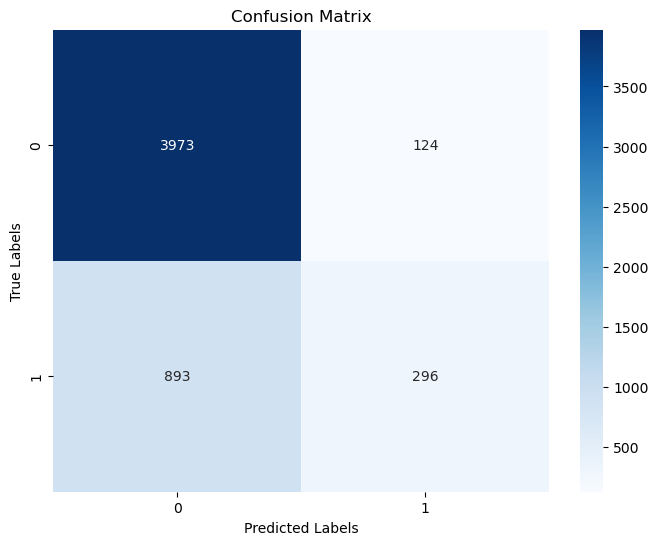

In [34]:
# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of predicted labels:", accuracy)

# Calculate the confusion matrix
cm = sklearn.metrics.confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

True Positives (TP): 296
This represents the number of instances that were actually positive (default) and were correctly predicted as positive by the model.

True Negatives (TN): 3973
This represents the number of instances that were actually negative (non-default) and were correctly predicted as negative by the model.

False Positives (FP): 124
This represents the number of instances that were actually negative (non-default) but were incorrectly predicted as positive (default) by the model.

False Negatives (FN): 893
This represents the number of instances that were actually positive (default) but were incorrectly predicted as negative (non-default) by the model.

In [35]:
# Classification Report
classification_report = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_report)

Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.97      0.89      4097
           1       0.70      0.25      0.37      1189

    accuracy                           0.81      5286
   macro avg       0.76      0.61      0.63      5286
weighted avg       0.79      0.81      0.77      5286



1) Precision: It represents the ability of the model to correctly predict positive instances (class 1) out of all instances it predicted as positive. A precision of 0.82 for class 0 and 0.70 for class 1 indicates that the model has higher precision for class 0 predictions compared to class 1 predictions.

2) Recall: It represents the ability of the model to correctly identify positive instances (class 1) out of all actual positive instances. A recall of 0.97 for class 0 and 0.25 for class 1 indicates that the model performs well in identifying class 0 instances but has a lower recall for class 1 instances.

3) F1-score: It is the harmonic mean of precision and recall, providing a balanced measure of the model's performance. The f1-score of 0.89 for class 0 and 0.37 for class 1 indicates that the model has better overall performance in predicting class 0 instances compared to class 1 instances.

4) Support: It represents the number of occurrences of each class in the testing dataset.

In [36]:
# Calculate training accuracy & testing accuracy
training_accuracy1 = best_model.score(X_train, y_train)
testing_accuracy1 = best_model.score(X_test, y_test)

# Print the result
print("Training Accuracy:", training_accuracy1)
print("Testing Accuracy:", testing_accuracy1)

Training Accuracy: 0.8055148276025162
Testing Accuracy: 0.8076049943246311


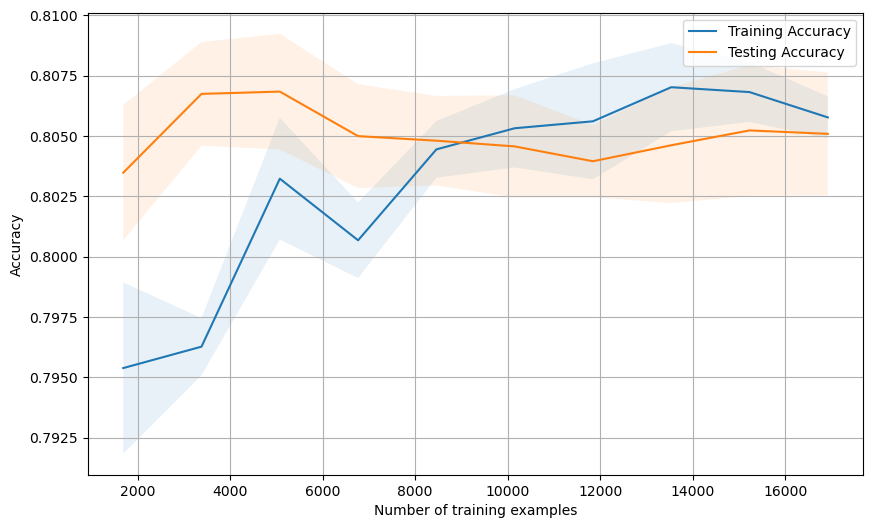

In [37]:
# Define the sizes of the training dataset to use
train_sizes = np.linspace(0.1, 1.0, 10)

# Calculate the learning curve for the logistic regression classifier
train_sizes, train_scores, test_scores = learning_curve(best_model, X_train, y_train, train_sizes=train_sizes, cv=5)

# Calculate the mean and standard deviation of the training and testing accuracies
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
plt.plot(train_sizes, test_mean, label='Testing Accuracy')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1)
plt.xlabel('Number of training examples')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


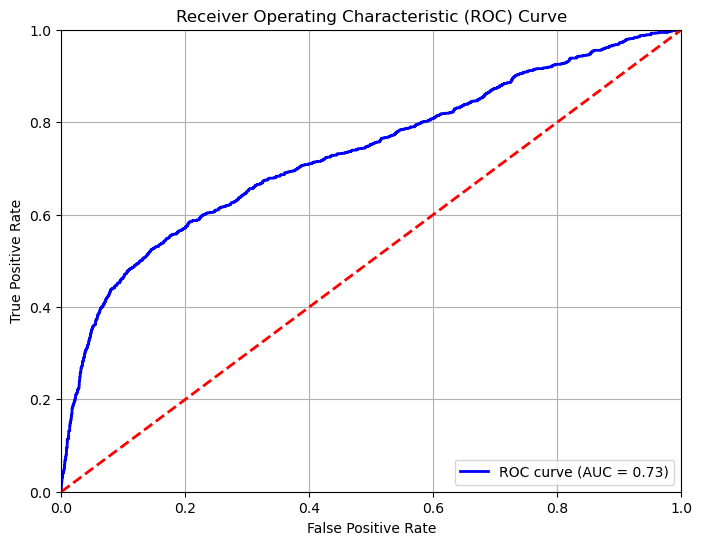

In [38]:
# Calculate the probabilities for the ROC curve
y_prob = best_model.predict_proba(X_test)[:, 1]

# Calculate the false positive rate, true positive rate, and threshold for the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='r', lw=2, linestyle='--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

The ROC curve with an AUC of 0.73, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.

In [39]:
# Test on unseen new data
new_data = pd.DataFrame({'LIMIT_BAL': [20000], 'SEX': [2], 'EDUCATION': [2], 'MARRIAGE': [1], 'AGE': [24], 'PAY_0': [2], 'PAY_2': [2], 'PAY_3': [-1], 'PAY_4': [-1], 'PAY_5': [-2], 'PAY_6': [-2],'BILL_AMT1':[3913],'BILL_AMT2':[3102],'BILL_AMT3':[689],'BILL_AMT4':[0],'BILL_AMT5':[0],'BILL_AMT6':[0],'PAY_AMT1':[0],'PAY_AMT2':[689],'PAY_AMT3':[0],'PAY_AMT4':[0],'PAY_AMT5':[0],'PAY_AMT6':[0]})

# Make predictions on the new data
min_max_scaler = MinMaxScaler()
new_data_scaled = min_max_scaler.fit_transform(new_data)

probabilities = best_model.predict_proba(new_data_scaled)
predictions = probabilities[:, 1]

overall_prob_default = probabilities[:, 1].max()

# Print the overall probability of default
print('Probability of Default:', overall_prob_default)

# Print the predictions
for i, pred in enumerate(predictions):
    print(f"Customer {i+1}: {'Defaulter' if pred > 0.5 else 'Not Defaulter'}")

Probability of Default: 0.06910203776928174
Customer 1: Not Defaulter


The prediction for the new data of probability is 0.0691, which means that the model predicts that the new customer will not default on their credit card payments. 

## Conclusion of Logistic Regression Classifier

We define a parameter grid param_grid with different values for the hyperparameters 'penalty', 'C', 'solver', 'max_iter', 'class_weight', 'multi_class', 'fit_intercept'. 

We create a logistic regression model and then we define the hyperparameters for logistic regression and perform hyperparameter tuning using GridSearchCV() from sklearn.model_selection with cross-validation. The GridSearchCV will iterate over all possible combinations of the hyperparameters and evaluate the model's performance using cross-validation.

Once the grid search is complete, we obtain the best parameters (best_params) and the best score (best_score). We then train a new logistic regression model with the best parameters and make predictions on the test set to evaluate the model's performance.

* The best parameters found for logistic regression, such as the optimal values for the hyperparameters 'C': 100, 'class_weight': None, 'fit_intercept': True, 'max_iter': 100, 'multi_class': 'ovr', 'penalty': 'l2', 'solver': 'liblinear'.
* The best score achieved during the parameter search process, which represents the model's performance on the cross-validated training set is 0.8050.
* Computation time:  0.07808208465576172 seconds
* The accuracy score obtained by the model on the test set, which indicates how well the model generalized to unseen data is 0.8076.
* Plot the confusion matrix where (True Positives (TP): 296, True Negatives (TN): 3973, False Positives (FP): 124, False Negatives (FN): 893)
* The classification report, which provides detailed metrics such as precision, recall, and F1-score for each class, allowing for a more comprehensive evaluation of the model's performance.
* Printed Training and Testing Accuracy (Training Accuracy: 0.8055, Testing Accuracy: 0.8076)
* Plotted Training v/s Testing Accuracy Graph
* The ROC curve with an AUC of 0.73, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.
* The prediction for the new data of probability is  0.0691, which means that the model predicts that the new customer will not default on their credit card payments. 

## Support Vector Machine (SVM) Classifier

In [40]:
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'gamma': ['scale', 'auto'],
    'coef0': [0.0, 0.5, 1.0],
    'shrinking': [True, False],
    'tol': [0.001, 0.01, 0.1],
    'class_weight': [None, 'balanced']
}

In [41]:
# Define the SVM classifier
svm = SVC()

# Perform grid search with cross-validation to find the best parameters
grid_search = GridSearchCV(svm, param_grid, cv=5, n_jobs=-1) 
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10], 'class_weight': [None, 'balanced'],
                         'coef0': [0.0, 0.5, 1.0], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
                         'shrinking': [True, False],
                         'tol': [0.001, 0.01, 0.1]})

In [42]:
# Get the best parameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the result
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'C': 1, 'class_weight': None, 'coef0': 0.0, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': False, 'tol': 0.1}
Best Score: 0.8160145864042327


In [43]:
# Start the timer
start_time = time.time()

# Train the SVM model with the best parameters
svm_model = SVC(**best_params,random_state=42, probability=True)
svm_model.fit(X_train, y_train)

print("--- %s seconds ---" % (time.time() - start_time))

--- 40.52541470527649 seconds ---


Accuracy of predicted labels: 0.8199016269390844


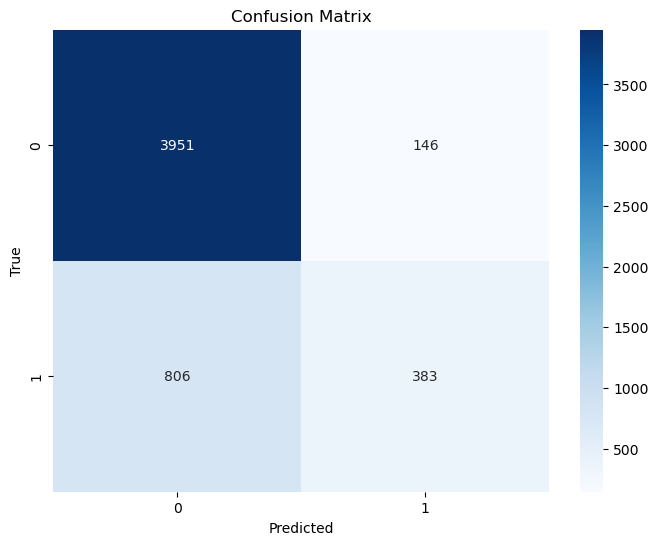

In [44]:
# Make predictions on the test set
y_pred = svm_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of predicted labels:", accuracy)

# Plot the confusion matrix using a heatmap
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

True Positives (TP): 383
This represents the number of instances that were actually positive (default) and were correctly predicted as positive by the model.

True Negatives (TN): 3951
This represents the number of instances that were actually negative (non-default) and were correctly predicted as negative by the model.

False Positives (FP): 146
This represents the number of instances that were actually negative (non-default) but were incorrectly predicted as positive (default) by the model.

False Negatives (FN): 806
This represents the number of instances that were actually positive (default) but were incorrectly predicted as negative (non-default) by the model.

In [45]:
# Classification report
from sklearn.metrics import classification_report

report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.96      0.89      4097
           1       0.72      0.32      0.45      1189

    accuracy                           0.82      5286
   macro avg       0.78      0.64      0.67      5286
weighted avg       0.81      0.82      0.79      5286



1) Precision: It represents the ability of the model to correctly predict positive instances (class 1) out of all instances it predicted as positive. A precision of 0.83 for class 0 and 0.72 for class 1 indicates that the model has higher precision for class 0 predictions compared to class 1 predictions.

2) Recall: It represents the ability of the model to correctly identify positive instances (class 1) out of all actual positive instances. A recall of 0.96 for class 0 and 0.32 for class 1 indicates that the model performs well in identifying class 0 instances but has a lower recall for class 1 instances.

3) F1-score: It is the harmonic mean of precision and recall, providing a balanced measure of the model's performance. The f1-score of 0.89 for class 0 and 0.45 for class 1 indicates that the model has better overall performance in predicting class 0 instances compared to class 1 instances.

4) Support: It represents the number of occurrences of each class in the testing dataset.

In [46]:
# Print the training and testing accuracy
train_accuracy2 = svm_model.score(X_train, y_train)
test_accuracy2 = accuracy_score(y_test, y_pred)
print('Training Accuracy:', train_accuracy2)
print('Testing Accuracy:', test_accuracy2)

Training Accuracy: 0.8181431206545902
Testing Accuracy: 0.8199016269390844


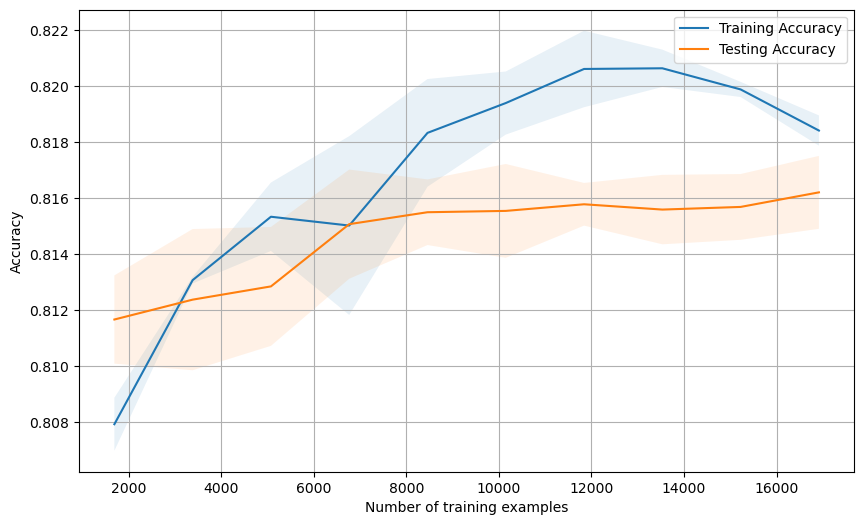

In [47]:
# Define the sizes of the training dataset to use
train_sizes = np.linspace(0.1, 1.0, 10)

# Calculate the learning curve for the logistic regression classifier
train_sizes, train_scores, test_scores = learning_curve(svm_model, X_train, y_train, train_sizes=train_sizes, cv=5)

# Calculate the mean and standard deviation of the training and testing accuracies
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
plt.plot(train_sizes, test_mean, label='Testing Accuracy')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1)
plt.xlabel('Number of training examples')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


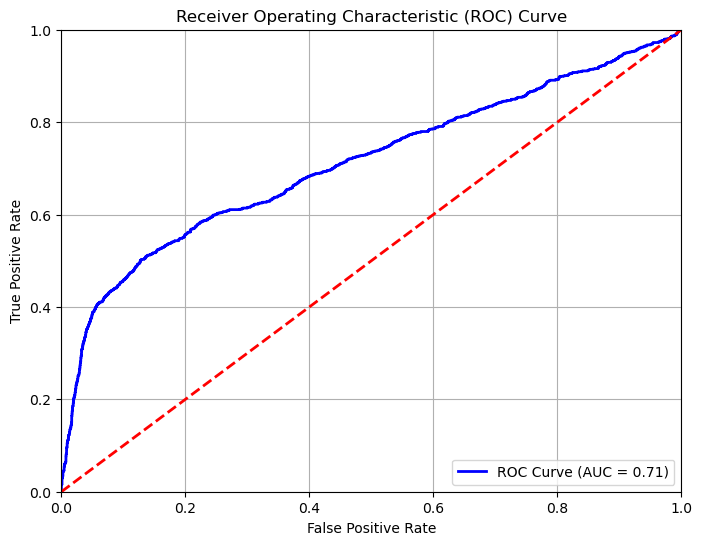

In [48]:
# Plot the ROC curve
y_pred_prob = svm_model.decision_function(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label='ROC Curve (AUC = %0.2f)'% roc_auc)
plt.plot([0, 1], [0, 1], color='r', lw=2, linestyle='--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

The ROC curve with an AUC of 0.71, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.

In [49]:
# Test on unseen new data
new_data = pd.DataFrame({'LIMIT_BAL': [20000], 'SEX': [2], 'EDUCATION': [2], 'MARRIAGE': [1], 'AGE': [24], 'PAY_0': [2], 'PAY_2': [2], 'PAY_3': [-1], 'PAY_4': [-1], 'PAY_5': [-2], 'PAY_6': [-2],'BILL_AMT1':[3913],'BILL_AMT2':[3102],'BILL_AMT3':[689],'BILL_AMT4':[0],'BILL_AMT5':[0],'BILL_AMT6':[0],'PAY_AMT1':[0],'PAY_AMT2':[689],'PAY_AMT3':[0],'PAY_AMT4':[0],'PAY_AMT5':[0],'PAY_AMT6':[0]})

# Make predictions on the new data
min_max_scaler = MinMaxScaler()
new_data_scaled = min_max_scaler.fit_transform(new_data)

probabilities = svm_model.predict_proba(new_data_scaled)
predictions = probabilities[:, 1]

overall_prob_default = probabilities[:, 1].max()

# Print the overall probability of default
print('Probability of Default:', overall_prob_default)

# Print the predictions
for i, pred in enumerate(predictions):
    print(f"Customer {i+1}: {'Defaulter' if pred > 0.5 else 'Not Defaulter'}")

Probability of Default: 0.2080171130652177
Customer 1: Not Defaulter


The prediction for the new data of probability is 0.2080, which means that the model predicts that the new customer will not default on their credit card payments. 

## Conclusion of SVM Classifier

We define a parameter grid param_grid with different values for the hyperparameters 'C', 'kernel', 'gamma','shrinking', 'tol', 'class_weight', 'coef0'.

We create a SVM Classifier model and then we define the hyperparameters for SVM Classifier and perform hyperparameter tuning using GridSearchCV() from sklearn.model_selection with cross-validation. The GridSearchCV will iterate over all possible combinations of the hyperparameters and evaluate the model's performance using cross-validation.

Once the grid search is complete, we obtain the best parameters (best_params) and the best score (best_score). We then train a new SVM Classifier model with the best parameters and make predictions on the test set to evaluate the model's performance.

* The best parameters found for SVM Classifier, such as the optimal values for the hyperparameters'C': 1, 'class_weight': None, 'coef0': 0.0, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': False, 'tol': 0.1.
* The best score achieved during the parameter search process, which represents the model's performance on the cross-validated training set is 0.8160.
* Computation time: 40.52541470527649 seconds
* The accuracy score obtained by the model on the test set, which indicates how well the model generalized to unseen data is 0.8199.
* Plot the confusion matrix where (True Positives (TP): 383, True Negatives (TN): 3951, False Positives (FP): 146, False Negatives (FN): 806)
* The classification report, which provides detailed metrics such as precision, recall, and F1-score for each class, allowing for a more comprehensive evaluation of the model's performance.
* Printed Training and Testing Accuracy (Training Accuracy: 0.8181, Testing Accuracy: 0.8199)
* Plotted Training v/s Testing Accuracy Graph
* The ROC curve with an AUC of 0.71, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.
* The prediction for the new data of probability is 0.2080, which means that the model predicts that the new customer will not default on their credit card payments.

## Artificial Neural Network (ANN) Classifier

In [50]:
# Convert target labels to one-hot encoded format
y_train_encoded = to_categorical(y_train)

# Define the hyperparameters to tune
num_layers = [1, 2, 3, 4]
dropout_rates = [0.2, 0.3, 0.4, 0.5]
learning_rates = [0.001, 0.0001]
batch_sizes = [280, 300, 320]
optimizers = ['Adam', 'SGD', 'RMSprop']

# Define the activation functions to tune
activation_functions = ['relu', 'sigmoid', 'tanh']

# Initialize the best accuracy and best parameters
best_accuracy = -1
best_params = {}
best_model = None
best_train_history = None

# Initialize the best parameter computation time
best_param_computation_time = 0


# Loop through all combinations of hyperparameters and activation functions
for n_layers in num_layers:
    for dropout_rate in dropout_rates:
        for lr in learning_rates:
            for batch_size in batch_sizes:
                for activation_function in activation_functions:
                    for optimizer in optimizers:
                        # Start the timer for parameter computation
                        start_time = time.time()
                        # Define the model
                        model = Sequential()
                        for i in range(n_layers):
                            model.add(Dense(128, input_shape=(23,), activation=activation_function))
                            model.add(Dropout(dropout_rate))
                        model.add(Dense(2, activation="softmax"))

                        # Compile the model
                        optimizer = eval(optimizer)(lr=lr)
                        model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=["accuracy"])

                        # Train the model
                        early_stopping = EarlyStopping(monitor='val_loss', patience=2, verbose=1, mode='min', baseline=None,  restore_best_weights=True)

                        print('Neural Network Model Summary: ')
                        model.summary()

                        start_time = time.time()

                        train_history = model.fit(X_train, y_train_encoded, verbose=1, batch_size=batch_size, epochs=200, validation_split=0.1, callbacks=[early_stopping])

                        accuracy = train_history.history['val_accuracy'][-1]
                        
                        param_computation_time = time.time() - start_time

                        

                        # Printing the parameters after each iteration
                        print(f"n_layers={n_layers}, lr={lr}, dropout_rate={dropout_rate}, batch_size={batch_size}, activation_function={activation_function}, optimizer={optimizer}")

                        # Update the best accuracy and best parameters
                        if accuracy > best_accuracy:
                            best_accuracy = accuracy
                            best_params = {"n_layers": n_layers, "dropout_rate": dropout_rate, "lr": lr, "batch_size": batch_size, "activation_function": activation_function, "optimizer": optimizer}
                            best_model = model
                            best_train_history = train_history.history
                            best_param_computation_time = param_computation_time

                            

print("Best parameters:", best_params)
print("Best score:", best_accuracy)
print("--- %s seconds ---" % (best_param_computation_time))

# Save the best model
best_model.save("best_ANN_model.h5")

# Save the best training history
with open("best_ANN_train_history.pickle", "wb") as file:
    pickle.dump(best_train_history, file)


Neural Network Model Summary: 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               3072      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 1s 3ms/step - loss: 0.5581 - accuracy: 0.7738 - val_loss: 0.5275 - val_accuracy: 0.7664
Epoch 2/200
68/68 [==============================] - 0s 2ms/step - loss: 0.4961 - accuracy: 0.7791 - val_loss: 0.5036 - val_accuracy: 0.7754
Epoch

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9D6CF40>
Neural Network Model Summary: 
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 128)               3072      
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 2ms/step - loss: 0.6234 - accuracy: 0.7696 - val_loss: 0.5916 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8B76880>
Neural Network Model Summary: 
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 128)               3072      
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 2ms/step - loss: 0.5483 - accuracy: 0.7733 - val_loss: 0.5211 - val_accuracy: 0.7

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB88EE250>
Neural Network Model Summary: 
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 128)               3072      
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5734 - accuracy: 0.7514 - val_loss: 0.5407 - val_accur

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE799A30>
Neural Network Model Summary: 
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 128)               3072      
                                                                 
 dropout_4 (Dropout)         (None, 128)               0         
                                                                 
 dense_9 (Dense)             (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 2ms/step - loss: 0.5907 - accuracy: 0.7683 - val_loss: 0.5427 - val_accuracy

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB89BDE50>
Neural Network Model Summary: 
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 128)               3072      
                                                                 
 dropout_5 (Dropout)         (None, 128)               0         
                                                                 
 dense_11 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5633 - accuracy: 0.7497 - val_loss: 0.5375 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC21EFD0>
Neural Network Model Summary: 
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 128)               3072      
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_13 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 2ms/step - loss: 0.5332 - accuracy: 0.7764 - val_loss: 0.5136 - val_ac

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE5EEDF0>
Neural Network Model Summary: 
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_14 (Dense)            (None, 128)               3072      
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_15 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 2ms/step - loss: 0.6148 - accuracy: 0.7564 - val_loss: 0.5759 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE881E20>
Neural Network Model Summary: 
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 128)               3072      
                                                                 
 dropout_8 (Dropout)         (None, 128)               0         
                                                                 
 dense_17 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5185 - accuracy: 0.7783 - val_loss: 0.5056 - val_accuracy: 0.7

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE344B50>
Neural Network Model Summary: 
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_18 (Dense)            (None, 128)               3072      
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                                 
 dense_19 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 1s 3ms/step - loss: 0.5644 - accuracy: 0.7572 - val_loss: 0.5259 - val_accur

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE569DC0>
Neural Network Model Summary: 
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_20 (Dense)            (None, 128)               3072      
                                                                 
 dropout_10 (Dropout)        (None, 128)               0         
                                                                 
 dense_21 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.5620 - val_loss: 0.6406 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9E1ED30>
Neural Network Model Summary: 
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_22 (Dense)            (None, 128)               3072      
                                                                 
 dropout_11 (Dropout)        (None, 128)               0         
                                                                 
 dense_23 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5401 - accuracy: 0.7757 - val_loss: 0.5169 - val_accuracy: 0.

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE69F8E0>
Neural Network Model Summary: 
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 128)               3072      
                                                                 
 dropout_12 (Dropout)        (None, 128)               0         
                                                                 
 dense_25 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5668 - accuracy: 0.7468 - val_loss: 0.5379 - val_accu

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE3F0BB0>
Neural Network Model Summary: 
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_26 (Dense)            (None, 128)               3072      
                                                                 
 dropout_13 (Dropout)        (None, 128)               0         
                                                                 
 dense_27 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5851 - accuracy: 0.7435 - val_loss: 0.5459 - val_accurac

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8A84EB0>
Neural Network Model Summary: 
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 128)               3072      
                                                                 
 dropout_14 (Dropout)        (None, 128)               0         
                                                                 
 dense_29 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5441 - accuracy: 0.7717 - val_loss: 0.5345 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8C94700>
Neural Network Model Summary: 
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_30 (Dense)            (None, 128)               3072      
                                                                 
 dropout_15 (Dropout)        (None, 128)               0         
                                                                 
 dense_31 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5615 - accuracy: 0.7605 - val_loss: 0.5297 - val_a

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8AAEDF0>
Neural Network Model Summary: 
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_32 (Dense)            (None, 128)               3072      
                                                                 
 dropout_16 (Dropout)        (None, 128)               0         
                                                                 
 dense_33 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6186 - accuracy: 0.7572 - val_loss: 0.5818 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8ADE0D0>
Neural Network Model Summary: 
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_34 (Dense)            (None, 128)               3072      
                                                                 
 dropout_17 (Dropout)        (None, 128)               0         
                                                                 
 dense_35 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 2ms/step - loss: 0.5411 - accuracy: 0.7612 - val_loss: 0.5121 - val_accuracy: 0.

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA402D30>
Neural Network Model Summary: 
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_36 (Dense)            (None, 128)               3072      
                                                                 
 dropout_18 (Dropout)        (None, 128)               0         
                                                                 
 dense_37 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.7765 - val_loss: 0.5178 - val_accu

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE2EF7C0>
Neural Network Model Summary: 
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_38 (Dense)            (None, 128)               3072      
                                                                 
 dropout_19 (Dropout)        (None, 128)               0         
                                                                 
 dense_39 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6522 - accuracy: 0.7157 - val_loss: 0.6147 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE36EC70>
Neural Network Model Summary: 
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_40 (Dense)            (None, 128)               3072      
                                                                 
 dropout_20 (Dropout)        (None, 128)               0         
                                                                 
 dense_41 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5475 - accuracy: 0.7747 - val_loss: 0.5231 - val_accuracy: 0.

Neural Network Model Summary: 
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_42 (Dense)            (None, 128)               3072      
                                                                 
 dropout_21 (Dropout)        (None, 128)               0         
                                                                 
 dense_43 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5860 - accuracy: 0.7417 - val_loss: 0.5404 - val_accuracy: 0.7664
Epoch 2/200
60/60 [==============================] - 0s 1ms/step - loss: 0.5332 - accuracy: 0.7765 - val_loss: 0.5300 - val_accuracy: 0.7664
Ep

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE8FDD90>
Neural Network Model Summary: 
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_44 (Dense)            (None, 128)               3072      
                                                                 
 dropout_22 (Dropout)        (None, 128)               0         
                                                                 
 dense_45 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6171 - accuracy: 0.6946 - val_loss: 0.5459 - val_accurac

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EC9F4BFA0>
Neural Network Model Summary: 
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_46 (Dense)            (None, 128)               3072      
                                                                 
 dropout_23 (Dropout)        (None, 128)               0         
                                                                 
 dense_47 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5395 - accuracy: 0.7748 - val_loss: 0.5348 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB8F2640>
Neural Network Model Summary: 
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_48 (Dense)            (None, 128)               3072      
                                                                 
 dropout_24 (Dropout)        (None, 128)               0         
                                                                 
 dense_49 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5493 - accuracy: 0.7692 - val_loss: 0.5258 - val_a

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECDE63BE0>
Neural Network Model Summary: 
Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_50 (Dense)            (None, 128)               3072      
                                                                 
 dropout_25 (Dropout)        (None, 128)               0         
                                                                 
 dense_51 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6466 - accuracy: 0.6771 - val_loss: 0.5930 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECDE63EB0>
Neural Network Model Summary: 
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_52 (Dense)            (None, 128)               3072      
                                                                 
 dropout_26 (Dropout)        (None, 128)               0         
                                                                 
 dense_53 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5226 - accuracy: 0.7766 - val_loss: 0.5107 - val_accuracy: 0.

Neural Network Model Summary: 
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_54 (Dense)            (None, 128)               3072      
                                                                 
 dropout_27 (Dropout)        (None, 128)               0         
                                                                 
 dense_55 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 1s 3ms/step - loss: 0.5410 - accuracy: 0.7742 - val_loss: 0.5201 - val_accuracy: 0.7669
Epoch 2/200
68/68 [==============================] - 0s 2ms/step - loss: 0.4902 - accuracy: 0.7841 - val_loss: 0.5014 - val_accuracy: 0.7801
Ep

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE7AF370>
Neural Network Model Summary: 
Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_56 (Dense)            (None, 128)               3072      
                                                                 
 dropout_28 (Dropout)        (None, 128)               0         
                                                                 
 dense_57 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6845 - accuracy: 0.5654 - val_loss: 0.6310 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE7CF4F0>
Neural Network Model Summary: 
Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_58 (Dense)            (None, 128)               3072      
                                                                 
 dropout_29 (Dropout)        (None, 128)               0         
                                                                 
 dense_59 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5297 - accuracy: 0.7758 - val_loss: 0.5122 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA10B790>
Neural Network Model Summary: 
Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_60 (Dense)            (None, 128)               3072      
                                                                 
 dropout_30 (Dropout)        (None, 128)               0         
                                                                 
 dense_61 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6157 - accuracy: 0.7134 - val_loss: 0.5450 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE5E3550>
Neural Network Model Summary: 
Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_62 (Dense)            (None, 128)               3072      
                                                                 
 dropout_31 (Dropout)        (None, 128)               0         
                                                                 
 dense_63 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5716 - accuracy: 0.7609 - val_loss: 0.5427 - val_accura

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA2E8CA0>
Neural Network Model Summary: 
Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_64 (Dense)            (None, 128)               3072      
                                                                 
 dropout_32 (Dropout)        (None, 128)               0         
                                                                 
 dense_65 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5552 - accuracy: 0.7622 - val_loss: 0.5349 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8C90340>
Neural Network Model Summary: 
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_66 (Dense)            (None, 128)               3072      
                                                                 
 dropout_33 (Dropout)        (None, 128)               0         
                                                                 
 dense_67 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5348 - accuracy: 0.7700 - val_loss: 0.5150 - val_

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA4014C0>
Neural Network Model Summary: 
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_68 (Dense)            (None, 128)               3072      
                                                                 
 dropout_34 (Dropout)        (None, 128)               0         
                                                                 
 dense_69 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6088 - accuracy: 0.7610 - val_loss: 0.5744 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE5F7790>
Neural Network Model Summary: 
Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_70 (Dense)            (None, 128)               3072      
                                                                 
 dropout_35 (Dropout)        (None, 128)               0         
                                                                 
 dense_71 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5295 - accuracy: 0.7696 - val_loss: 0.5091 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE344C10>
Neural Network Model Summary: 
Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_72 (Dense)            (None, 128)               3072      
                                                                 
 dropout_36 (Dropout)        (None, 128)               0         
                                                                 
 dense_73 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5563 - accuracy: 0.7750 - val_loss: 0.5249 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE6EE3A0>
Neural Network Model Summary: 
Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_74 (Dense)            (None, 128)               3072      
                                                                 
 dropout_37 (Dropout)        (None, 128)               0         
                                                                 
 dense_75 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6835 - accuracy: 0.5791 - val_loss: 0.6324 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8C8AF40>
Neural Network Model Summary: 
Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_76 (Dense)            (None, 128)               3072      
                                                                 
 dropout_38 (Dropout)        (None, 128)               0         
                                                                 
 dense_77 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5411 - accuracy: 0.7763 - val_loss: 0.5202 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE525B80>
Neural Network Model Summary: 
Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_78 (Dense)            (None, 128)               3072      
                                                                 
 dropout_39 (Dropout)        (None, 128)               0         
                                                                 
 dense_79 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5620 - accuracy: 0.7676 - val_loss: 0.5394 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA439C40>
Neural Network Model Summary: 
Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_80 (Dense)            (None, 128)               3072      
                                                                 
 dropout_40 (Dropout)        (None, 128)               0         
                                                                 
 dense_81 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5835 - accuracy: 0.7428 - val_loss: 0.5436 - val_accura

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC2A9EB0>
Neural Network Model Summary: 
Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_82 (Dense)            (None, 128)               3072      
                                                                 
 dropout_41 (Dropout)        (None, 128)               0         
                                                                 
 dense_83 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5518 - accuracy: 0.7691 - val_loss: 0.5360 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA03BD60>
Neural Network Model Summary: 
Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_84 (Dense)            (None, 128)               3072      
                                                                 
 dropout_42 (Dropout)        (None, 128)               0         
                                                                 
 dense_85 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 2ms/step - loss: 0.5523 - accuracy: 0.7565 - val_loss: 0.5248 - val_

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECDE3BB50>
Neural Network Model Summary: 
Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_86 (Dense)            (None, 128)               3072      
                                                                 
 dropout_43 (Dropout)        (None, 128)               0         
                                                                 
 dense_87 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6179 - accuracy: 0.7470 - val_loss: 0.5818 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBEA14190>
Neural Network Model Summary: 
Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_88 (Dense)            (None, 128)               3072      
                                                                 
 dropout_44 (Dropout)        (None, 128)               0         
                                                                 
 dense_89 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5368 - accuracy: 0.7709 - val_loss: 0.5140 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC4D6B50>
Neural Network Model Summary: 
Model: "sequential_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_90 (Dense)            (None, 128)               3072      
                                                                 
 dropout_45 (Dropout)        (None, 128)               0         
                                                                 
 dense_91 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5510 - accuracy: 0.7762 - val_loss: 0.5290 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBEA53B20>
Neural Network Model Summary: 
Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_92 (Dense)            (None, 128)               3072      
                                                                 
 dropout_46 (Dropout)        (None, 128)               0         
                                                                 
 dense_93 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 1s 3ms/step - loss: 0.6304 - accuracy: 0.7691 - val_loss: 0.6011 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB795D30>
Neural Network Model Summary: 
Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_94 (Dense)            (None, 128)               3072      
                                                                 
 dropout_47 (Dropout)        (None, 128)               0         
                                                                 
 dense_95 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5440 - accuracy: 0.7721 - val_loss: 0.5191 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE9C7160>
Neural Network Model Summary: 
Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_96 (Dense)            (None, 128)               3072      
                                                                 
 dropout_48 (Dropout)        (None, 128)               0         
                                                                 
 dense_97 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6091 - accuracy: 0.6854 - val_loss: 0.5457 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC2114C0>
Neural Network Model Summary: 
Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_98 (Dense)            (None, 128)               3072      
                                                                 
 dropout_49 (Dropout)        (None, 128)               0         
                                                                 
 dense_99 (Dense)            (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5867 - accuracy: 0.7562 - val_loss: 0.5432 - val_accura

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA44F910>
Neural Network Model Summary: 
Model: "sequential_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_100 (Dense)           (None, 128)               3072      
                                                                 
 dropout_50 (Dropout)        (None, 128)               0         
                                                                 
 dense_101 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6091 - accuracy: 0.6939 - val_loss: 0.5430 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9F8E220>
Neural Network Model Summary: 
Model: "sequential_51"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_102 (Dense)           (None, 128)               3072      
                                                                 
 dropout_51 (Dropout)        (None, 128)               0         
                                                                 
 dense_103 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5599 - accuracy: 0.7590 - val_loss: 0.5288 - val_

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB0D61CD0>
Neural Network Model Summary: 
Model: "sequential_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_104 (Dense)           (None, 128)               3072      
                                                                 
 dropout_52 (Dropout)        (None, 128)               0         
                                                                 
 dense_105 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6280 - accuracy: 0.7265 - val_loss: 0.5841 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE24B910>
Neural Network Model Summary: 
Model: "sequential_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_106 (Dense)           (None, 128)               3072      
                                                                 
 dropout_53 (Dropout)        (None, 128)               0         
                                                                 
 dense_107 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5464 - accuracy: 0.7588 - val_loss: 0.5143 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9E4F040>
Neural Network Model Summary: 
Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_108 (Dense)           (None, 128)               3072      
                                                                 
 dropout_54 (Dropout)        (None, 128)               0         
                                                                 
 dense_109 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5844 - accuracy: 0.7283 - val_loss: 0.5385 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB92F1C0>
Neural Network Model Summary: 
Model: "sequential_55"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_110 (Dense)           (None, 128)               3072      
                                                                 
 dropout_55 (Dropout)        (None, 128)               0         
                                                                 
 dense_111 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.7121 - accuracy: 0.4562 - val_loss: 0.6506 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE45F220>
Neural Network Model Summary: 
Model: "sequential_56"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_112 (Dense)           (None, 128)               3072      
                                                                 
 dropout_56 (Dropout)        (None, 128)               0         
                                                                 
 dense_113 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5493 - accuracy: 0.7648 - val_loss: 0.5185 - val_accuracy: 0.

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE5D96D0>
Neural Network Model Summary: 
Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_114 (Dense)           (None, 128)               3072      
                                                                 
 dropout_57 (Dropout)        (None, 128)               0         
                                                                 
 dense_115 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6195 - accuracy: 0.6933 - val_loss: 0.5419 - val_accu

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE23E9A0>
Neural Network Model Summary: 
Model: "sequential_58"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_116 (Dense)           (None, 128)               3072      
                                                                 
 dropout_58 (Dropout)        (None, 128)               0         
                                                                 
 dense_117 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6244 - accuracy: 0.6841 - val_loss: 0.5458 - val_accurac

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB8FD0A0>
Neural Network Model Summary: 
Model: "sequential_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_118 (Dense)           (None, 128)               3072      
                                                                 
 dropout_59 (Dropout)        (None, 128)               0         
                                                                 
 dense_119 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5551 - accuracy: 0.7645 - val_loss: 0.5355 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EC9F6AD60>
Neural Network Model Summary: 
Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_120 (Dense)           (None, 128)               3072      
                                                                 
 dropout_60 (Dropout)        (None, 128)               0         
                                                                 
 dense_121 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5546 - accuracy: 0.7574 - val_loss: 0.5243 - val_a

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA1FF5B0>
Neural Network Model Summary: 
Model: "sequential_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_122 (Dense)           (None, 128)               3072      
                                                                 
 dropout_61 (Dropout)        (None, 128)               0         
                                                                 
 dense_123 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6172 - accuracy: 0.7355 - val_loss: 0.5805 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE9F6D00>
Neural Network Model Summary: 
Model: "sequential_62"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_124 (Dense)           (None, 128)               3072      
                                                                 
 dropout_62 (Dropout)        (None, 128)               0         
                                                                 
 dense_125 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5328 - accuracy: 0.7703 - val_loss: 0.5137 - val_accuracy: 0.

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE19C7C0>
Neural Network Model Summary: 
Model: "sequential_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_126 (Dense)           (None, 128)               3072      
                                                                 
 dropout_63 (Dropout)        (None, 128)               0         
                                                                 
 dense_127 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5669 - accuracy: 0.7659 - val_loss: 0.5309 - val_accu

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC480F40>
Neural Network Model Summary: 
Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_128 (Dense)           (None, 128)               3072      
                                                                 
 dropout_64 (Dropout)        (None, 128)               0         
                                                                 
 dense_129 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6470 - accuracy: 0.7341 - val_loss: 0.6154 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6B00A0>
Neural Network Model Summary: 
Model: "sequential_65"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_130 (Dense)           (None, 128)               3072      
                                                                 
 dropout_65 (Dropout)        (None, 128)               0         
                                                                 
 dense_131 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 1s 3ms/step - loss: 0.5463 - accuracy: 0.7703 - val_loss: 0.5200 - val_accuracy: 0.

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE9F2EE0>
Neural Network Model Summary: 
Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_132 (Dense)           (None, 128)               3072      
                                                                 
 dropout_66 (Dropout)        (None, 128)               0         
                                                                 
 dense_133 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5636 - accuracy: 0.7659 - val_loss: 0.5387 - val_accu

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC480460>
Neural Network Model Summary: 
Model: "sequential_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_134 (Dense)           (None, 128)               3072      
                                                                 
 dropout_67 (Dropout)        (None, 128)               0         
                                                                 
 dense_135 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6218 - accuracy: 0.6972 - val_loss: 0.5452 - val_accurac

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE7143A0>
Neural Network Model Summary: 
Model: "sequential_68"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_136 (Dense)           (None, 128)               3072      
                                                                 
 dropout_68 (Dropout)        (None, 128)               0         
                                                                 
 dense_137 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5551 - accuracy: 0.7694 - val_loss: 0.5348 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8B79AF0>
Neural Network Model Summary: 
Model: "sequential_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_138 (Dense)           (None, 128)               3072      
                                                                 
 dropout_69 (Dropout)        (None, 128)               0         
                                                                 
 dense_139 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5325 - accuracy: 0.7766 - val_loss: 0.5159 - val_a

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB89A8730>
Neural Network Model Summary: 
Model: "sequential_70"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_140 (Dense)           (None, 128)               3072      
                                                                 
 dropout_70 (Dropout)        (None, 128)               0         
                                                                 
 dense_141 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6522 - accuracy: 0.6742 - val_loss: 0.5829 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB7EF5700>
Neural Network Model Summary: 
Model: "sequential_71"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_142 (Dense)           (None, 128)               3072      
                                                                 
 dropout_71 (Dropout)        (None, 128)               0         
                                                                 
 dense_143 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5346 - accuracy: 0.7670 - val_loss: 0.5115 - val_accuracy: 0.

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9FE3A90>
Neural Network Model Summary: 
Model: "sequential_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_144 (Dense)           (None, 128)               3072      
                                                                 
 dropout_72 (Dropout)        (None, 128)               0         
                                                                 
 dense_145 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5700 - accuracy: 0.7640 - val_loss: 0.5339 - val_accu

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8BBD7F0>
Neural Network Model Summary: 
Model: "sequential_73"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_146 (Dense)           (None, 128)               3072      
                                                                 
 dropout_73 (Dropout)        (None, 128)               0         
                                                                 
 dense_147 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6486 - accuracy: 0.7376 - val_loss: 0.6168 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE7F5760>
Neural Network Model Summary: 
Model: "sequential_74"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_148 (Dense)           (None, 128)               3072      
                                                                 
 dropout_74 (Dropout)        (None, 128)               0         
                                                                 
 dense_149 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5415 - accuracy: 0.7713 - val_loss: 0.5209 - val_accuracy: 0.

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE5F7FA0>
Neural Network Model Summary: 
Model: "sequential_75"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_150 (Dense)           (None, 128)               3072      
                                                                 
 dropout_75 (Dropout)        (None, 128)               0         
                                                                 
 dense_151 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5728 - accuracy: 0.7601 - val_loss: 0.5401 - val_accu

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE4C0580>
Neural Network Model Summary: 
Model: "sequential_76"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_152 (Dense)           (None, 128)               3072      
                                                                 
 dropout_76 (Dropout)        (None, 128)               0         
                                                                 
 dense_153 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6210 - accuracy: 0.6887 - val_loss: 0.5451 - val_accurac

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE0CC610>
Neural Network Model Summary: 
Model: "sequential_77"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_154 (Dense)           (None, 128)               3072      
                                                                 
 dropout_77 (Dropout)        (None, 128)               0         
                                                                 
 dense_155 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5444 - accuracy: 0.7758 - val_loss: 0.5381 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC4FAC70>
Neural Network Model Summary: 
Model: "sequential_78"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_156 (Dense)           (None, 128)               3072      
                                                                 
 dropout_78 (Dropout)        (None, 128)               0         
                                                                 
 dense_157 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5495 - accuracy: 0.7683 - val_loss: 0.5240 - val_a

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE8C25E0>
Neural Network Model Summary: 
Model: "sequential_79"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_158 (Dense)           (None, 128)               3072      
                                                                 
 dropout_79 (Dropout)        (None, 128)               0         
                                                                 
 dense_159 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6012 - accuracy: 0.7718 - val_loss: 0.5713 - val_accuracy: 

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE71F100>
Neural Network Model Summary: 
Model: "sequential_80"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_160 (Dense)           (None, 128)               3072      
                                                                 
 dropout_80 (Dropout)        (None, 128)               0         
                                                                 
 dense_161 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5467 - accuracy: 0.7611 - val_loss: 0.5164 - val_accuracy: 0.

n_layers=1, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE3D2EE0>
Neural Network Model Summary: 
Model: "sequential_81"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_162 (Dense)           (None, 128)               3072      
                                                                 
 dropout_81 (Dropout)        (None, 128)               0         
                                                                 
 dense_163 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5497 - accuracy: 0.7763 - val_loss: 0.5234 - val_accu

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC2A8FD0>
Neural Network Model Summary: 
Model: "sequential_82"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_164 (Dense)           (None, 128)               3072      
                                                                 
 dropout_82 (Dropout)        (None, 128)               0         
                                                                 
 dense_165 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6188 - accuracy: 0.7726 - val_loss: 0.5916 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE782EB0>
Neural Network Model Summary: 
Model: "sequential_83"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_166 (Dense)           (None, 128)               3072      
                                                                 
 dropout_83 (Dropout)        (None, 128)               0         
                                                                 
 dense_167 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5505 - accuracy: 0.7625 - val_loss: 0.5189 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE14A400>
Neural Network Model Summary: 
Model: "sequential_84"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_168 (Dense)           (None, 128)               3072      
                                                                 
 dropout_84 (Dropout)        (None, 128)               0         
                                                                 
 dense_169 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 1s 3ms/step - loss: 0.5671 - accuracy: 0.7683 - val_loss: 0.5362 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB7C3F70>
Neural Network Model Summary: 
Model: "sequential_85"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_170 (Dense)           (None, 128)               3072      
                                                                 
 dropout_85 (Dropout)        (None, 128)               0         
                                                                 
 dense_171 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6067 - accuracy: 0.7092 - val_loss: 0.5455 - val_accura

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB44663A0>
Neural Network Model Summary: 
Model: "sequential_86"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_172 (Dense)           (None, 128)               3072      
                                                                 
 dropout_86 (Dropout)        (None, 128)               0         
                                                                 
 dense_173 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.7765 - val_loss: 0.5303 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC23DD90>
Neural Network Model Summary: 
Model: "sequential_87"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_174 (Dense)           (None, 128)               3072      
                                                                 
 dropout_87 (Dropout)        (None, 128)               0         
                                                                 
 dense_175 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5436 - accuracy: 0.7741 - val_loss: 0.5198 - val_

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE567C10>
Neural Network Model Summary: 
Model: "sequential_88"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_176 (Dense)           (None, 128)               3072      
                                                                 
 dropout_88 (Dropout)        (None, 128)               0         
                                                                 
 dense_177 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6217 - accuracy: 0.7329 - val_loss: 0.5775 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC1CD400>
Neural Network Model Summary: 
Model: "sequential_89"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_178 (Dense)           (None, 128)               3072      
                                                                 
 dropout_89 (Dropout)        (None, 128)               0         
                                                                 
 dense_179 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5329 - accuracy: 0.7706 - val_loss: 0.5121 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE9C71C0>
Neural Network Model Summary: 
Model: "sequential_90"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_180 (Dense)           (None, 128)               3072      
                                                                 
 dropout_90 (Dropout)        (None, 128)               0         
                                                                 
 dense_181 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5566 - accuracy: 0.7749 - val_loss: 0.5279 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC1440D0>
Neural Network Model Summary: 
Model: "sequential_91"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_182 (Dense)           (None, 128)               3072      
                                                                 
 dropout_91 (Dropout)        (None, 128)               0         
                                                                 
 dense_183 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6613 - accuracy: 0.6569 - val_loss: 0.6112 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE7529D0>
Neural Network Model Summary: 
Model: "sequential_92"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_184 (Dense)           (None, 128)               3072      
                                                                 
 dropout_92 (Dropout)        (None, 128)               0         
                                                                 
 dense_185 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5395 - accuracy: 0.7764 - val_loss: 0.5167 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8BA9A90>
Neural Network Model Summary: 
Model: "sequential_93"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_186 (Dense)           (None, 128)               3072      
                                                                 
 dropout_93 (Dropout)        (None, 128)               0         
                                                                 
 dense_187 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5956 - accuracy: 0.7571 - val_loss: 0.5442 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB876A30>
Neural Network Model Summary: 
Model: "sequential_94"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_188 (Dense)           (None, 128)               3072      
                                                                 
 dropout_94 (Dropout)        (None, 128)               0         
                                                                 
 dense_189 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6241 - accuracy: 0.6837 - val_loss: 0.5438 - val_accura

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB89210A0>
Neural Network Model Summary: 
Model: "sequential_95"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_190 (Dense)           (None, 128)               3072      
                                                                 
 dropout_95 (Dropout)        (None, 128)               0         
                                                                 
 dense_191 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5482 - accuracy: 0.7752 - val_loss: 0.5349 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA437850>
Neural Network Model Summary: 
Model: "sequential_96"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_192 (Dense)           (None, 128)               3072      
                                                                 
 dropout_96 (Dropout)        (None, 128)               0         
                                                                 
 dense_193 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5400 - accuracy: 0.7753 - val_loss: 0.5181 - val_

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE96DA60>
Neural Network Model Summary: 
Model: "sequential_97"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_194 (Dense)           (None, 128)               3072      
                                                                 
 dropout_97 (Dropout)        (None, 128)               0         
                                                                 
 dense_195 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6388 - accuracy: 0.7038 - val_loss: 0.5913 - val_accuracy:

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEA76EE0>
Neural Network Model Summary: 
Model: "sequential_98"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_196 (Dense)           (None, 128)               3072      
                                                                 
 dropout_98 (Dropout)        (None, 128)               0         
                                                                 
 dense_197 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5284 - accuracy: 0.7769 - val_loss: 0.5100 - val_accuracy: 0

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE71C790>
Neural Network Model Summary: 
Model: "sequential_99"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_198 (Dense)           (None, 128)               3072      
                                                                 
 dropout_99 (Dropout)        (None, 128)               0         
                                                                 
 dense_199 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5787 - accuracy: 0.7542 - val_loss: 0.5376 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE3B15B0>
Neural Network Model Summary: 
Model: "sequential_100"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_200 (Dense)           (None, 128)               3072      
                                                                 
 dropout_100 (Dropout)       (None, 128)               0         
                                                                 
 dense_201 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6520 - accuracy: 0.6985 - val_loss: 0.6137 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8B764F0>
Neural Network Model Summary: 
Model: "sequential_101"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_202 (Dense)           (None, 128)               3072      
                                                                 
 dropout_101 (Dropout)       (None, 128)               0         
                                                                 
 dense_203 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5643 - accuracy: 0.7567 - val_loss: 0.5241 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE1734F0>
Neural Network Model Summary: 
Model: "sequential_102"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_204 (Dense)           (None, 128)               3072      
                                                                 
 dropout_102 (Dropout)       (None, 128)               0         
                                                                 
 dense_205 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5887 - accuracy: 0.7356 - val_loss: 0.5433 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA17F5B0>
Neural Network Model Summary: 
Model: "sequential_103"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_206 (Dense)           (None, 128)               3072      
                                                                 
 dropout_103 (Dropout)       (None, 128)               0         
                                                                 
 dense_207 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 1s 3ms/step - loss: 0.6037 - accuracy: 0.7307 - val_loss: 0.5446 - val_accur

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE7B2EB0>
Neural Network Model Summary: 
Model: "sequential_104"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_208 (Dense)           (None, 128)               3072      
                                                                 
 dropout_104 (Dropout)       (None, 128)               0         
                                                                 
 dense_209 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5726 - accuracy: 0.7504 - val_loss: 0.5401 - val_accurac

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE4CCFD0>
Neural Network Model Summary: 
Model: "sequential_105"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_210 (Dense)           (None, 128)               3072      
                                                                 
 dropout_105 (Dropout)       (None, 128)               0         
                                                                 
 dense_211 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5408 - accuracy: 0.7764 - val_loss: 0.5164 - val

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE3B1B50>
Neural Network Model Summary: 
Model: "sequential_106"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_212 (Dense)           (None, 128)               3072      
                                                                 
 dropout_106 (Dropout)       (None, 128)               0         
                                                                 
 dense_213 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6262 - accuracy: 0.7404 - val_loss: 0.5839 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE2EDC10>
Neural Network Model Summary: 
Model: "sequential_107"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_214 (Dense)           (None, 128)               3072      
                                                                 
 dropout_107 (Dropout)       (None, 128)               0         
                                                                 
 dense_215 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5373 - accuracy: 0.7670 - val_loss: 0.5161 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE2ED520>
Neural Network Model Summary: 
Model: "sequential_108"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_216 (Dense)           (None, 128)               3072      
                                                                 
 dropout_108 (Dropout)       (None, 128)               0         
                                                                 
 dense_217 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5570 - accuracy: 0.7706 - val_loss: 0.5255 - val_ac

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8A34CD0>
Neural Network Model Summary: 
Model: "sequential_109"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_218 (Dense)           (None, 128)               3072      
                                                                 
 dropout_109 (Dropout)       (None, 128)               0         
                                                                 
 dense_219 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6475 - accuracy: 0.7019 - val_loss: 0.6042 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE6675B0>
Neural Network Model Summary: 
Model: "sequential_110"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_220 (Dense)           (None, 128)               3072      
                                                                 
 dropout_110 (Dropout)       (None, 128)               0         
                                                                 
 dense_221 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5483 - accuracy: 0.7740 - val_loss: 0.5208 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB876B50>
Neural Network Model Summary: 
Model: "sequential_111"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_222 (Dense)           (None, 128)               3072      
                                                                 
 dropout_111 (Dropout)       (None, 128)               0         
                                                                 
 dense_223 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6048 - accuracy: 0.7375 - val_loss: 0.5443 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8996F70>
Neural Network Model Summary: 
Model: "sequential_112"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_224 (Dense)           (None, 128)               3072      
                                                                 
 dropout_112 (Dropout)       (None, 128)               0         
                                                                 
 dense_225 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6939 - accuracy: 0.6133 - val_loss: 0.5450 - val_accura

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB44B7EB0>
Neural Network Model Summary: 
Model: "sequential_113"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_226 (Dense)           (None, 128)               3072      
                                                                 
 dropout_113 (Dropout)       (None, 128)               0         
                                                                 
 dense_227 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6207 - accuracy: 0.6982 - val_loss: 0.5405 - val_accuracy

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8AF9400>
Neural Network Model Summary: 
Model: "sequential_114"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_228 (Dense)           (None, 128)               3072      
                                                                 
 dropout_114 (Dropout)       (None, 128)               0         
                                                                 
 dense_229 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5626 - accuracy: 0.7512 - val_loss: 0.5297 - val_

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EC9F65A60>
Neural Network Model Summary: 
Model: "sequential_115"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_230 (Dense)           (None, 128)               3072      
                                                                 
 dropout_115 (Dropout)       (None, 128)               0         
                                                                 
 dense_231 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 2ms/step - loss: 0.6015 - accuracy: 0.7678 - val_loss: 0.5717 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA2320A0>
Neural Network Model Summary: 
Model: "sequential_116"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_232 (Dense)           (None, 128)               3072      
                                                                 
 dropout_116 (Dropout)       (None, 128)               0         
                                                                 
 dense_233 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5386 - accuracy: 0.7659 - val_loss: 0.5119 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB76B730>
Neural Network Model Summary: 
Model: "sequential_117"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_234 (Dense)           (None, 128)               3072      
                                                                 
 dropout_117 (Dropout)       (None, 128)               0         
                                                                 
 dense_235 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5587 - accuracy: 0.7724 - val_loss: 0.5258 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA02B7F0>
Neural Network Model Summary: 
Model: "sequential_118"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_236 (Dense)           (None, 128)               3072      
                                                                 
 dropout_118 (Dropout)       (None, 128)               0         
                                                                 
 dense_237 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6604 - accuracy: 0.6781 - val_loss: 0.6180 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6EA430>
Neural Network Model Summary: 
Model: "sequential_119"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_238 (Dense)           (None, 128)               3072      
                                                                 
 dropout_119 (Dropout)       (None, 128)               0         
                                                                 
 dense_239 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5535 - accuracy: 0.7644 - val_loss: 0.5235 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE623AC0>
Neural Network Model Summary: 
Model: "sequential_120"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_240 (Dense)           (None, 128)               3072      
                                                                 
 dropout_120 (Dropout)       (None, 128)               0         
                                                                 
 dense_241 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 1s 3ms/step - loss: 0.5784 - accuracy: 0.7519 - val_loss: 0.5380 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEA30220>
Neural Network Model Summary: 
Model: "sequential_121"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_242 (Dense)           (None, 128)               3072      
                                                                 
 dropout_121 (Dropout)       (None, 128)               0         
                                                                 
 dense_243 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 4ms/step - loss: 0.6107 - accuracy: 0.7195 - val_loss: 0.5435 - val_accura

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE76AE80>
Neural Network Model Summary: 
Model: "sequential_122"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_244 (Dense)           (None, 128)               3072      
                                                                 
 dropout_122 (Dropout)       (None, 128)               0         
                                                                 
 dense_245 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 1s 3ms/step - loss: 0.5699 - accuracy: 0.7586 - val_loss: 0.5357 - val_accuracy

Neural Network Model Summary: 
Model: "sequential_123"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_246 (Dense)           (None, 128)               3072      
                                                                 
 dropout_123 (Dropout)       (None, 128)               0         
                                                                 
 dense_247 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5496 - accuracy: 0.7646 - val_loss: 0.5207 - val_accuracy: 0.7664
Epoch 2/200
64/64 [==============================] - 0s 2ms/step - loss: 0.4943 - accuracy: 0.7834 - val_loss: 0.5018 - val_accuracy: 0.7825
E

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB3B7B880>
Neural Network Model Summary: 
Model: "sequential_124"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_248 (Dense)           (None, 128)               3072      
                                                                 
 dropout_124 (Dropout)       (None, 128)               0         
                                                                 
 dense_249 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6134 - accuracy: 0.7667 - val_loss: 0.5818 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9D624C0>
Neural Network Model Summary: 
Model: "sequential_125"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_250 (Dense)           (None, 128)               3072      
                                                                 
 dropout_125 (Dropout)       (None, 128)               0         
                                                                 
 dense_251 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5308 - accuracy: 0.7755 - val_loss: 0.5113 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE72AB50>
Neural Network Model Summary: 
Model: "sequential_126"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_252 (Dense)           (None, 128)               3072      
                                                                 
 dropout_126 (Dropout)       (None, 128)               0         
                                                                 
 dense_253 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5659 - accuracy: 0.7597 - val_loss: 0.5293 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE932280>
Neural Network Model Summary: 
Model: "sequential_127"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_254 (Dense)           (None, 128)               3072      
                                                                 
 dropout_127 (Dropout)       (None, 128)               0         
                                                                 
 dense_255 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6585 - accuracy: 0.6940 - val_loss: 0.6199 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6A0700>
Neural Network Model Summary: 
Model: "sequential_128"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_256 (Dense)           (None, 128)               3072      
                                                                 
 dropout_128 (Dropout)       (None, 128)               0         
                                                                 
 dense_257 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5623 - accuracy: 0.7592 - val_loss: 0.5272 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EC9F65280>
Neural Network Model Summary: 
Model: "sequential_129"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_258 (Dense)           (None, 128)               3072      
                                                                 
 dropout_129 (Dropout)       (None, 128)               0         
                                                                 
 dense_259 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6074 - accuracy: 0.7270 - val_loss: 0.5447 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA220A30>
Neural Network Model Summary: 
Model: "sequential_130"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_260 (Dense)           (None, 128)               3072      
                                                                 
 dropout_130 (Dropout)       (None, 128)               0         
                                                                 
 dense_261 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5812 - accuracy: 0.7602 - val_loss: 0.5453 - val_accura

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB48095B0>
Neural Network Model Summary: 
Model: "sequential_131"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_262 (Dense)           (None, 128)               3072      
                                                                 
 dropout_131 (Dropout)       (None, 128)               0         
                                                                 
 dense_263 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 4ms/step - loss: 0.5980 - accuracy: 0.7485 - val_loss: 0.5388 - val_accuracy

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE24BD00>
Neural Network Model Summary: 
Model: "sequential_132"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_264 (Dense)           (None, 128)               3072      
                                                                 
 dropout_132 (Dropout)       (None, 128)               0         
                                                                 
 dense_265 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5415 - accuracy: 0.7720 - val_loss: 0.5185 - val_

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE0D24F0>
Neural Network Model Summary: 
Model: "sequential_133"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_266 (Dense)           (None, 128)               3072      
                                                                 
 dropout_133 (Dropout)       (None, 128)               0         
                                                                 
 dense_267 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6083 - accuracy: 0.7563 - val_loss: 0.5699 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC20F550>
Neural Network Model Summary: 
Model: "sequential_134"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_268 (Dense)           (None, 128)               3072      
                                                                 
 dropout_134 (Dropout)       (None, 128)               0         
                                                                 
 dense_269 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5394 - accuracy: 0.7708 - val_loss: 0.5171 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEA5F9A0>
Neural Network Model Summary: 
Model: "sequential_135"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_270 (Dense)           (None, 128)               3072      
                                                                 
 dropout_135 (Dropout)       (None, 128)               0         
                                                                 
 dense_271 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5694 - accuracy: 0.7518 - val_loss: 0.5296 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE0FF6D0>
Neural Network Model Summary: 
Model: "sequential_136"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_272 (Dense)           (None, 128)               3072      
                                                                 
 dropout_136 (Dropout)       (None, 128)               0         
                                                                 
 dense_273 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6636 - accuracy: 0.6609 - val_loss: 0.6172 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA1F4310>
Neural Network Model Summary: 
Model: "sequential_137"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_274 (Dense)           (None, 128)               3072      
                                                                 
 dropout_137 (Dropout)       (None, 128)               0         
                                                                 
 dense_275 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5414 - accuracy: 0.7732 - val_loss: 0.5182 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE57D9D0>
Neural Network Model Summary: 
Model: "sequential_138"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_276 (Dense)           (None, 128)               3072      
                                                                 
 dropout_138 (Dropout)       (None, 128)               0         
                                                                 
 dense_277 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 1s 3ms/step - loss: 0.5718 - accuracy: 0.7598 - val_loss: 0.5376 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EC9FA3730>
Neural Network Model Summary: 
Model: "sequential_139"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_278 (Dense)           (None, 128)               3072      
                                                                 
 dropout_139 (Dropout)       (None, 128)               0         
                                                                 
 dense_279 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6200 - accuracy: 0.7204 - val_loss: 0.5458 - val_accur

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE2506A0>
Neural Network Model Summary: 
Model: "sequential_140"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_280 (Dense)           (None, 128)               3072      
                                                                 
 dropout_140 (Dropout)       (None, 128)               0         
                                                                 
 dense_281 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5542 - accuracy: 0.7749 - val_loss: 0.5350 - val_accurac

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9F68100>
Neural Network Model Summary: 
Model: "sequential_141"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_282 (Dense)           (None, 128)               3072      
                                                                 
 dropout_141 (Dropout)       (None, 128)               0         
                                                                 
 dense_283 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 1s 7ms/step - loss: 0.5681 - accuracy: 0.7498 - val_loss: 0.5287 - val

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEA53BB0>
Neural Network Model Summary: 
Model: "sequential_142"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_284 (Dense)           (None, 128)               3072      
                                                                 
 dropout_142 (Dropout)       (None, 128)               0         
                                                                 
 dense_285 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6412 - accuracy: 0.6953 - val_loss: 0.5867 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE461550>
Neural Network Model Summary: 
Model: "sequential_143"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_286 (Dense)           (None, 128)               3072      
                                                                 
 dropout_143 (Dropout)       (None, 128)               0         
                                                                 
 dense_287 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5264 - accuracy: 0.7765 - val_loss: 0.5091 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8A7BA30>
Neural Network Model Summary: 
Model: "sequential_144"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_288 (Dense)           (None, 128)               3072      
                                                                 
 dropout_144 (Dropout)       (None, 128)               0         
                                                                 
 dense_289 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 1s 3ms/step - loss: 0.5612 - accuracy: 0.7733 - val_loss: 0.5277 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC219790>
Neural Network Model Summary: 
Model: "sequential_145"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_290 (Dense)           (None, 128)               3072      
                                                                 
 dropout_145 (Dropout)       (None, 128)               0         
                                                                 
 dense_291 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5978 - accuracy: 0.7763 - val_loss: 0.5806 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE1736D0>
Neural Network Model Summary: 
Model: "sequential_146"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_292 (Dense)           (None, 128)               3072      
                                                                 
 dropout_146 (Dropout)       (None, 128)               0         
                                                                 
 dense_293 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5435 - accuracy: 0.7759 - val_loss: 0.5210 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA343E50>
Neural Network Model Summary: 
Model: "sequential_147"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_294 (Dense)           (None, 128)               3072      
                                                                 
 dropout_147 (Dropout)       (None, 128)               0         
                                                                 
 dense_295 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 1s 3ms/step - loss: 0.5828 - accuracy: 0.7506 - val_loss: 0.5389 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC20F3D0>
Neural Network Model Summary: 
Model: "sequential_148"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_296 (Dense)           (None, 128)               3072      
                                                                 
 dropout_148 (Dropout)       (None, 128)               0         
                                                                 
 dense_297 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5939 - accuracy: 0.7554 - val_loss: 0.5449 - val_accur

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECDE63670>
Neural Network Model Summary: 
Model: "sequential_149"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_298 (Dense)           (None, 128)               3072      
                                                                 
 dropout_149 (Dropout)       (None, 128)               0         
                                                                 
 dense_299 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5707 - accuracy: 0.7625 - val_loss: 0.5361 - val_accurac

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB84D5B0>
Neural Network Model Summary: 
Model: "sequential_150"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_300 (Dense)           (None, 128)               3072      
                                                                 
 dropout_150 (Dropout)       (None, 128)               0         
                                                                 
 dense_301 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5535 - accuracy: 0.7574 - val_loss: 0.5248 - val

Neural Network Model Summary: 
Model: "sequential_151"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_302 (Dense)           (None, 128)               3072      
                                                                 
 dropout_151 (Dropout)       (None, 128)               0         
                                                                 
 dense_303 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5942 - accuracy: 0.7729 - val_loss: 0.5689 - val_accuracy: 0.7664
Epoch 2/200
64/64 [==============================] - 0s 2ms/step - loss: 0.5573 - accuracy: 0.7765 - val_loss: 0.5538 - val_accuracy: 0.7664
E

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB6C8E20>
Neural Network Model Summary: 
Model: "sequential_152"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_304 (Dense)           (None, 128)               3072      
                                                                 
 dropout_152 (Dropout)       (None, 128)               0         
                                                                 
 dense_305 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5301 - accuracy: 0.7755 - val_loss: 0.5109 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE42CB80>
Neural Network Model Summary: 
Model: "sequential_153"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_306 (Dense)           (None, 128)               3072      
                                                                 
 dropout_153 (Dropout)       (None, 128)               0         
                                                                 
 dense_307 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5686 - accuracy: 0.7567 - val_loss: 0.5326 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB7BF7F0>
Neural Network Model Summary: 
Model: "sequential_154"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_308 (Dense)           (None, 128)               3072      
                                                                 
 dropout_154 (Dropout)       (None, 128)               0         
                                                                 
 dense_309 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6283 - accuracy: 0.7409 - val_loss: 0.5984 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA088C10>
Neural Network Model Summary: 
Model: "sequential_155"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_310 (Dense)           (None, 128)               3072      
                                                                 
 dropout_155 (Dropout)       (None, 128)               0         
                                                                 
 dense_311 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5575 - accuracy: 0.7647 - val_loss: 0.5240 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB7C2E50>
Neural Network Model Summary: 
Model: "sequential_156"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_312 (Dense)           (None, 128)               3072      
                                                                 
 dropout_156 (Dropout)       (None, 128)               0         
                                                                 
 dense_313 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5784 - accuracy: 0.7653 - val_loss: 0.5396 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE08D1C0>
Neural Network Model Summary: 
Model: "sequential_157"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_314 (Dense)           (None, 128)               3072      
                                                                 
 dropout_157 (Dropout)       (None, 128)               0         
                                                                 
 dense_315 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6323 - accuracy: 0.6841 - val_loss: 0.5453 - val_accur

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA18CD00>
Neural Network Model Summary: 
Model: "sequential_158"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_316 (Dense)           (None, 128)               3072      
                                                                 
 dropout_158 (Dropout)       (None, 128)               0         
                                                                 
 dense_317 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5795 - accuracy: 0.7423 - val_loss: 0.5369 - val_accurac

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA401610>
Neural Network Model Summary: 
Model: "sequential_159"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_318 (Dense)           (None, 128)               3072      
                                                                 
 dropout_159 (Dropout)       (None, 128)               0         
                                                                 
 dense_319 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5628 - accuracy: 0.7580 - val_loss: 0.5282 - val

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB784850>
Neural Network Model Summary: 
Model: "sequential_160"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_320 (Dense)           (None, 128)               3072      
                                                                 
 dropout_160 (Dropout)       (None, 128)               0         
                                                                 
 dense_321 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 1s 8ms/step - loss: 0.6336 - accuracy: 0.7245 - val_loss: 0.5819 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB7D91C0>
Neural Network Model Summary: 
Model: "sequential_161"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_322 (Dense)           (None, 128)               3072      
                                                                 
 dropout_161 (Dropout)       (None, 128)               0         
                                                                 
 dense_323 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 4ms/step - loss: 0.5346 - accuracy: 0.7735 - val_loss: 0.5127 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB440AFA0>
Neural Network Model Summary: 
Model: "sequential_162"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_324 (Dense)           (None, 128)               3072      
                                                                 
 dropout_162 (Dropout)       (None, 128)               0         
                                                                 
 dense_325 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 1s 3ms/step - loss: 0.5698 - accuracy: 0.7543 - val_loss: 0.5319 - val_ac

Neural Network Model Summary: 
Model: "sequential_163"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_326 (Dense)           (None, 128)               3072      
                                                                 
 dropout_163 (Dropout)       (None, 128)               0         
                                                                 
 dense_327 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6680 - accuracy: 0.6369 - val_loss: 0.6211 - val_accuracy: 0.7664
Epoch 2/200
68/68 [==============================] - 0s 2ms/step - loss: 0.6009 - accuracy: 0.7735 - val_loss: 0.5829 - val_accuracy: 0.7664
E

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA158A00>
Neural Network Model Summary: 
Model: "sequential_164"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_328 (Dense)           (None, 128)               3072      
                                                                 
 dropout_164 (Dropout)       (None, 128)               0         
                                                                 
 dense_329 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5419 - accuracy: 0.7730 - val_loss: 0.5170 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9FE3730>
Neural Network Model Summary: 
Model: "sequential_165"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_330 (Dense)           (None, 128)               3072      
                                                                 
 dropout_165 (Dropout)       (None, 128)               0         
                                                                 
 dense_331 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5922 - accuracy: 0.7465 - val_loss: 0.5388 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE9F6520>
Neural Network Model Summary: 
Model: "sequential_166"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_332 (Dense)           (None, 128)               3072      
                                                                 
 dropout_166 (Dropout)       (None, 128)               0         
                                                                 
 dense_333 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6136 - accuracy: 0.7367 - val_loss: 0.5435 - val_accura

Neural Network Model Summary: 
Model: "sequential_167"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_334 (Dense)           (None, 128)               3072      
                                                                 
 dropout_167 (Dropout)       (None, 128)               0         
                                                                 
 dense_335 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5926 - accuracy: 0.7448 - val_loss: 0.5371 - val_accuracy: 0.7664
Epoch 2/200
68/68 [==============================] - 0s 2ms/step - loss: 0.5490 - accuracy: 0.7750 - val_loss: 0.5275 - val_accuracy: 0.7664
E

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8BF9520>
Neural Network Model Summary: 
Model: "sequential_168"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_336 (Dense)           (None, 128)               3072      
                                                                 
 dropout_168 (Dropout)       (None, 128)               0         
                                                                 
 dense_337 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5509 - accuracy: 0.7692 - val_loss: 0.5214 - val_

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE48B2B0>
Neural Network Model Summary: 
Model: "sequential_169"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_338 (Dense)           (None, 128)               3072      
                                                                 
 dropout_169 (Dropout)       (None, 128)               0         
                                                                 
 dense_339 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6556 - accuracy: 0.6442 - val_loss: 0.5920 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9F1D520>
Neural Network Model Summary: 
Model: "sequential_170"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_340 (Dense)           (None, 128)               3072      
                                                                 
 dropout_170 (Dropout)       (None, 128)               0         
                                                                 
 dense_341 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5405 - accuracy: 0.7681 - val_loss: 0.5114 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC20F640>
Neural Network Model Summary: 
Model: "sequential_171"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_342 (Dense)           (None, 128)               3072      
                                                                 
 dropout_171 (Dropout)       (None, 128)               0         
                                                                 
 dense_343 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5555 - accuracy: 0.7682 - val_loss: 0.5254 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEA5FE50>
Neural Network Model Summary: 
Model: "sequential_172"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_344 (Dense)           (None, 128)               3072      
                                                                 
 dropout_172 (Dropout)       (None, 128)               0         
                                                                 
 dense_345 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6801 - accuracy: 0.5994 - val_loss: 0.6311 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECDE33970>
Neural Network Model Summary: 
Model: "sequential_173"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_346 (Dense)           (None, 128)               3072      
                                                                 
 dropout_173 (Dropout)       (None, 128)               0         
                                                                 
 dense_347 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5410 - accuracy: 0.7745 - val_loss: 0.5193 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE9EACA0>
Neural Network Model Summary: 
Model: "sequential_174"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_348 (Dense)           (None, 128)               3072      
                                                                 
 dropout_174 (Dropout)       (None, 128)               0         
                                                                 
 dense_349 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6840 - accuracy: 0.6601 - val_loss: 0.5478 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EC9F84E50>
Neural Network Model Summary: 
Model: "sequential_175"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_350 (Dense)           (None, 128)               3072      
                                                                 
 dropout_175 (Dropout)       (None, 128)               0         
                                                                 
 dense_351 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6565 - accuracy: 0.6625 - val_loss: 0.5461 - val_accura

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB899700>
Neural Network Model Summary: 
Model: "sequential_176"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_352 (Dense)           (None, 128)               3072      
                                                                 
 dropout_176 (Dropout)       (None, 128)               0         
                                                                 
 dense_353 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6070 - accuracy: 0.7318 - val_loss: 0.5399 - val_accuracy

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB7724C0>
Neural Network Model Summary: 
Model: "sequential_177"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_354 (Dense)           (None, 128)               3072      
                                                                 
 dropout_177 (Dropout)       (None, 128)               0         
                                                                 
 dense_355 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5657 - accuracy: 0.7488 - val_loss: 0.5293 - val_

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC1AF760>
Neural Network Model Summary: 
Model: "sequential_178"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_356 (Dense)           (None, 128)               3072      
                                                                 
 dropout_178 (Dropout)       (None, 128)               0         
                                                                 
 dense_357 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6413 - accuracy: 0.7302 - val_loss: 0.5846 - val_accuracy:

Neural Network Model Summary: 
Model: "sequential_179"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_358 (Dense)           (None, 128)               3072      
                                                                 
 dropout_179 (Dropout)       (None, 128)               0         
                                                                 
 dense_359 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5277 - accuracy: 0.7745 - val_loss: 0.5100 - val_accuracy: 0.7721
Epoch 2/200
64/64 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.7877 - val_loss: 0.5012 - val_accuracy: 0.7844
E

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE5826A0>
Neural Network Model Summary: 
Model: "sequential_180"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_360 (Dense)           (None, 128)               3072      
                                                                 
 dropout_180 (Dropout)       (None, 128)               0         
                                                                 
 dense_361 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 1s 3ms/step - loss: 0.5758 - accuracy: 0.7633 - val_loss: 0.5312 - val_acc

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEB727F0>
Neural Network Model Summary: 
Model: "sequential_181"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_362 (Dense)           (None, 128)               3072      
                                                                 
 dropout_181 (Dropout)       (None, 128)               0         
                                                                 
 dense_363 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6101 - accuracy: 0.7748 - val_loss: 0.5893 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024E83236610>
Neural Network Model Summary: 
Model: "sequential_182"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_364 (Dense)           (None, 128)               3072      
                                                                 
 dropout_182 (Dropout)       (None, 128)               0         
                                                                 
 dense_365 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5491 - accuracy: 0.7728 - val_loss: 0.5218 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9F858E0>
Neural Network Model Summary: 
Model: "sequential_183"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_366 (Dense)           (None, 128)               3072      
                                                                 
 dropout_183 (Dropout)       (None, 128)               0         
                                                                 
 dense_367 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6156 - accuracy: 0.7261 - val_loss: 0.5480 - val_acc

Neural Network Model Summary: 
Model: "sequential_184"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_368 (Dense)           (None, 128)               3072      
                                                                 
 dropout_184 (Dropout)       (None, 128)               0         
                                                                 
 dense_369 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5930 - accuracy: 0.7526 - val_loss: 0.5421 - val_accuracy: 0.7664
Epoch 2/200
60/60 [==============================] - 0s 2ms/step - loss: 0.5774 - accuracy: 0.7736 - val_loss: 0.5437 - val_accuracy: 0.7664
E

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE480910>
Neural Network Model Summary: 
Model: "sequential_185"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_370 (Dense)           (None, 128)               3072      
                                                                 
 dropout_185 (Dropout)       (None, 128)               0         
                                                                 
 dense_371 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5779 - accuracy: 0.7658 - val_loss: 0.5370 - val_accuracy

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA192070>
Neural Network Model Summary: 
Model: "sequential_186"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_372 (Dense)           (None, 128)               3072      
                                                                 
 dropout_186 (Dropout)       (None, 128)               0         
                                                                 
 dense_373 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5572 - accuracy: 0.7635 - val_loss: 0.5253 - val_

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB889A460>
Neural Network Model Summary: 
Model: "sequential_187"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_374 (Dense)           (None, 128)               3072      
                                                                 
 dropout_187 (Dropout)       (None, 128)               0         
                                                                 
 dense_375 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6560 - accuracy: 0.6570 - val_loss: 0.5961 - val_accuracy:

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8A314C0>
Neural Network Model Summary: 
Model: "sequential_188"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_376 (Dense)           (None, 128)               3072      
                                                                 
 dropout_188 (Dropout)       (None, 128)               0         
                                                                 
 dense_377 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5418 - accuracy: 0.7657 - val_loss: 0.5129 - val_accuracy: 0

n_layers=1, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE74D6A0>
Neural Network Model Summary: 
Model: "sequential_189"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_378 (Dense)           (None, 128)               3072      
                                                                 
 dropout_189 (Dropout)       (None, 128)               0         
                                                                 
 dense_379 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 1s 3ms/step - loss: 0.5639 - accuracy: 0.7648 - val_loss: 0.5278 - val_acc

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE24B970>
Neural Network Model Summary: 
Model: "sequential_190"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_380 (Dense)           (None, 128)               3072      
                                                                 
 dropout_190 (Dropout)       (None, 128)               0         
                                                                 
 dense_381 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6516 - accuracy: 0.7147 - val_loss: 0.6108 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE6578E0>
Neural Network Model Summary: 
Model: "sequential_191"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_382 (Dense)           (None, 128)               3072      
                                                                 
 dropout_191 (Dropout)       (None, 128)               0         
                                                                 
 dense_383 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5565 - accuracy: 0.7668 - val_loss: 0.5227 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8AC6AF0>
Neural Network Model Summary: 
Model: "sequential_192"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_384 (Dense)           (None, 128)               3072      
                                                                 
 dropout_192 (Dropout)       (None, 128)               0         
                                                                 
 dense_385 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5668 - accuracy: 0.7729 - val_loss: 0.5358 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB724310>
Neural Network Model Summary: 
Model: "sequential_193"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_386 (Dense)           (None, 128)               3072      
                                                                 
 dropout_193 (Dropout)       (None, 128)               0         
                                                                 
 dense_387 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6170 - accuracy: 0.7440 - val_loss: 0.5439 - val_accur

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE5290D0>
Neural Network Model Summary: 
Model: "sequential_194"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_388 (Dense)           (None, 128)               3072      
                                                                 
 dropout_194 (Dropout)       (None, 128)               0         
                                                                 
 dense_389 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5918 - accuracy: 0.7437 - val_loss: 0.5392 - val_accurac

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE9F4C10>
Neural Network Model Summary: 
Model: "sequential_195"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_390 (Dense)           (None, 128)               3072      
                                                                 
 dropout_195 (Dropout)       (None, 128)               0         
                                                                 
 dense_391 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5516 - accuracy: 0.7669 - val_loss: 0.5220 - val

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8CAF0A0>
Neural Network Model Summary: 
Model: "sequential_196"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_392 (Dense)           (None, 128)               3072      
                                                                 
 dropout_196 (Dropout)       (None, 128)               0         
                                                                 
 dense_393 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.6366 - accuracy: 0.7000 - val_loss: 0.5816 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED0FD4490>
Neural Network Model Summary: 
Model: "sequential_197"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_394 (Dense)           (None, 128)               3072      
                                                                 
 dropout_197 (Dropout)       (None, 128)               0         
                                                                 
 dense_395 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68 [==============================] - 0s 3ms/step - loss: 0.5343 - accuracy: 0.7749 - val_loss: 0.5094 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8995340>
Neural Network Model Summary: 
Model: "sequential_198"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_396 (Dense)           (None, 128)               3072      
                                                                 
 dropout_198 (Dropout)       (None, 128)               0         
                                                                 
 dense_397 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5590 - accuracy: 0.7673 - val_loss: 0.5266 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE590190>
Neural Network Model Summary: 
Model: "sequential_199"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_398 (Dense)           (None, 128)               3072      
                                                                 
 dropout_199 (Dropout)       (None, 128)               0         
                                                                 
 dense_399 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6408 - accuracy: 0.7166 - val_loss: 0.5987 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC2DAF10>
Neural Network Model Summary: 
Model: "sequential_200"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_400 (Dense)           (None, 128)               3072      
                                                                 
 dropout_200 (Dropout)       (None, 128)               0         
                                                                 
 dense_401 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 1s 3ms/step - loss: 0.5583 - accuracy: 0.7614 - val_loss: 0.5231 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB757EE0>
Neural Network Model Summary: 
Model: "sequential_201"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_402 (Dense)           (None, 128)               3072      
                                                                 
 dropout_201 (Dropout)       (None, 128)               0         
                                                                 
 dense_403 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5997 - accuracy: 0.7418 - val_loss: 0.5424 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEB3A0A0>
Neural Network Model Summary: 
Model: "sequential_202"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_404 (Dense)           (None, 128)               3072      
                                                                 
 dropout_202 (Dropout)       (None, 128)               0         
                                                                 
 dense_405 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6027 - accuracy: 0.7381 - val_loss: 0.5424 - val_accur

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE1BC610>
Neural Network Model Summary: 
Model: "sequential_203"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_406 (Dense)           (None, 128)               3072      
                                                                 
 dropout_203 (Dropout)       (None, 128)               0         
                                                                 
 dense_407 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5770 - accuracy: 0.7639 - val_loss: 0.5362 - val_accurac

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE3A2040>
Neural Network Model Summary: 
Model: "sequential_204"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_408 (Dense)           (None, 128)               3072      
                                                                 
 dropout_204 (Dropout)       (None, 128)               0         
                                                                 
 dense_409 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 1s 3ms/step - loss: 0.5486 - accuracy: 0.7628 - val_loss: 0.5198 - val

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE15D0D0>
Neural Network Model Summary: 
Model: "sequential_205"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_410 (Dense)           (None, 128)               3072      
                                                                 
 dropout_205 (Dropout)       (None, 128)               0         
                                                                 
 dense_411 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.6329 - accuracy: 0.7113 - val_loss: 0.5826 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB92FBB0>
Neural Network Model Summary: 
Model: "sequential_206"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_412 (Dense)           (None, 128)               3072      
                                                                 
 dropout_206 (Dropout)       (None, 128)               0         
                                                                 
 dense_413 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64 [==============================] - 0s 3ms/step - loss: 0.5399 - accuracy: 0.7702 - val_loss: 0.5119 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE4109A0>
Neural Network Model Summary: 
Model: "sequential_207"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_414 (Dense)           (None, 128)               3072      
                                                                 
 dropout_207 (Dropout)       (None, 128)               0         
                                                                 
 dense_415 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 1s 3ms/step - loss: 0.5653 - accuracy: 0.7686 - val_loss: 0.5335 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE361640>
Neural Network Model Summary: 
Model: "sequential_208"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_416 (Dense)           (None, 128)               3072      
                                                                 
 dropout_208 (Dropout)       (None, 128)               0         
                                                                 
 dense_417 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6711 - accuracy: 0.6513 - val_loss: 0.6330 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB4428850>
Neural Network Model Summary: 
Model: "sequential_209"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_418 (Dense)           (None, 128)               3072      
                                                                 
 dropout_209 (Dropout)       (None, 128)               0         
                                                                 
 dense_419 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5520 - accuracy: 0.7654 - val_loss: 0.5202 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE5A5310>
Neural Network Model Summary: 
Model: "sequential_210"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_420 (Dense)           (None, 128)               3072      
                                                                 
 dropout_210 (Dropout)       (None, 128)               0         
                                                                 
 dense_421 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6263 - accuracy: 0.7119 - val_loss: 0.5458 - val_ac

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA15C520>
Neural Network Model Summary: 
Model: "sequential_211"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_422 (Dense)           (None, 128)               3072      
                                                                 
 dropout_211 (Dropout)       (None, 128)               0         
                                                                 
 dense_423 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6116 - accuracy: 0.7306 - val_loss: 0.5467 - val_accur

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB8B3760>
Neural Network Model Summary: 
Model: "sequential_212"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_424 (Dense)           (None, 128)               3072      
                                                                 
 dropout_212 (Dropout)       (None, 128)               0         
                                                                 
 dense_425 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6267 - accuracy: 0.7095 - val_loss: 0.5415 - val_accurac

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EC9FA72B0>
Neural Network Model Summary: 
Model: "sequential_213"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_426 (Dense)           (None, 128)               3072      
                                                                 
 dropout_213 (Dropout)       (None, 128)               0         
                                                                 
 dense_427 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5495 - accuracy: 0.7709 - val_loss: 0.5221 - val

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9F7C4F0>
Neural Network Model Summary: 
Model: "sequential_214"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_428 (Dense)           (None, 128)               3072      
                                                                 
 dropout_214 (Dropout)       (None, 128)               0         
                                                                 
 dense_429 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.6029 - accuracy: 0.7660 - val_loss: 0.5709 - val_accuracy

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE490CD0>
Neural Network Model Summary: 
Model: "sequential_215"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_430 (Dense)           (None, 128)               3072      
                                                                 
 dropout_215 (Dropout)       (None, 128)               0         
                                                                 
 dense_431 (Dense)           (None, 2)                 258       
                                                                 
Total params: 3,330
Trainable params: 3,330
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60 [==============================] - 0s 3ms/step - loss: 0.5291 - accuracy: 0.7765 - val_loss: 0.5095 - val_accuracy: 

n_layers=1, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE6AAAF0>
Neural Network Model Summary: 
Model: "sequential_216"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_432 (Dense)           (None, 128)               3072      
                                                                 
 dropout_216 (Dropout)       (None, 128)               0         
                                                                 
 dense_433 (Dense)           (None, 128)               16512     
                                                                 
 dropout_217 (Dropout)       (None, 128)               0         
                                                                 
 dense_434 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE4F1D30>
Neural Network Model Summary: 
Model: "sequential_217"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_435 (Dense)           (None, 128)               3072      
                                                                 
 dropout_218 (Dropout)       (None, 128)               0         
                                                                 
 dense_436 (Dense)           (None, 128)               16512     
                                                                 
 dropout_219 (Dropout)       (None, 128)               0         
                                                                 
 dense_437 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6EAE80>
Neural Network Model Summary: 
Model: "sequential_218"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_438 (Dense)           (None, 128)               3072      
                                                                 
 dropout_220 (Dropout)       (None, 128)               0         
                                                                 
 dense_439 (Dense)           (None, 128)               16512     
                                                                 
 dropout_221 (Dropout)       (None, 128)               0         
                                                                 
 dense_440 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEA5F4C0>
Neural Network Model Summary: 
Model: "sequential_219"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_441 (Dense)           (None, 128)               3072      
                                                                 
 dropout_222 (Dropout)       (None, 128)               0         
                                                                 
 dense_442 (Dense)           (None, 128)               16512     
                                                                 
 dropout_223 (Dropout)       (None, 128)               0         
                                                                 
 dense_443 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE7D3FA0>
Neural Network Model Summary: 
Model: "sequential_220"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_444 (Dense)           (None, 128)               3072      
                                                                 
 dropout_224 (Dropout)       (None, 128)               0         
                                                                 
 dense_445 (Dense)           (None, 128)               16512     
                                                                 
 dropout_225 (Dropout)       (None, 128)               0         
                                                                 
 dense_446 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE4C00D0>
Neural Network Model Summary: 
Model: "sequential_221"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_447 (Dense)           (None, 128)               3072      
                                                                 
 dropout_226 (Dropout)       (None, 128)               0         
                                                                 
 dense_448 (Dense)           (None, 128)               16512     
                                                                 
 dropout_227 (Dropout)       (None, 128)               0         
                                                                 
 dense_449 (Dense)           (None, 2)                 258       
                                                                 
To

Neural Network Model Summary: 
Model: "sequential_222"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_450 (Dense)           (None, 128)               3072      
                                                                 
 dropout_228 (Dropout)       (None, 128)               0         
                                                                 
 dense_451 (Dense)           (None, 128)               16512     
                                                                 
 dropout_229 (Dropout)       (None, 128)               0         
                                                                 
 dense_452 (Dense)           (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE194070>
Neural Network Model Summary: 
Model: "sequential_223"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_453 (Dense)           (None, 128)               3072      
                                                                 
 dropout_230 (Dropout)       (None, 128)               0         
                                                                 
 dense_454 (Dense)           (None, 128)               16512     
                                                                 
 dropout_231 (Dropout)       (None, 128)               0         
                                                                 
 dense_455 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA13A9D0>
Neural Network Model Summary: 
Model: "sequential_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_456 (Dense)           (None, 128)               3072      
                                                                 
 dropout_232 (Dropout)       (None, 128)               0         
                                                                 
 dense_457 (Dense)           (None, 128)               16512     
                                                                 
 dropout_233 (Dropout)       (None, 128)               0         
                                                                 
 dense_458 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE196790>
Neural Network Model Summary: 
Model: "sequential_225"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_459 (Dense)           (None, 128)               3072      
                                                                 
 dropout_234 (Dropout)       (None, 128)               0         
                                                                 
 dense_460 (Dense)           (None, 128)               16512     
                                                                 
 dropout_235 (Dropout)       (None, 128)               0         
                                                                 
 dense_461 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB889A9A0>
Neural Network Model Summary: 
Model: "sequential_226"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_462 (Dense)           (None, 128)               3072      
                                                                 
 dropout_236 (Dropout)       (None, 128)               0         
                                                                 
 dense_463 (Dense)           (None, 128)               16512     
                                                                 
 dropout_237 (Dropout)       (None, 128)               0         
                                                                 
 dense_464 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE4DA160>
Neural Network Model Summary: 
Model: "sequential_227"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_465 (Dense)           (None, 128)               3072      
                                                                 
 dropout_238 (Dropout)       (None, 128)               0         
                                                                 
 dense_466 (Dense)           (None, 128)               16512     
                                                                 
 dropout_239 (Dropout)       (None, 128)               0         
                                                                 
 dense_467 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA2E87C0>
Neural Network Model Summary: 
Model: "sequential_228"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_468 (Dense)           (None, 128)               3072      
                                                                 
 dropout_240 (Dropout)       (None, 128)               0         
                                                                 
 dense_469 (Dense)           (None, 128)               16512     
                                                                 
 dropout_241 (Dropout)       (None, 128)               0         
                                                                 
 dense_470 (Dense)           (None, 2)                 258       
                                                               

Neural Network Model Summary: 
Model: "sequential_229"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_471 (Dense)           (None, 128)               3072      
                                                                 
 dropout_242 (Dropout)       (None, 128)               0         
                                                                 
 dense_472 (Dense)           (None, 128)               16512     
                                                                 
 dropout_243 (Dropout)       (None, 128)               0         
                                                                 
 dense_473 (Dense)           (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBEA2A3A0>
Neural Network Model Summary: 
Model: "sequential_230"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_474 (Dense)           (None, 128)               3072      
                                                                 
 dropout_244 (Dropout)       (None, 128)               0         
                                                                 
 dense_475 (Dense)           (None, 128)               16512     
                                                                 
 dropout_245 (Dropout)       (None, 128)               0         
                                                                 
 dense_476 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE437EE0>
Neural Network Model Summary: 
Model: "sequential_231"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_477 (Dense)           (None, 128)               3072      
                                                                 
 dropout_246 (Dropout)       (None, 128)               0         
                                                                 
 dense_478 (Dense)           (None, 128)               16512     
                                                                 
 dropout_247 (Dropout)       (None, 128)               0         
                                                                 
 dense_479 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA318DF0>
Neural Network Model Summary: 
Model: "sequential_232"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_480 (Dense)           (None, 128)               3072      
                                                                 
 dropout_248 (Dropout)       (None, 128)               0         
                                                                 
 dense_481 (Dense)           (None, 128)               16512     
                                                                 
 dropout_249 (Dropout)       (None, 128)               0         
                                                                 
 dense_482 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB880CA60>
Neural Network Model Summary: 
Model: "sequential_233"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_483 (Dense)           (None, 128)               3072      
                                                                 
 dropout_250 (Dropout)       (None, 128)               0         
                                                                 
 dense_484 (Dense)           (None, 128)               16512     
                                                                 
 dropout_251 (Dropout)       (None, 128)               0         
                                                                 
 dense_485 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEA36A30>
Neural Network Model Summary: 
Model: "sequential_234"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_486 (Dense)           (None, 128)               3072      
                                                                 
 dropout_252 (Dropout)       (None, 128)               0         
                                                                 
 dense_487 (Dense)           (None, 128)               16512     
                                                                 
 dropout_253 (Dropout)       (None, 128)               0         
                                                                 
 dense_488 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECDDEAEE0>
Neural Network Model Summary: 
Model: "sequential_235"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_489 (Dense)           (None, 128)               3072      
                                                                 
 dropout_254 (Dropout)       (None, 128)               0         
                                                                 
 dense_490 (Dense)           (None, 128)               16512     
                                                                 
 dropout_255 (Dropout)       (None, 128)               0         
                                                                 
 dense_491 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE78BAF0>
Neural Network Model Summary: 
Model: "sequential_236"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_492 (Dense)           (None, 128)               3072      
                                                                 
 dropout_256 (Dropout)       (None, 128)               0         
                                                                 
 dense_493 (Dense)           (None, 128)               16512     
                                                                 
 dropout_257 (Dropout)       (None, 128)               0         
                                                                 
 dense_494 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEB92640>
Neural Network Model Summary: 
Model: "sequential_237"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_495 (Dense)           (None, 128)               3072      
                                                                 
 dropout_258 (Dropout)       (None, 128)               0         
                                                                 
 dense_496 (Dense)           (None, 128)               16512     
                                                                 
 dropout_259 (Dropout)       (None, 128)               0         
                                                                 
 dense_497 (Dense)           (None, 2)                 258       
                                                               

Neural Network Model Summary: 
Model: "sequential_238"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_498 (Dense)           (None, 128)               3072      
                                                                 
 dropout_260 (Dropout)       (None, 128)               0         
                                                                 
 dense_499 (Dense)           (None, 128)               16512     
                                                                 
 dropout_261 (Dropout)       (None, 128)               0         
                                                                 
 dense_500 (Dense)           (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6EA940>
Neural Network Model Summary: 
Model: "sequential_239"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_501 (Dense)           (None, 128)               3072      
                                                                 
 dropout_262 (Dropout)       (None, 128)               0         
                                                                 
 dense_502 (Dense)           (None, 128)               16512     
                                                                 
 dropout_263 (Dropout)       (None, 128)               0         
                                                                 
 dense_503 (Dense)           (None, 2)                 258       
                                                                 
To

Neural Network Model Summary: 
Model: "sequential_240"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_504 (Dense)           (None, 128)               3072      
                                                                 
 dropout_264 (Dropout)       (None, 128)               0         
                                                                 
 dense_505 (Dense)           (None, 128)               16512     
                                                                 
 dropout_265 (Dropout)       (None, 128)               0         
                                                                 
 dense_506 (Dense)           (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEB53940>
Neural Network Model Summary: 
Model: "sequential_241"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_507 (Dense)           (None, 128)               3072      
                                                                 
 dropout_266 (Dropout)       (None, 128)               0         
                                                                 
 dense_508 (Dense)           (None, 128)               16512     
                                                                 
 dropout_267 (Dropout)       (None, 128)               0         
                                                                 
 dense_509 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9F05550>
Neural Network Model Summary: 
Model: "sequential_242"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_510 (Dense)           (None, 128)               3072      
                                                                 
 dropout_268 (Dropout)       (None, 128)               0         
                                                                 
 dense_511 (Dense)           (None, 128)               16512     
                                                                 
 dropout_269 (Dropout)       (None, 128)               0         
                                                                 
 dense_512 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE410B20>
Neural Network Model Summary: 
Model: "sequential_243"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_513 (Dense)           (None, 128)               3072      
                                                                 
 dropout_270 (Dropout)       (None, 128)               0         
                                                                 
 dense_514 (Dense)           (None, 128)               16512     
                                                                 
 dropout_271 (Dropout)       (None, 128)               0         
                                                                 
 dense_515 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE5EF250>
Neural Network Model Summary: 
Model: "sequential_244"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_516 (Dense)           (None, 128)               3072      
                                                                 
 dropout_272 (Dropout)       (None, 128)               0         
                                                                 
 dense_517 (Dense)           (None, 128)               16512     
                                                                 
 dropout_273 (Dropout)       (None, 128)               0         
                                                                 
 dense_518 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE7CB850>
Neural Network Model Summary: 
Model: "sequential_245"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_519 (Dense)           (None, 128)               3072      
                                                                 
 dropout_274 (Dropout)       (None, 128)               0         
                                                                 
 dense_520 (Dense)           (None, 128)               16512     
                                                                 
 dropout_275 (Dropout)       (None, 128)               0         
                                                                 
 dense_521 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB7F20490>
Neural Network Model Summary: 
Model: "sequential_246"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_522 (Dense)           (None, 128)               3072      
                                                                 
 dropout_276 (Dropout)       (None, 128)               0         
                                                                 
 dense_523 (Dense)           (None, 128)               16512     
                                                                 
 dropout_277 (Dropout)       (None, 128)               0         
                                                                 
 dense_524 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEA3CDF0>
Neural Network Model Summary: 
Model: "sequential_247"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_525 (Dense)           (None, 128)               3072      
                                                                 
 dropout_278 (Dropout)       (None, 128)               0         
                                                                 
 dense_526 (Dense)           (None, 128)               16512     
                                                                 
 dropout_279 (Dropout)       (None, 128)               0         
                                                                 
 dense_527 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC27D640>
Neural Network Model Summary: 
Model: "sequential_248"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_528 (Dense)           (None, 128)               3072      
                                                                 
 dropout_280 (Dropout)       (None, 128)               0         
                                                                 
 dense_529 (Dense)           (None, 128)               16512     
                                                                 
 dropout_281 (Dropout)       (None, 128)               0         
                                                                 
 dense_530 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8A85100>
Neural Network Model Summary: 
Model: "sequential_249"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_531 (Dense)           (None, 128)               3072      
                                                                 
 dropout_282 (Dropout)       (None, 128)               0         
                                                                 
 dense_532 (Dense)           (None, 128)               16512     
                                                                 
 dropout_283 (Dropout)       (None, 128)               0         
                                                                 
 dense_533 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC2C49D0>
Neural Network Model Summary: 
Model: "sequential_250"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_534 (Dense)           (None, 128)               3072      
                                                                 
 dropout_284 (Dropout)       (None, 128)               0         
                                                                 
 dense_535 (Dense)           (None, 128)               16512     
                                                                 
 dropout_285 (Dropout)       (None, 128)               0         
                                                                 
 dense_536 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE2FC5E0>
Neural Network Model Summary: 
Model: "sequential_251"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_537 (Dense)           (None, 128)               3072      
                                                                 
 dropout_286 (Dropout)       (None, 128)               0         
                                                                 
 dense_538 (Dense)           (None, 128)               16512     
                                                                 
 dropout_287 (Dropout)       (None, 128)               0         
                                                                 
 dense_539 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBEA20A90>
Neural Network Model Summary: 
Model: "sequential_252"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_540 (Dense)           (None, 128)               3072      
                                                                 
 dropout_288 (Dropout)       (None, 128)               0         
                                                                 
 dense_541 (Dense)           (None, 128)               16512     
                                                                 
 dropout_289 (Dropout)       (None, 128)               0         
                                                                 
 dense_542 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECFBDA520>
Neural Network Model Summary: 
Model: "sequential_253"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_543 (Dense)           (None, 128)               3072      
                                                                 
 dropout_290 (Dropout)       (None, 128)               0         
                                                                 
 dense_544 (Dense)           (None, 128)               16512     
                                                                 
 dropout_291 (Dropout)       (None, 128)               0         
                                                                 
 dense_545 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFBA48B0>
Neural Network Model Summary: 
Model: "sequential_254"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_546 (Dense)           (None, 128)               3072      
                                                                 
 dropout_292 (Dropout)       (None, 128)               0         
                                                                 
 dense_547 (Dense)           (None, 128)               16512     
                                                                 
 dropout_293 (Dropout)       (None, 128)               0         
                                                                 
 dense_548 (Dense)           (None, 2)                 258       
                                                                 
Tota

Neural Network Model Summary: 
Model: "sequential_255"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_549 (Dense)           (None, 128)               3072      
                                                                 
 dropout_294 (Dropout)       (None, 128)               0         
                                                                 
 dense_550 (Dense)           (None, 128)               16512     
                                                                 
 dropout_295 (Dropout)       (None, 128)               0         
                                                                 
 dense_551 (Dense)           (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA42AE50>
Neural Network Model Summary: 
Model: "sequential_256"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_552 (Dense)           (None, 128)               3072      
                                                                 
 dropout_296 (Dropout)       (None, 128)               0         
                                                                 
 dense_553 (Dense)           (None, 128)               16512     
                                                                 
 dropout_297 (Dropout)       (None, 128)               0         
                                                                 
 dense_554 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9EC52E0>
Neural Network Model Summary: 
Model: "sequential_257"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_555 (Dense)           (None, 128)               3072      
                                                                 
 dropout_298 (Dropout)       (None, 128)               0         
                                                                 
 dense_556 (Dense)           (None, 128)               16512     
                                                                 
 dropout_299 (Dropout)       (None, 128)               0         
                                                                 
 dense_557 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBBA93610>
Neural Network Model Summary: 
Model: "sequential_258"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_558 (Dense)           (None, 128)               3072      
                                                                 
 dropout_300 (Dropout)       (None, 128)               0         
                                                                 
 dense_559 (Dense)           (None, 128)               16512     
                                                                 
 dropout_301 (Dropout)       (None, 128)               0         
                                                                 
 dense_560 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9F58370>
Neural Network Model Summary: 
Model: "sequential_259"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_561 (Dense)           (None, 128)               3072      
                                                                 
 dropout_302 (Dropout)       (None, 128)               0         
                                                                 
 dense_562 (Dense)           (None, 128)               16512     
                                                                 
 dropout_303 (Dropout)       (None, 128)               0         
                                                                 
 dense_563 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE5B08E0>
Neural Network Model Summary: 
Model: "sequential_260"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_564 (Dense)           (None, 128)               3072      
                                                                 
 dropout_304 (Dropout)       (None, 128)               0         
                                                                 
 dense_565 (Dense)           (None, 128)               16512     
                                                                 
 dropout_305 (Dropout)       (None, 128)               0         
                                                                 
 dense_566 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE6060A0>
Neural Network Model Summary: 
Model: "sequential_261"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_567 (Dense)           (None, 128)               3072      
                                                                 
 dropout_306 (Dropout)       (None, 128)               0         
                                                                 
 dense_568 (Dense)           (None, 128)               16512     
                                                                 
 dropout_307 (Dropout)       (None, 128)               0         
                                                                 
 dense_569 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE60BF70>
Neural Network Model Summary: 
Model: "sequential_262"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_570 (Dense)           (None, 128)               3072      
                                                                 
 dropout_308 (Dropout)       (None, 128)               0         
                                                                 
 dense_571 (Dense)           (None, 128)               16512     
                                                                 
 dropout_309 (Dropout)       (None, 128)               0         
                                                                 
 dense_572 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC2B6250>
Neural Network Model Summary: 
Model: "sequential_263"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_573 (Dense)           (None, 128)               3072      
                                                                 
 dropout_310 (Dropout)       (None, 128)               0         
                                                                 
 dense_574 (Dense)           (None, 128)               16512     
                                                                 
 dropout_311 (Dropout)       (None, 128)               0         
                                                                 
 dense_575 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA098790>
Neural Network Model Summary: 
Model: "sequential_264"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_576 (Dense)           (None, 128)               3072      
                                                                 
 dropout_312 (Dropout)       (None, 128)               0         
                                                                 
 dense_577 (Dense)           (None, 128)               16512     
                                                                 
 dropout_313 (Dropout)       (None, 128)               0         
                                                                 
 dense_578 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECDE68E50>
Neural Network Model Summary: 
Model: "sequential_265"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_579 (Dense)           (None, 128)               3072      
                                                                 
 dropout_314 (Dropout)       (None, 128)               0         
                                                                 
 dense_580 (Dense)           (None, 128)               16512     
                                                                 
 dropout_315 (Dropout)       (None, 128)               0         
                                                                 
 dense_581 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8C94130>
Neural Network Model Summary: 
Model: "sequential_266"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_582 (Dense)           (None, 128)               3072      
                                                                 
 dropout_316 (Dropout)       (None, 128)               0         
                                                                 
 dense_583 (Dense)           (None, 128)               16512     
                                                                 
 dropout_317 (Dropout)       (None, 128)               0         
                                                                 
 dense_584 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB896A910>
Neural Network Model Summary: 
Model: "sequential_267"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_585 (Dense)           (None, 128)               3072      
                                                                 
 dropout_318 (Dropout)       (None, 128)               0         
                                                                 
 dense_586 (Dense)           (None, 128)               16512     
                                                                 
 dropout_319 (Dropout)       (None, 128)               0         
                                                                 
 dense_587 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB786610>
Neural Network Model Summary: 
Model: "sequential_268"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_588 (Dense)           (None, 128)               3072      
                                                                 
 dropout_320 (Dropout)       (None, 128)               0         
                                                                 
 dense_589 (Dense)           (None, 128)               16512     
                                                                 
 dropout_321 (Dropout)       (None, 128)               0         
                                                                 
 dense_590 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6C0E20>
Neural Network Model Summary: 
Model: "sequential_269"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_591 (Dense)           (None, 128)               3072      
                                                                 
 dropout_322 (Dropout)       (None, 128)               0         
                                                                 
 dense_592 (Dense)           (None, 128)               16512     
                                                                 
 dropout_323 (Dropout)       (None, 128)               0         
                                                                 
 dense_593 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE76EB20>
Neural Network Model Summary: 
Model: "sequential_270"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_594 (Dense)           (None, 128)               3072      
                                                                 
 dropout_324 (Dropout)       (None, 128)               0         
                                                                 
 dense_595 (Dense)           (None, 128)               16512     
                                                                 
 dropout_325 (Dropout)       (None, 128)               0         
                                                                 
 dense_596 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE8716D0>
Neural Network Model Summary: 
Model: "sequential_271"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_597 (Dense)           (None, 128)               3072      
                                                                 
 dropout_326 (Dropout)       (None, 128)               0         
                                                                 
 dense_598 (Dense)           (None, 128)               16512     
                                                                 
 dropout_327 (Dropout)       (None, 128)               0         
                                                                 
 dense_599 (Dense)           (None, 2)                 258       
                                                                 
Tot

Neural Network Model Summary: 
Model: "sequential_272"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_600 (Dense)           (None, 128)               3072      
                                                                 
 dropout_328 (Dropout)       (None, 128)               0         
                                                                 
 dense_601 (Dense)           (None, 128)               16512     
                                                                 
 dropout_329 (Dropout)       (None, 128)               0         
                                                                 
 dense_602 (Dense)           (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
68/68

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB89040D0>
Neural Network Model Summary: 
Model: "sequential_273"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_603 (Dense)           (None, 128)               3072      
                                                                 
 dropout_330 (Dropout)       (None, 128)               0         
                                                                 
 dense_604 (Dense)           (None, 128)               16512     
                                                                 
 dropout_331 (Dropout)       (None, 128)               0         
                                                                 
 dense_605 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA0E1E20>
Neural Network Model Summary: 
Model: "sequential_274"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_606 (Dense)           (None, 128)               3072      
                                                                 
 dropout_332 (Dropout)       (None, 128)               0         
                                                                 
 dense_607 (Dense)           (None, 128)               16512     
                                                                 
 dropout_333 (Dropout)       (None, 128)               0         
                                                                 
 dense_608 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE58E640>
Neural Network Model Summary: 
Model: "sequential_275"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_609 (Dense)           (None, 128)               3072      
                                                                 
 dropout_334 (Dropout)       (None, 128)               0         
                                                                 
 dense_610 (Dense)           (None, 128)               16512     
                                                                 
 dropout_335 (Dropout)       (None, 128)               0         
                                                                 
 dense_611 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE58E760>
Neural Network Model Summary: 
Model: "sequential_276"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_612 (Dense)           (None, 128)               3072      
                                                                 
 dropout_336 (Dropout)       (None, 128)               0         
                                                                 
 dense_613 (Dense)           (None, 128)               16512     
                                                                 
 dropout_337 (Dropout)       (None, 128)               0         
                                                                 
 dense_614 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB4AC8E20>
Neural Network Model Summary: 
Model: "sequential_277"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_615 (Dense)           (None, 128)               3072      
                                                                 
 dropout_338 (Dropout)       (None, 128)               0         
                                                                 
 dense_616 (Dense)           (None, 128)               16512     
                                                                 
 dropout_339 (Dropout)       (None, 128)               0         
                                                                 
 dense_617 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC2198B0>
Neural Network Model Summary: 
Model: "sequential_278"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_618 (Dense)           (None, 128)               3072      
                                                                 
 dropout_340 (Dropout)       (None, 128)               0         
                                                                 
 dense_619 (Dense)           (None, 128)               16512     
                                                                 
 dropout_341 (Dropout)       (None, 128)               0         
                                                                 
 dense_620 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECDE4D670>
Neural Network Model Summary: 
Model: "sequential_279"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_621 (Dense)           (None, 128)               3072      
                                                                 
 dropout_342 (Dropout)       (None, 128)               0         
                                                                 
 dense_622 (Dense)           (None, 128)               16512     
                                                                 
 dropout_343 (Dropout)       (None, 128)               0         
                                                                 
 dense_623 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE7D12B0>
Neural Network Model Summary: 
Model: "sequential_280"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_624 (Dense)           (None, 128)               3072      
                                                                 
 dropout_344 (Dropout)       (None, 128)               0         
                                                                 
 dense_625 (Dense)           (None, 128)               16512     
                                                                 
 dropout_345 (Dropout)       (None, 128)               0         
                                                                 
 dense_626 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA192850>
Neural Network Model Summary: 
Model: "sequential_281"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_627 (Dense)           (None, 128)               3072      
                                                                 
 dropout_346 (Dropout)       (None, 128)               0         
                                                                 
 dense_628 (Dense)           (None, 128)               16512     
                                                                 
 dropout_347 (Dropout)       (None, 128)               0         
                                                                 
 dense_629 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE9AA4C0>
Neural Network Model Summary: 
Model: "sequential_282"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_630 (Dense)           (None, 128)               3072      
                                                                 
 dropout_348 (Dropout)       (None, 128)               0         
                                                                 
 dense_631 (Dense)           (None, 128)               16512     
                                                                 
 dropout_349 (Dropout)       (None, 128)               0         
                                                                 
 dense_632 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE318580>
Neural Network Model Summary: 
Model: "sequential_283"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_633 (Dense)           (None, 128)               3072      
                                                                 
 dropout_350 (Dropout)       (None, 128)               0         
                                                                 
 dense_634 (Dense)           (None, 128)               16512     
                                                                 
 dropout_351 (Dropout)       (None, 128)               0         
                                                                 
 dense_635 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA4DCCD0>
Neural Network Model Summary: 
Model: "sequential_284"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_636 (Dense)           (None, 128)               3072      
                                                                 
 dropout_352 (Dropout)       (None, 128)               0         
                                                                 
 dense_637 (Dense)           (None, 128)               16512     
                                                                 
 dropout_353 (Dropout)       (None, 128)               0         
                                                                 
 dense_638 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB761610>
Neural Network Model Summary: 
Model: "sequential_285"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_639 (Dense)           (None, 128)               3072      
                                                                 
 dropout_354 (Dropout)       (None, 128)               0         
                                                                 
 dense_640 (Dense)           (None, 128)               16512     
                                                                 
 dropout_355 (Dropout)       (None, 128)               0         
                                                                 
 dense_641 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECCDDF490>
Neural Network Model Summary: 
Model: "sequential_286"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_642 (Dense)           (None, 128)               3072      
                                                                 
 dropout_356 (Dropout)       (None, 128)               0         
                                                                 
 dense_643 (Dense)           (None, 128)               16512     
                                                                 
 dropout_357 (Dropout)       (None, 128)               0         
                                                                 
 dense_644 (Dense)           (None, 2)                 258       
                                                                 
Tot

Neural Network Model Summary: 
Model: "sequential_287"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_645 (Dense)           (None, 128)               3072      
                                                                 
 dropout_358 (Dropout)       (None, 128)               0         
                                                                 
 dense_646 (Dense)           (None, 128)               16512     
                                                                 
 dropout_359 (Dropout)       (None, 128)               0         
                                                                 
 dense_647 (Dense)           (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE078370>
Neural Network Model Summary: 
Model: "sequential_288"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_648 (Dense)           (None, 128)               3072      
                                                                 
 dropout_360 (Dropout)       (None, 128)               0         
                                                                 
 dense_649 (Dense)           (None, 128)               16512     
                                                                 
 dropout_361 (Dropout)       (None, 128)               0         
                                                                 
 dense_650 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE172F10>
Neural Network Model Summary: 
Model: "sequential_289"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_651 (Dense)           (None, 128)               3072      
                                                                 
 dropout_362 (Dropout)       (None, 128)               0         
                                                                 
 dense_652 (Dense)           (None, 128)               16512     
                                                                 
 dropout_363 (Dropout)       (None, 128)               0         
                                                                 
 dense_653 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE1B54F0>
Neural Network Model Summary: 
Model: "sequential_290"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_654 (Dense)           (None, 128)               3072      
                                                                 
 dropout_364 (Dropout)       (None, 128)               0         
                                                                 
 dense_655 (Dense)           (None, 128)               16512     
                                                                 
 dropout_365 (Dropout)       (None, 128)               0         
                                                                 
 dense_656 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB845B80>
Neural Network Model Summary: 
Model: "sequential_291"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_657 (Dense)           (None, 128)               3072      
                                                                 
 dropout_366 (Dropout)       (None, 128)               0         
                                                                 
 dense_658 (Dense)           (None, 128)               16512     
                                                                 
 dropout_367 (Dropout)       (None, 128)               0         
                                                                 
 dense_659 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA2D5370>
Neural Network Model Summary: 
Model: "sequential_292"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_660 (Dense)           (None, 128)               3072      
                                                                 
 dropout_368 (Dropout)       (None, 128)               0         
                                                                 
 dense_661 (Dense)           (None, 128)               16512     
                                                                 
 dropout_369 (Dropout)       (None, 128)               0         
                                                                 
 dense_662 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EC9F8E2B0>
Neural Network Model Summary: 
Model: "sequential_293"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_663 (Dense)           (None, 128)               3072      
                                                                 
 dropout_370 (Dropout)       (None, 128)               0         
                                                                 
 dense_664 (Dense)           (None, 128)               16512     
                                                                 
 dropout_371 (Dropout)       (None, 128)               0         
                                                                 
 dense_665 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFC00160>
Neural Network Model Summary: 
Model: "sequential_294"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_666 (Dense)           (None, 128)               3072      
                                                                 
 dropout_372 (Dropout)       (None, 128)               0         
                                                                 
 dense_667 (Dense)           (None, 128)               16512     
                                                                 
 dropout_373 (Dropout)       (None, 128)               0         
                                                                 
 dense_668 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE3BDAC0>
Neural Network Model Summary: 
Model: "sequential_295"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_669 (Dense)           (None, 128)               3072      
                                                                 
 dropout_374 (Dropout)       (None, 128)               0         
                                                                 
 dense_670 (Dense)           (None, 128)               16512     
                                                                 
 dropout_375 (Dropout)       (None, 128)               0         
                                                                 
 dense_671 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC2AA9D0>
Neural Network Model Summary: 
Model: "sequential_296"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_672 (Dense)           (None, 128)               3072      
                                                                 
 dropout_376 (Dropout)       (None, 128)               0         
                                                                 
 dense_673 (Dense)           (None, 128)               16512     
                                                                 
 dropout_377 (Dropout)       (None, 128)               0         
                                                                 
 dense_674 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA480700>
Neural Network Model Summary: 
Model: "sequential_297"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_675 (Dense)           (None, 128)               3072      
                                                                 
 dropout_378 (Dropout)       (None, 128)               0         
                                                                 
 dense_676 (Dense)           (None, 128)               16512     
                                                                 
 dropout_379 (Dropout)       (None, 128)               0         
                                                                 
 dense_677 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEA52520>
Neural Network Model Summary: 
Model: "sequential_298"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_678 (Dense)           (None, 128)               3072      
                                                                 
 dropout_380 (Dropout)       (None, 128)               0         
                                                                 
 dense_679 (Dense)           (None, 128)               16512     
                                                                 
 dropout_381 (Dropout)       (None, 128)               0         
                                                                 
 dense_680 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC1FD340>
Neural Network Model Summary: 
Model: "sequential_299"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_681 (Dense)           (None, 128)               3072      
                                                                 
 dropout_382 (Dropout)       (None, 128)               0         
                                                                 
 dense_682 (Dense)           (None, 128)               16512     
                                                                 
 dropout_383 (Dropout)       (None, 128)               0         
                                                                 
 dense_683 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE4807F0>
Neural Network Model Summary: 
Model: "sequential_300"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_684 (Dense)           (None, 128)               3072      
                                                                 
 dropout_384 (Dropout)       (None, 128)               0         
                                                                 
 dense_685 (Dense)           (None, 128)               16512     
                                                                 
 dropout_385 (Dropout)       (None, 128)               0         
                                                                 
 dense_686 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA0A79A0>
Neural Network Model Summary: 
Model: "sequential_301"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_687 (Dense)           (None, 128)               3072      
                                                                 
 dropout_386 (Dropout)       (None, 128)               0         
                                                                 
 dense_688 (Dense)           (None, 128)               16512     
                                                                 
 dropout_387 (Dropout)       (None, 128)               0         
                                                                 
 dense_689 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE732BB0>
Neural Network Model Summary: 
Model: "sequential_302"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_690 (Dense)           (None, 128)               3072      
                                                                 
 dropout_388 (Dropout)       (None, 128)               0         
                                                                 
 dense_691 (Dense)           (None, 128)               16512     
                                                                 
 dropout_389 (Dropout)       (None, 128)               0         
                                                                 
 dense_692 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE74B970>
Neural Network Model Summary: 
Model: "sequential_303"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_693 (Dense)           (None, 128)               3072      
                                                                 
 dropout_390 (Dropout)       (None, 128)               0         
                                                                 
 dense_694 (Dense)           (None, 128)               16512     
                                                                 
 dropout_391 (Dropout)       (None, 128)               0         
                                                                 
 dense_695 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB846CD0>
Neural Network Model Summary: 
Model: "sequential_304"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_696 (Dense)           (None, 128)               3072      
                                                                 
 dropout_392 (Dropout)       (None, 128)               0         
                                                                 
 dense_697 (Dense)           (None, 128)               16512     
                                                                 
 dropout_393 (Dropout)       (None, 128)               0         
                                                                 
 dense_698 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEB17C70>
Neural Network Model Summary: 
Model: "sequential_305"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_699 (Dense)           (None, 128)               3072      
                                                                 
 dropout_394 (Dropout)       (None, 128)               0         
                                                                 
 dense_700 (Dense)           (None, 128)               16512     
                                                                 
 dropout_395 (Dropout)       (None, 128)               0         
                                                                 
 dense_701 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB88EE790>
Neural Network Model Summary: 
Model: "sequential_306"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_702 (Dense)           (None, 128)               3072      
                                                                 
 dropout_396 (Dropout)       (None, 128)               0         
                                                                 
 dense_703 (Dense)           (None, 128)               16512     
                                                                 
 dropout_397 (Dropout)       (None, 128)               0         
                                                                 
 dense_704 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EC9F65700>
Neural Network Model Summary: 
Model: "sequential_307"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_705 (Dense)           (None, 128)               3072      
                                                                 
 dropout_398 (Dropout)       (None, 128)               0         
                                                                 
 dense_706 (Dense)           (None, 128)               16512     
                                                                 
 dropout_399 (Dropout)       (None, 128)               0         
                                                                 
 dense_707 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE358520>
Neural Network Model Summary: 
Model: "sequential_308"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_708 (Dense)           (None, 128)               3072      
                                                                 
 dropout_400 (Dropout)       (None, 128)               0         
                                                                 
 dense_709 (Dense)           (None, 128)               16512     
                                                                 
 dropout_401 (Dropout)       (None, 128)               0         
                                                                 
 dense_710 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBEA39FD0>
Neural Network Model Summary: 
Model: "sequential_309"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_711 (Dense)           (None, 128)               3072      
                                                                 
 dropout_402 (Dropout)       (None, 128)               0         
                                                                 
 dense_712 (Dense)           (None, 128)               16512     
                                                                 
 dropout_403 (Dropout)       (None, 128)               0         
                                                                 
 dense_713 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC2AA490>
Neural Network Model Summary: 
Model: "sequential_310"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_714 (Dense)           (None, 128)               3072      
                                                                 
 dropout_404 (Dropout)       (None, 128)               0         
                                                                 
 dense_715 (Dense)           (None, 128)               16512     
                                                                 
 dropout_405 (Dropout)       (None, 128)               0         
                                                                 
 dense_716 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE421BB0>
Neural Network Model Summary: 
Model: "sequential_311"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_717 (Dense)           (None, 128)               3072      
                                                                 
 dropout_406 (Dropout)       (None, 128)               0         
                                                                 
 dense_718 (Dense)           (None, 128)               16512     
                                                                 
 dropout_407 (Dropout)       (None, 128)               0         
                                                                 
 dense_719 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE5F2790>
Neural Network Model Summary: 
Model: "sequential_312"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_720 (Dense)           (None, 128)               3072      
                                                                 
 dropout_408 (Dropout)       (None, 128)               0         
                                                                 
 dense_721 (Dense)           (None, 128)               16512     
                                                                 
 dropout_409 (Dropout)       (None, 128)               0         
                                                                 
 dense_722 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA0F0B80>
Neural Network Model Summary: 
Model: "sequential_313"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_723 (Dense)           (None, 128)               3072      
                                                                 
 dropout_410 (Dropout)       (None, 128)               0         
                                                                 
 dense_724 (Dense)           (None, 128)               16512     
                                                                 
 dropout_411 (Dropout)       (None, 128)               0         
                                                                 
 dense_725 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE752400>
Neural Network Model Summary: 
Model: "sequential_314"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_726 (Dense)           (None, 128)               3072      
                                                                 
 dropout_412 (Dropout)       (None, 128)               0         
                                                                 
 dense_727 (Dense)           (None, 128)               16512     
                                                                 
 dropout_413 (Dropout)       (None, 128)               0         
                                                                 
 dense_728 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8898AC0>
Neural Network Model Summary: 
Model: "sequential_315"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_729 (Dense)           (None, 128)               3072      
                                                                 
 dropout_414 (Dropout)       (None, 128)               0         
                                                                 
 dense_730 (Dense)           (None, 128)               16512     
                                                                 
 dropout_415 (Dropout)       (None, 128)               0         
                                                                 
 dense_731 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC4BA880>
Neural Network Model Summary: 
Model: "sequential_316"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_732 (Dense)           (None, 128)               3072      
                                                                 
 dropout_416 (Dropout)       (None, 128)               0         
                                                                 
 dense_733 (Dense)           (None, 128)               16512     
                                                                 
 dropout_417 (Dropout)       (None, 128)               0         
                                                                 
 dense_734 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8A74CD0>
Neural Network Model Summary: 
Model: "sequential_317"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_735 (Dense)           (None, 128)               3072      
                                                                 
 dropout_418 (Dropout)       (None, 128)               0         
                                                                 
 dense_736 (Dense)           (None, 128)               16512     
                                                                 
 dropout_419 (Dropout)       (None, 128)               0         
                                                                 
 dense_737 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE5EF6D0>
Neural Network Model Summary: 
Model: "sequential_318"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_738 (Dense)           (None, 128)               3072      
                                                                 
 dropout_420 (Dropout)       (None, 128)               0         
                                                                 
 dense_739 (Dense)           (None, 128)               16512     
                                                                 
 dropout_421 (Dropout)       (None, 128)               0         
                                                                 
 dense_740 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA03BAF0>
Neural Network Model Summary: 
Model: "sequential_319"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_741 (Dense)           (None, 128)               3072      
                                                                 
 dropout_422 (Dropout)       (None, 128)               0         
                                                                 
 dense_742 (Dense)           (None, 128)               16512     
                                                                 
 dropout_423 (Dropout)       (None, 128)               0         
                                                                 
 dense_743 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFC04D90>
Neural Network Model Summary: 
Model: "sequential_320"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_744 (Dense)           (None, 128)               3072      
                                                                 
 dropout_424 (Dropout)       (None, 128)               0         
                                                                 
 dense_745 (Dense)           (None, 128)               16512     
                                                                 
 dropout_425 (Dropout)       (None, 128)               0         
                                                                 
 dense_746 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE8F2430>
Neural Network Model Summary: 
Model: "sequential_321"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_747 (Dense)           (None, 128)               3072      
                                                                 
 dropout_426 (Dropout)       (None, 128)               0         
                                                                 
 dense_748 (Dense)           (None, 128)               16512     
                                                                 
 dropout_427 (Dropout)       (None, 128)               0         
                                                                 
 dense_749 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE8393D0>
Neural Network Model Summary: 
Model: "sequential_322"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_750 (Dense)           (None, 128)               3072      
                                                                 
 dropout_428 (Dropout)       (None, 128)               0         
                                                                 
 dense_751 (Dense)           (None, 128)               16512     
                                                                 
 dropout_429 (Dropout)       (None, 128)               0         
                                                                 
 dense_752 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6BD850>
Neural Network Model Summary: 
Model: "sequential_323"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_753 (Dense)           (None, 128)               3072      
                                                                 
 dropout_430 (Dropout)       (None, 128)               0         
                                                                 
 dense_754 (Dense)           (None, 128)               16512     
                                                                 
 dropout_431 (Dropout)       (None, 128)               0         
                                                                 
 dense_755 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB7C2F10>
Neural Network Model Summary: 
Model: "sequential_324"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_756 (Dense)           (None, 128)               3072      
                                                                 
 dropout_432 (Dropout)       (None, 128)               0         
                                                                 
 dense_757 (Dense)           (None, 128)               16512     
                                                                 
 dropout_433 (Dropout)       (None, 128)               0         
                                                                 
 dense_758 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE425520>
Neural Network Model Summary: 
Model: "sequential_325"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_759 (Dense)           (None, 128)               3072      
                                                                 
 dropout_434 (Dropout)       (None, 128)               0         
                                                                 
 dense_760 (Dense)           (None, 128)               16512     
                                                                 
 dropout_435 (Dropout)       (None, 128)               0         
                                                                 
 dense_761 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC22EEB0>
Neural Network Model Summary: 
Model: "sequential_326"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_762 (Dense)           (None, 128)               3072      
                                                                 
 dropout_436 (Dropout)       (None, 128)               0         
                                                                 
 dense_763 (Dense)           (None, 128)               16512     
                                                                 
 dropout_437 (Dropout)       (None, 128)               0         
                                                                 
 dense_764 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE2ED070>
Neural Network Model Summary: 
Model: "sequential_327"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_765 (Dense)           (None, 128)               3072      
                                                                 
 dropout_438 (Dropout)       (None, 128)               0         
                                                                 
 dense_766 (Dense)           (None, 128)               16512     
                                                                 
 dropout_439 (Dropout)       (None, 128)               0         
                                                                 
 dense_767 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEA83AF0>
Neural Network Model Summary: 
Model: "sequential_328"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_768 (Dense)           (None, 128)               3072      
                                                                 
 dropout_440 (Dropout)       (None, 128)               0         
                                                                 
 dense_769 (Dense)           (None, 128)               16512     
                                                                 
 dropout_441 (Dropout)       (None, 128)               0         
                                                                 
 dense_770 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBEA39E50>
Neural Network Model Summary: 
Model: "sequential_329"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_771 (Dense)           (None, 128)               3072      
                                                                 
 dropout_442 (Dropout)       (None, 128)               0         
                                                                 
 dense_772 (Dense)           (None, 128)               16512     
                                                                 
 dropout_443 (Dropout)       (None, 128)               0         
                                                                 
 dense_773 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC144DC0>
Neural Network Model Summary: 
Model: "sequential_330"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_774 (Dense)           (None, 128)               3072      
                                                                 
 dropout_444 (Dropout)       (None, 128)               0         
                                                                 
 dense_775 (Dense)           (None, 128)               16512     
                                                                 
 dropout_445 (Dropout)       (None, 128)               0         
                                                                 
 dense_776 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEB21340>
Neural Network Model Summary: 
Model: "sequential_331"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_777 (Dense)           (None, 128)               3072      
                                                                 
 dropout_446 (Dropout)       (None, 128)               0         
                                                                 
 dense_778 (Dense)           (None, 128)               16512     
                                                                 
 dropout_447 (Dropout)       (None, 128)               0         
                                                                 
 dense_779 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC1E2310>
Neural Network Model Summary: 
Model: "sequential_332"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_780 (Dense)           (None, 128)               3072      
                                                                 
 dropout_448 (Dropout)       (None, 128)               0         
                                                                 
 dense_781 (Dense)           (None, 128)               16512     
                                                                 
 dropout_449 (Dropout)       (None, 128)               0         
                                                                 
 dense_782 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA37BF40>
Neural Network Model Summary: 
Model: "sequential_333"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_783 (Dense)           (None, 128)               3072      
                                                                 
 dropout_450 (Dropout)       (None, 128)               0         
                                                                 
 dense_784 (Dense)           (None, 128)               16512     
                                                                 
 dropout_451 (Dropout)       (None, 128)               0         
                                                                 
 dense_785 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9ECDA90>
Neural Network Model Summary: 
Model: "sequential_334"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_786 (Dense)           (None, 128)               3072      
                                                                 
 dropout_452 (Dropout)       (None, 128)               0         
                                                                 
 dense_787 (Dense)           (None, 128)               16512     
                                                                 
 dropout_453 (Dropout)       (None, 128)               0         
                                                                 
 dense_788 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBEA206D0>
Neural Network Model Summary: 
Model: "sequential_335"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_789 (Dense)           (None, 128)               3072      
                                                                 
 dropout_454 (Dropout)       (None, 128)               0         
                                                                 
 dense_790 (Dense)           (None, 128)               16512     
                                                                 
 dropout_455 (Dropout)       (None, 128)               0         
                                                                 
 dense_791 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED107CC10>
Neural Network Model Summary: 
Model: "sequential_336"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_792 (Dense)           (None, 128)               3072      
                                                                 
 dropout_456 (Dropout)       (None, 128)               0         
                                                                 
 dense_793 (Dense)           (None, 128)               16512     
                                                                 
 dropout_457 (Dropout)       (None, 128)               0         
                                                                 
 dense_794 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB772910>
Neural Network Model Summary: 
Model: "sequential_337"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_795 (Dense)           (None, 128)               3072      
                                                                 
 dropout_458 (Dropout)       (None, 128)               0         
                                                                 
 dense_796 (Dense)           (None, 128)               16512     
                                                                 
 dropout_459 (Dropout)       (None, 128)               0         
                                                                 
 dense_797 (Dense)           (None, 2)                 258       
                                                                 


Neural Network Model Summary: 
Model: "sequential_338"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_798 (Dense)           (None, 128)               3072      
                                                                 
 dropout_460 (Dropout)       (None, 128)               0         
                                                                 
 dense_799 (Dense)           (None, 128)               16512     
                                                                 
 dropout_461 (Dropout)       (None, 128)               0         
                                                                 
 dense_800 (Dense)           (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
64/64

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA0069A0>
Neural Network Model Summary: 
Model: "sequential_339"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_801 (Dense)           (None, 128)               3072      
                                                                 
 dropout_462 (Dropout)       (None, 128)               0         
                                                                 
 dense_802 (Dense)           (None, 128)               16512     
                                                                 
 dropout_463 (Dropout)       (None, 128)               0         
                                                                 
 dense_803 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8C54640>
Neural Network Model Summary: 
Model: "sequential_340"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_804 (Dense)           (None, 128)               3072      
                                                                 
 dropout_464 (Dropout)       (None, 128)               0         
                                                                 
 dense_805 (Dense)           (None, 128)               16512     
                                                                 
 dropout_465 (Dropout)       (None, 128)               0         
                                                                 
 dense_806 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6D0640>
Neural Network Model Summary: 
Model: "sequential_341"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_807 (Dense)           (None, 128)               3072      
                                                                 
 dropout_466 (Dropout)       (None, 128)               0         
                                                                 
 dense_808 (Dense)           (None, 128)               16512     
                                                                 
 dropout_467 (Dropout)       (None, 128)               0         
                                                                 
 dense_809 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFB852E0>
Neural Network Model Summary: 
Model: "sequential_342"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_810 (Dense)           (None, 128)               3072      
                                                                 
 dropout_468 (Dropout)       (None, 128)               0         
                                                                 
 dense_811 (Dense)           (None, 128)               16512     
                                                                 
 dropout_469 (Dropout)       (None, 128)               0         
                                                                 
 dense_812 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA2DF700>
Neural Network Model Summary: 
Model: "sequential_343"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_813 (Dense)           (None, 128)               3072      
                                                                 
 dropout_470 (Dropout)       (None, 128)               0         
                                                                 
 dense_814 (Dense)           (None, 128)               16512     
                                                                 
 dropout_471 (Dropout)       (None, 128)               0         
                                                                 
 dense_815 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC1C2220>
Neural Network Model Summary: 
Model: "sequential_344"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_816 (Dense)           (None, 128)               3072      
                                                                 
 dropout_472 (Dropout)       (None, 128)               0         
                                                                 
 dense_817 (Dense)           (None, 128)               16512     
                                                                 
 dropout_473 (Dropout)       (None, 128)               0         
                                                                 
 dense_818 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8D18670>
Neural Network Model Summary: 
Model: "sequential_345"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_819 (Dense)           (None, 128)               3072      
                                                                 
 dropout_474 (Dropout)       (None, 128)               0         
                                                                 
 dense_820 (Dense)           (None, 128)               16512     
                                                                 
 dropout_475 (Dropout)       (None, 128)               0         
                                                                 
 dense_821 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9F32610>
Neural Network Model Summary: 
Model: "sequential_346"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_822 (Dense)           (None, 128)               3072      
                                                                 
 dropout_476 (Dropout)       (None, 128)               0         
                                                                 
 dense_823 (Dense)           (None, 128)               16512     
                                                                 
 dropout_477 (Dropout)       (None, 128)               0         
                                                                 
 dense_824 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEAAEDF0>
Neural Network Model Summary: 
Model: "sequential_347"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_825 (Dense)           (None, 128)               3072      
                                                                 
 dropout_478 (Dropout)       (None, 128)               0         
                                                                 
 dense_826 (Dense)           (None, 128)               16512     
                                                                 
 dropout_479 (Dropout)       (None, 128)               0         
                                                                 
 dense_827 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA42ABE0>
Neural Network Model Summary: 
Model: "sequential_348"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_828 (Dense)           (None, 128)               3072      
                                                                 
 dropout_480 (Dropout)       (None, 128)               0         
                                                                 
 dense_829 (Dense)           (None, 128)               16512     
                                                                 
 dropout_481 (Dropout)       (None, 128)               0         
                                                                 
 dense_830 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECDE8BD30>
Neural Network Model Summary: 
Model: "sequential_349"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_831 (Dense)           (None, 128)               3072      
                                                                 
 dropout_482 (Dropout)       (None, 128)               0         
                                                                 
 dense_832 (Dense)           (None, 128)               16512     
                                                                 
 dropout_483 (Dropout)       (None, 128)               0         
                                                                 
 dense_833 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8BA3910>
Neural Network Model Summary: 
Model: "sequential_350"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_834 (Dense)           (None, 128)               3072      
                                                                 
 dropout_484 (Dropout)       (None, 128)               0         
                                                                 
 dense_835 (Dense)           (None, 128)               16512     
                                                                 
 dropout_485 (Dropout)       (None, 128)               0         
                                                                 
 dense_836 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9E4FF10>
Neural Network Model Summary: 
Model: "sequential_351"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_837 (Dense)           (None, 128)               3072      
                                                                 
 dropout_486 (Dropout)       (None, 128)               0         
                                                                 
 dense_838 (Dense)           (None, 128)               16512     
                                                                 
 dropout_487 (Dropout)       (None, 128)               0         
                                                                 
 dense_839 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB7ED250>
Neural Network Model Summary: 
Model: "sequential_352"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_840 (Dense)           (None, 128)               3072      
                                                                 
 dropout_488 (Dropout)       (None, 128)               0         
                                                                 
 dense_841 (Dense)           (None, 128)               16512     
                                                                 
 dropout_489 (Dropout)       (None, 128)               0         
                                                                 
 dense_842 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA1F4C10>
Neural Network Model Summary: 
Model: "sequential_353"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_843 (Dense)           (None, 128)               3072      
                                                                 
 dropout_490 (Dropout)       (None, 128)               0         
                                                                 
 dense_844 (Dense)           (None, 128)               16512     
                                                                 
 dropout_491 (Dropout)       (None, 128)               0         
                                                                 
 dense_845 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFBC0070>
Neural Network Model Summary: 
Model: "sequential_354"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_846 (Dense)           (None, 128)               3072      
                                                                 
 dropout_492 (Dropout)       (None, 128)               0         
                                                                 
 dense_847 (Dense)           (None, 128)               16512     
                                                                 
 dropout_493 (Dropout)       (None, 128)               0         
                                                                 
 dense_848 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB845D60>
Neural Network Model Summary: 
Model: "sequential_355"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_849 (Dense)           (None, 128)               3072      
                                                                 
 dropout_494 (Dropout)       (None, 128)               0         
                                                                 
 dense_850 (Dense)           (None, 128)               16512     
                                                                 
 dropout_495 (Dropout)       (None, 128)               0         
                                                                 
 dense_851 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE7E4B80>
Neural Network Model Summary: 
Model: "sequential_356"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_852 (Dense)           (None, 128)               3072      
                                                                 
 dropout_496 (Dropout)       (None, 128)               0         
                                                                 
 dense_853 (Dense)           (None, 128)               16512     
                                                                 
 dropout_497 (Dropout)       (None, 128)               0         
                                                                 
 dense_854 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8AFA2B0>
Neural Network Model Summary: 
Model: "sequential_357"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_855 (Dense)           (None, 128)               3072      
                                                                 
 dropout_498 (Dropout)       (None, 128)               0         
                                                                 
 dense_856 (Dense)           (None, 128)               16512     
                                                                 
 dropout_499 (Dropout)       (None, 128)               0         
                                                                 
 dense_857 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8B65BB0>
Neural Network Model Summary: 
Model: "sequential_358"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_858 (Dense)           (None, 128)               3072      
                                                                 
 dropout_500 (Dropout)       (None, 128)               0         
                                                                 
 dense_859 (Dense)           (None, 128)               16512     
                                                                 
 dropout_501 (Dropout)       (None, 128)               0         
                                                                 
 dense_860 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEA36820>
Neural Network Model Summary: 
Model: "sequential_359"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_861 (Dense)           (None, 128)               3072      
                                                                 
 dropout_502 (Dropout)       (None, 128)               0         
                                                                 
 dense_862 (Dense)           (None, 128)               16512     
                                                                 
 dropout_503 (Dropout)       (None, 128)               0         
                                                                 
 dense_863 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE32D190>
Neural Network Model Summary: 
Model: "sequential_360"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_864 (Dense)           (None, 128)               3072      
                                                                 
 dropout_504 (Dropout)       (None, 128)               0         
                                                                 
 dense_865 (Dense)           (None, 128)               16512     
                                                                 
 dropout_505 (Dropout)       (None, 128)               0         
                                                                 
 dense_866 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA343A30>
Neural Network Model Summary: 
Model: "sequential_361"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_867 (Dense)           (None, 128)               3072      
                                                                 
 dropout_506 (Dropout)       (None, 128)               0         
                                                                 
 dense_868 (Dense)           (None, 128)               16512     
                                                                 
 dropout_507 (Dropout)       (None, 128)               0         
                                                                 
 dense_869 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBBA93400>
Neural Network Model Summary: 
Model: "sequential_362"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_870 (Dense)           (None, 128)               3072      
                                                                 
 dropout_508 (Dropout)       (None, 128)               0         
                                                                 
 dense_871 (Dense)           (None, 128)               16512     
                                                                 
 dropout_509 (Dropout)       (None, 128)               0         
                                                                 
 dense_872 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEA20D90>
Neural Network Model Summary: 
Model: "sequential_363"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_873 (Dense)           (None, 128)               3072      
                                                                 
 dropout_510 (Dropout)       (None, 128)               0         
                                                                 
 dense_874 (Dense)           (None, 128)               16512     
                                                                 
 dropout_511 (Dropout)       (None, 128)               0         
                                                                 
 dense_875 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB76CBB0>
Neural Network Model Summary: 
Model: "sequential_364"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_876 (Dense)           (None, 128)               3072      
                                                                 
 dropout_512 (Dropout)       (None, 128)               0         
                                                                 
 dense_877 (Dense)           (None, 128)               16512     
                                                                 
 dropout_513 (Dropout)       (None, 128)               0         
                                                                 
 dense_878 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8C4C4C0>
Neural Network Model Summary: 
Model: "sequential_365"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_879 (Dense)           (None, 128)               3072      
                                                                 
 dropout_514 (Dropout)       (None, 128)               0         
                                                                 
 dense_880 (Dense)           (None, 128)               16512     
                                                                 
 dropout_515 (Dropout)       (None, 128)               0         
                                                                 
 dense_881 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA2C2DF0>
Neural Network Model Summary: 
Model: "sequential_366"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_882 (Dense)           (None, 128)               3072      
                                                                 
 dropout_516 (Dropout)       (None, 128)               0         
                                                                 
 dense_883 (Dense)           (None, 128)               16512     
                                                                 
 dropout_517 (Dropout)       (None, 128)               0         
                                                                 
 dense_884 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA078460>
Neural Network Model Summary: 
Model: "sequential_367"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_885 (Dense)           (None, 128)               3072      
                                                                 
 dropout_518 (Dropout)       (None, 128)               0         
                                                                 
 dense_886 (Dense)           (None, 128)               16512     
                                                                 
 dropout_519 (Dropout)       (None, 128)               0         
                                                                 
 dense_887 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8AC9E80>
Neural Network Model Summary: 
Model: "sequential_368"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_888 (Dense)           (None, 128)               3072      
                                                                 
 dropout_520 (Dropout)       (None, 128)               0         
                                                                 
 dense_889 (Dense)           (None, 128)               16512     
                                                                 
 dropout_521 (Dropout)       (None, 128)               0         
                                                                 
 dense_890 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBBAAF0A0>
Neural Network Model Summary: 
Model: "sequential_369"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_891 (Dense)           (None, 128)               3072      
                                                                 
 dropout_522 (Dropout)       (None, 128)               0         
                                                                 
 dense_892 (Dense)           (None, 128)               16512     
                                                                 
 dropout_523 (Dropout)       (None, 128)               0         
                                                                 
 dense_893 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE5821C0>
Neural Network Model Summary: 
Model: "sequential_370"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_894 (Dense)           (None, 128)               3072      
                                                                 
 dropout_524 (Dropout)       (None, 128)               0         
                                                                 
 dense_895 (Dense)           (None, 128)               16512     
                                                                 
 dropout_525 (Dropout)       (None, 128)               0         
                                                                 
 dense_896 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB880DF40>
Neural Network Model Summary: 
Model: "sequential_371"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_897 (Dense)           (None, 128)               3072      
                                                                 
 dropout_526 (Dropout)       (None, 128)               0         
                                                                 
 dense_898 (Dense)           (None, 128)               16512     
                                                                 
 dropout_527 (Dropout)       (None, 128)               0         
                                                                 
 dense_899 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC2DC250>
Neural Network Model Summary: 
Model: "sequential_372"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_900 (Dense)           (None, 128)               3072      
                                                                 
 dropout_528 (Dropout)       (None, 128)               0         
                                                                 
 dense_901 (Dense)           (None, 128)               16512     
                                                                 
 dropout_529 (Dropout)       (None, 128)               0         
                                                                 
 dense_902 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE962AC0>
Neural Network Model Summary: 
Model: "sequential_373"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_903 (Dense)           (None, 128)               3072      
                                                                 
 dropout_530 (Dropout)       (None, 128)               0         
                                                                 
 dense_904 (Dense)           (None, 128)               16512     
                                                                 
 dropout_531 (Dropout)       (None, 128)               0         
                                                                 
 dense_905 (Dense)           (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8AB5100>
Neural Network Model Summary: 
Model: "sequential_374"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_906 (Dense)           (None, 128)               3072      
                                                                 
 dropout_532 (Dropout)       (None, 128)               0         
                                                                 
 dense_907 (Dense)           (None, 128)               16512     
                                                                 
 dropout_533 (Dropout)       (None, 128)               0         
                                                                 
 dense_908 (Dense)           (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA0EEBE0>
Neural Network Model Summary: 
Model: "sequential_375"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_909 (Dense)           (None, 128)               3072      
                                                                 
 dropout_534 (Dropout)       (None, 128)               0         
                                                                 
 dense_910 (Dense)           (None, 128)               16512     
                                                                 
 dropout_535 (Dropout)       (None, 128)               0         
                                                                 
 dense_911 (Dense)           (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECFE84910>
Neural Network Model Summary: 
Model: "sequential_376"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_912 (Dense)           (None, 128)               3072      
                                                                 
 dropout_536 (Dropout)       (None, 128)               0         
                                                                 
 dense_913 (Dense)           (None, 128)               16512     
                                                                 
 dropout_537 (Dropout)       (None, 128)               0         
                                                                 
 dense_914 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBBAA9490>
Neural Network Model Summary: 
Model: "sequential_377"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_915 (Dense)           (None, 128)               3072      
                                                                 
 dropout_538 (Dropout)       (None, 128)               0         
                                                                 
 dense_916 (Dense)           (None, 128)               16512     
                                                                 
 dropout_539 (Dropout)       (None, 128)               0         
                                                                 
 dense_917 (Dense)           (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE6B4A30>
Neural Network Model Summary: 
Model: "sequential_378"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_918 (Dense)           (None, 128)               3072      
                                                                 
 dropout_540 (Dropout)       (None, 128)               0         
                                                                 
 dense_919 (Dense)           (None, 128)               16512     
                                                                 
 dropout_541 (Dropout)       (None, 128)               0         
                                                                 
 dense_920 (Dense)           (None, 2)                 258       
                                                              

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB6B8880>
Neural Network Model Summary: 
Model: "sequential_379"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_921 (Dense)           (None, 128)               3072      
                                                                 
 dropout_542 (Dropout)       (None, 128)               0         
                                                                 
 dense_922 (Dense)           (None, 128)               16512     
                                                                 
 dropout_543 (Dropout)       (None, 128)               0         
                                                                 
 dense_923 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEB21C40>
Neural Network Model Summary: 
Model: "sequential_380"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_924 (Dense)           (None, 128)               3072      
                                                                 
 dropout_544 (Dropout)       (None, 128)               0         
                                                                 
 dense_925 (Dense)           (None, 128)               16512     
                                                                 
 dropout_545 (Dropout)       (None, 128)               0         
                                                                 
 dense_926 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBEA53700>
Neural Network Model Summary: 
Model: "sequential_381"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_927 (Dense)           (None, 128)               3072      
                                                                 
 dropout_546 (Dropout)       (None, 128)               0         
                                                                 
 dense_928 (Dense)           (None, 128)               16512     
                                                                 
 dropout_547 (Dropout)       (None, 128)               0         
                                                                 
 dense_929 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA363730>
Neural Network Model Summary: 
Model: "sequential_382"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_930 (Dense)           (None, 128)               3072      
                                                                 
 dropout_548 (Dropout)       (None, 128)               0         
                                                                 
 dense_931 (Dense)           (None, 128)               16512     
                                                                 
 dropout_549 (Dropout)       (None, 128)               0         
                                                                 
 dense_932 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED0FDD820>
Neural Network Model Summary: 
Model: "sequential_383"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_933 (Dense)           (None, 128)               3072      
                                                                 
 dropout_550 (Dropout)       (None, 128)               0         
                                                                 
 dense_934 (Dense)           (None, 128)               16512     
                                                                 
 dropout_551 (Dropout)       (None, 128)               0         
                                                                 
 dense_935 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE876220>
Neural Network Model Summary: 
Model: "sequential_384"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_936 (Dense)           (None, 128)               3072      
                                                                 
 dropout_552 (Dropout)       (None, 128)               0         
                                                                 
 dense_937 (Dense)           (None, 128)               16512     
                                                                 
 dropout_553 (Dropout)       (None, 128)               0         
                                                                 
 dense_938 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE7DC340>
Neural Network Model Summary: 
Model: "sequential_385"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_939 (Dense)           (None, 128)               3072      
                                                                 
 dropout_554 (Dropout)       (None, 128)               0         
                                                                 
 dense_940 (Dense)           (None, 128)               16512     
                                                                 
 dropout_555 (Dropout)       (None, 128)               0         
                                                                 
 dense_941 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB6B5130>
Neural Network Model Summary: 
Model: "sequential_386"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_942 (Dense)           (None, 128)               3072      
                                                                 
 dropout_556 (Dropout)       (None, 128)               0         
                                                                 
 dense_943 (Dense)           (None, 128)               16512     
                                                                 
 dropout_557 (Dropout)       (None, 128)               0         
                                                                 
 dense_944 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC22A160>
Neural Network Model Summary: 
Model: "sequential_387"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_945 (Dense)           (None, 128)               3072      
                                                                 
 dropout_558 (Dropout)       (None, 128)               0         
                                                                 
 dense_946 (Dense)           (None, 128)               16512     
                                                                 
 dropout_559 (Dropout)       (None, 128)               0         
                                                                 
 dense_947 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC1AF280>
Neural Network Model Summary: 
Model: "sequential_388"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_948 (Dense)           (None, 128)               3072      
                                                                 
 dropout_560 (Dropout)       (None, 128)               0         
                                                                 
 dense_949 (Dense)           (None, 128)               16512     
                                                                 
 dropout_561 (Dropout)       (None, 128)               0         
                                                                 
 dense_950 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC2A99A0>
Neural Network Model Summary: 
Model: "sequential_389"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_951 (Dense)           (None, 128)               3072      
                                                                 
 dropout_562 (Dropout)       (None, 128)               0         
                                                                 
 dense_952 (Dense)           (None, 128)               16512     
                                                                 
 dropout_563 (Dropout)       (None, 128)               0         
                                                                 
 dense_953 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE74B310>
Neural Network Model Summary: 
Model: "sequential_390"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_954 (Dense)           (None, 128)               3072      
                                                                 
 dropout_564 (Dropout)       (None, 128)               0         
                                                                 
 dense_955 (Dense)           (None, 128)               16512     
                                                                 
 dropout_565 (Dropout)       (None, 128)               0         
                                                                 
 dense_956 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ED50D0FA0>
Neural Network Model Summary: 
Model: "sequential_391"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_957 (Dense)           (None, 128)               3072      
                                                                 
 dropout_566 (Dropout)       (None, 128)               0         
                                                                 
 dense_958 (Dense)           (None, 128)               16512     
                                                                 
 dropout_567 (Dropout)       (None, 128)               0         
                                                                 
 dense_959 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE74B880>
Neural Network Model Summary: 
Model: "sequential_392"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_960 (Dense)           (None, 128)               3072      
                                                                 
 dropout_568 (Dropout)       (None, 128)               0         
                                                                 
 dense_961 (Dense)           (None, 128)               16512     
                                                                 
 dropout_569 (Dropout)       (None, 128)               0         
                                                                 
 dense_962 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8903550>
Neural Network Model Summary: 
Model: "sequential_393"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_963 (Dense)           (None, 128)               3072      
                                                                 
 dropout_570 (Dropout)       (None, 128)               0         
                                                                 
 dense_964 (Dense)           (None, 128)               16512     
                                                                 
 dropout_571 (Dropout)       (None, 128)               0         
                                                                 
 dense_965 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE438F10>
Neural Network Model Summary: 
Model: "sequential_394"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_966 (Dense)           (None, 128)               3072      
                                                                 
 dropout_572 (Dropout)       (None, 128)               0         
                                                                 
 dense_967 (Dense)           (None, 128)               16512     
                                                                 
 dropout_573 (Dropout)       (None, 128)               0         
                                                                 
 dense_968 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB884DF0>
Neural Network Model Summary: 
Model: "sequential_395"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_969 (Dense)           (None, 128)               3072      
                                                                 
 dropout_574 (Dropout)       (None, 128)               0         
                                                                 
 dense_970 (Dense)           (None, 128)               16512     
                                                                 
 dropout_575 (Dropout)       (None, 128)               0         
                                                                 
 dense_971 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECDE77490>
Neural Network Model Summary: 
Model: "sequential_396"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_972 (Dense)           (None, 128)               3072      
                                                                 
 dropout_576 (Dropout)       (None, 128)               0         
                                                                 
 dense_973 (Dense)           (None, 128)               16512     
                                                                 
 dropout_577 (Dropout)       (None, 128)               0         
                                                                 
 dense_974 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE554580>
Neural Network Model Summary: 
Model: "sequential_397"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_975 (Dense)           (None, 128)               3072      
                                                                 
 dropout_578 (Dropout)       (None, 128)               0         
                                                                 
 dense_976 (Dense)           (None, 128)               16512     
                                                                 
 dropout_579 (Dropout)       (None, 128)               0         
                                                                 
 dense_977 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE4CC460>
Neural Network Model Summary: 
Model: "sequential_398"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_978 (Dense)           (None, 128)               3072      
                                                                 
 dropout_580 (Dropout)       (None, 128)               0         
                                                                 
 dense_979 (Dense)           (None, 128)               16512     
                                                                 
 dropout_581 (Dropout)       (None, 128)               0         
                                                                 
 dense_980 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB76CC10>
Neural Network Model Summary: 
Model: "sequential_399"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_981 (Dense)           (None, 128)               3072      
                                                                 
 dropout_582 (Dropout)       (None, 128)               0         
                                                                 
 dense_982 (Dense)           (None, 128)               16512     
                                                                 
 dropout_583 (Dropout)       (None, 128)               0         
                                                                 
 dense_983 (Dense)           (None, 2)                 258       
                                                               

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE102160>
Neural Network Model Summary: 
Model: "sequential_400"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_984 (Dense)           (None, 128)               3072      
                                                                 
 dropout_584 (Dropout)       (None, 128)               0         
                                                                 
 dense_985 (Dense)           (None, 128)               16512     
                                                                 
 dropout_585 (Dropout)       (None, 128)               0         
                                                                 
 dense_986 (Dense)           (None, 2)                 258       
                                                                 


n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB4738250>
Neural Network Model Summary: 
Model: "sequential_401"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_987 (Dense)           (None, 128)               3072      
                                                                 
 dropout_586 (Dropout)       (None, 128)               0         
                                                                 
 dense_988 (Dense)           (None, 128)               16512     
                                                                 
 dropout_587 (Dropout)       (None, 128)               0         
                                                                 
 dense_989 (Dense)           (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE38DBE0>
Neural Network Model Summary: 
Model: "sequential_402"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_990 (Dense)           (None, 128)               3072      
                                                                 
 dropout_588 (Dropout)       (None, 128)               0         
                                                                 
 dense_991 (Dense)           (None, 128)               16512     
                                                                 
 dropout_589 (Dropout)       (None, 128)               0         
                                                                 
 dense_992 (Dense)           (None, 2)                 258       
                                                            

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECFC00550>
Neural Network Model Summary: 
Model: "sequential_403"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_993 (Dense)           (None, 128)               3072      
                                                                 
 dropout_590 (Dropout)       (None, 128)               0         
                                                                 
 dense_994 (Dense)           (None, 128)               16512     
                                                                 
 dropout_591 (Dropout)       (None, 128)               0         
                                                                 
 dense_995 (Dense)           (None, 2)                 258       
                                                                 
Tot

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE8B30D0>
Neural Network Model Summary: 
Model: "sequential_404"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_996 (Dense)           (None, 128)               3072      
                                                                 
 dropout_592 (Dropout)       (None, 128)               0         
                                                                 
 dense_997 (Dense)           (None, 128)               16512     
                                                                 
 dropout_593 (Dropout)       (None, 128)               0         
                                                                 
 dense_998 (Dense)           (None, 2)                 258       
                                                                 
Total

n_layers=2, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE570B50>
Neural Network Model Summary: 
Model: "sequential_405"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_999 (Dense)           (None, 128)               3072      
                                                                 
 dropout_594 (Dropout)       (None, 128)               0         
                                                                 
 dense_1000 (Dense)          (None, 128)               16512     
                                                                 
 dropout_595 (Dropout)       (None, 128)               0         
                                                                 
 dense_1001 (Dense)          (None, 2)                 258       
                                                               

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE45E6D0>
Neural Network Model Summary: 
Model: "sequential_406"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1002 (Dense)          (None, 128)               3072      
                                                                 
 dropout_596 (Dropout)       (None, 128)               0         
                                                                 
 dense_1003 (Dense)          (None, 128)               16512     
                                                                 
 dropout_597 (Dropout)       (None, 128)               0         
                                                                 
 dense_1004 (Dense)          (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC29E550>
Neural Network Model Summary: 
Model: "sequential_407"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1005 (Dense)          (None, 128)               3072      
                                                                 
 dropout_598 (Dropout)       (None, 128)               0         
                                                                 
 dense_1006 (Dense)          (None, 128)               16512     
                                                                 
 dropout_599 (Dropout)       (None, 128)               0         
                                                                 
 dense_1007 (Dense)          (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED5177B20>
Neural Network Model Summary: 
Model: "sequential_408"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1008 (Dense)          (None, 128)               3072      
                                                                 
 dropout_600 (Dropout)       (None, 128)               0         
                                                                 
 dense_1009 (Dense)          (None, 128)               16512     
                                                                 
 dropout_601 (Dropout)       (None, 128)               0         
                                                                 
 dense_1010 (Dense)          (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE6D70A0>
Neural Network Model Summary: 
Model: "sequential_409"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1011 (Dense)          (None, 128)               3072      
                                                                 
 dropout_602 (Dropout)       (None, 128)               0         
                                                                 
 dense_1012 (Dense)          (None, 128)               16512     
                                                                 
 dropout_603 (Dropout)       (None, 128)               0         
                                                                 
 dense_1013 (Dense)          (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB92F040>
Neural Network Model Summary: 
Model: "sequential_410"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1014 (Dense)          (None, 128)               3072      
                                                                 
 dropout_604 (Dropout)       (None, 128)               0         
                                                                 
 dense_1015 (Dense)          (None, 128)               16512     
                                                                 
 dropout_605 (Dropout)       (None, 128)               0         
                                                                 
 dense_1016 (Dense)          (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB6E72B0>
Neural Network Model Summary: 
Model: "sequential_411"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1017 (Dense)          (None, 128)               3072      
                                                                 
 dropout_606 (Dropout)       (None, 128)               0         
                                                                 
 dense_1018 (Dense)          (None, 128)               16512     
                                                                 
 dropout_607 (Dropout)       (None, 128)               0         
                                                                 
 dense_1019 (Dense)          (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECFE538B0>
Neural Network Model Summary: 
Model: "sequential_412"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1020 (Dense)          (None, 128)               3072      
                                                                 
 dropout_608 (Dropout)       (None, 128)               0         
                                                                 
 dense_1021 (Dense)          (None, 128)               16512     
                                                                 
 dropout_609 (Dropout)       (None, 128)               0         
                                                                 
 dense_1022 (Dense)          (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8B8D070>
Neural Network Model Summary: 
Model: "sequential_413"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1023 (Dense)          (None, 128)               3072      
                                                                 
 dropout_610 (Dropout)       (None, 128)               0         
                                                                 
 dense_1024 (Dense)          (None, 128)               16512     
                                                                 
 dropout_611 (Dropout)       (None, 128)               0         
                                                                 
 dense_1025 (Dense)          (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED0FE1460>
Neural Network Model Summary: 
Model: "sequential_414"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1026 (Dense)          (None, 128)               3072      
                                                                 
 dropout_612 (Dropout)       (None, 128)               0         
                                                                 
 dense_1027 (Dense)          (None, 128)               16512     
                                                                 
 dropout_613 (Dropout)       (None, 128)               0         
                                                                 
 dense_1028 (Dense)          (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB85F9D0>
Neural Network Model Summary: 
Model: "sequential_415"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1029 (Dense)          (None, 128)               3072      
                                                                 
 dropout_614 (Dropout)       (None, 128)               0         
                                                                 
 dense_1030 (Dense)          (None, 128)               16512     
                                                                 
 dropout_615 (Dropout)       (None, 128)               0         
                                                                 
 dense_1031 (Dense)          (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE358E50>
Neural Network Model Summary: 
Model: "sequential_416"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1032 (Dense)          (None, 128)               3072      
                                                                 
 dropout_616 (Dropout)       (None, 128)               0         
                                                                 
 dense_1033 (Dense)          (None, 128)               16512     
                                                                 
 dropout_617 (Dropout)       (None, 128)               0         
                                                                 
 dense_1034 (Dense)          (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE5EE6A0>
Neural Network Model Summary: 
Model: "sequential_417"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1035 (Dense)          (None, 128)               3072      
                                                                 
 dropout_618 (Dropout)       (None, 128)               0         
                                                                 
 dense_1036 (Dense)          (None, 128)               16512     
                                                                 
 dropout_619 (Dropout)       (None, 128)               0         
                                                                 
 dense_1037 (Dense)          (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE1D3160>
Neural Network Model Summary: 
Model: "sequential_418"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1038 (Dense)          (None, 128)               3072      
                                                                 
 dropout_620 (Dropout)       (None, 128)               0         
                                                                 
 dense_1039 (Dense)          (None, 128)               16512     
                                                                 
 dropout_621 (Dropout)       (None, 128)               0         
                                                                 
 dense_1040 (Dense)          (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE845AC0>
Neural Network Model Summary: 
Model: "sequential_419"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1041 (Dense)          (None, 128)               3072      
                                                                 
 dropout_622 (Dropout)       (None, 128)               0         
                                                                 
 dense_1042 (Dense)          (None, 128)               16512     
                                                                 
 dropout_623 (Dropout)       (None, 128)               0         
                                                                 
 dense_1043 (Dense)          (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8C54C70>
Neural Network Model Summary: 
Model: "sequential_420"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1044 (Dense)          (None, 128)               3072      
                                                                 
 dropout_624 (Dropout)       (None, 128)               0         
                                                                 
 dense_1045 (Dense)          (None, 128)               16512     
                                                                 
 dropout_625 (Dropout)       (None, 128)               0         
                                                                 
 dense_1046 (Dense)          (None, 2)                 258       
                                                           

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB74EE50>
Neural Network Model Summary: 
Model: "sequential_421"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1047 (Dense)          (None, 128)               3072      
                                                                 
 dropout_626 (Dropout)       (None, 128)               0         
                                                                 
 dense_1048 (Dense)          (None, 128)               16512     
                                                                 
 dropout_627 (Dropout)       (None, 128)               0         
                                                                 
 dense_1049 (Dense)          (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECDE0F460>
Neural Network Model Summary: 
Model: "sequential_422"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1050 (Dense)          (None, 128)               3072      
                                                                 
 dropout_628 (Dropout)       (None, 128)               0         
                                                                 
 dense_1051 (Dense)          (None, 128)               16512     
                                                                 
 dropout_629 (Dropout)       (None, 128)               0         
                                                                 
 dense_1052 (Dense)          (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE4A6E20>
Neural Network Model Summary: 
Model: "sequential_423"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1053 (Dense)          (None, 128)               3072      
                                                                 
 dropout_630 (Dropout)       (None, 128)               0         
                                                                 
 dense_1054 (Dense)          (None, 128)               16512     
                                                                 
 dropout_631 (Dropout)       (None, 128)               0         
                                                                 
 dense_1055 (Dense)          (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBBA803A0>
Neural Network Model Summary: 
Model: "sequential_424"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1056 (Dense)          (None, 128)               3072      
                                                                 
 dropout_632 (Dropout)       (None, 128)               0         
                                                                 
 dense_1057 (Dense)          (None, 128)               16512     
                                                                 
 dropout_633 (Dropout)       (None, 128)               0         
                                                                 
 dense_1058 (Dense)          (None, 2)                 258       
                                                                 
To

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED106B640>
Neural Network Model Summary: 
Model: "sequential_425"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1059 (Dense)          (None, 128)               3072      
                                                                 
 dropout_634 (Dropout)       (None, 128)               0         
                                                                 
 dense_1060 (Dense)          (None, 128)               16512     
                                                                 
 dropout_635 (Dropout)       (None, 128)               0         
                                                                 
 dense_1061 (Dense)          (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFE56940>
Neural Network Model Summary: 
Model: "sequential_426"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1062 (Dense)          (None, 128)               3072      
                                                                 
 dropout_636 (Dropout)       (None, 128)               0         
                                                                 
 dense_1063 (Dense)          (None, 128)               16512     
                                                                 
 dropout_637 (Dropout)       (None, 128)               0         
                                                                 
 dense_1064 (Dense)          (None, 2)                 258       
                                                              

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE45F700>
Neural Network Model Summary: 
Model: "sequential_427"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1065 (Dense)          (None, 128)               3072      
                                                                 
 dropout_638 (Dropout)       (None, 128)               0         
                                                                 
 dense_1066 (Dense)          (None, 128)               16512     
                                                                 
 dropout_639 (Dropout)       (None, 128)               0         
                                                                 
 dense_1067 (Dense)          (None, 2)                 258       
                                                                 

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE4A64C0>
Neural Network Model Summary: 
Model: "sequential_428"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1068 (Dense)          (None, 128)               3072      
                                                                 
 dropout_640 (Dropout)       (None, 128)               0         
                                                                 
 dense_1069 (Dense)          (None, 128)               16512     
                                                                 
 dropout_641 (Dropout)       (None, 128)               0         
                                                                 
 dense_1070 (Dense)          (None, 2)                 258       
                                                                 
T

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8B9CA90>
Neural Network Model Summary: 
Model: "sequential_429"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1071 (Dense)          (None, 128)               3072      
                                                                 
 dropout_642 (Dropout)       (None, 128)               0         
                                                                 
 dense_1072 (Dense)          (None, 128)               16512     
                                                                 
 dropout_643 (Dropout)       (None, 128)               0         
                                                                 
 dense_1073 (Dense)          (None, 2)                 258       
                                                           

Neural Network Model Summary: 
Model: "sequential_430"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1074 (Dense)          (None, 128)               3072      
                                                                 
 dropout_644 (Dropout)       (None, 128)               0         
                                                                 
 dense_1075 (Dense)          (None, 128)               16512     
                                                                 
 dropout_645 (Dropout)       (None, 128)               0         
                                                                 
 dense_1076 (Dense)          (None, 2)                 258       
                                                                 
Total params: 19,842
Trainable params: 19,842
Non-trainable params: 0
_________________________________________________________________
Epoch 1/200
60/60

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFB849A0>
Neural Network Model Summary: 
Model: "sequential_431"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1077 (Dense)          (None, 128)               3072      
                                                                 
 dropout_646 (Dropout)       (None, 128)               0         
                                                                 
 dense_1078 (Dense)          (None, 128)               16512     
                                                                 
 dropout_647 (Dropout)       (None, 128)               0         
                                                                 
 dense_1079 (Dense)          (None, 2)                 258       
                                                                 
Tota

n_layers=2, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE61BCD0>
Neural Network Model Summary: 
Model: "sequential_432"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1080 (Dense)          (None, 128)               3072      
                                                                 
 dropout_648 (Dropout)       (None, 128)               0         
                                                                 
 dense_1081 (Dense)          (None, 128)               16512     
                                                                 
 dropout_649 (Dropout)       (None, 128)               0         
                                                                 
 dense_1082 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEAB8850>
Neural Network Model Summary: 
Model: "sequential_433"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1084 (Dense)          (None, 128)               3072      
                                                                 
 dropout_651 (Dropout)       (None, 128)               0         
                                                                 
 dense_1085 (Dense)          (None, 128)               16512     
                                                                 
 dropout_652 (Dropout)       (None, 128)               0         
                                                                 
 dense_1086 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEA52D60>
Neural Network Model Summary: 
Model: "sequential_434"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1088 (Dense)          (None, 128)               3072      
                                                                 
 dropout_654 (Dropout)       (None, 128)               0         
                                                                 
 dense_1089 (Dense)          (None, 128)               16512     
                                                                 
 dropout_655 (Dropout)       (None, 128)               0         
                                                                 
 dense_1090 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE52D460>
Neural Network Model Summary: 
Model: "sequential_435"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1092 (Dense)          (None, 128)               3072      
                                                                 
 dropout_657 (Dropout)       (None, 128)               0         
                                                                 
 dense_1093 (Dense)          (None, 128)               16512     
                                                                 
 dropout_658 (Dropout)       (None, 128)               0         
                                                                 
 dense_1094 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9FCB0D0>
Neural Network Model Summary: 
Model: "sequential_436"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1096 (Dense)          (None, 128)               3072      
                                                                 
 dropout_660 (Dropout)       (None, 128)               0         
                                                                 
 dense_1097 (Dense)          (None, 128)               16512     
                                                                 
 dropout_661 (Dropout)       (None, 128)               0         
                                                                 
 dense_1098 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9DD0700>
Neural Network Model Summary: 
Model: "sequential_437"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1100 (Dense)          (None, 128)               3072      
                                                                 
 dropout_663 (Dropout)       (None, 128)               0         
                                                                 
 dense_1101 (Dense)          (None, 128)               16512     
                                                                 
 dropout_664 (Dropout)       (None, 128)               0         
                                                                 
 dense_1102 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFBDC610>
Neural Network Model Summary: 
Model: "sequential_438"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1104 (Dense)          (None, 128)               3072      
                                                                 
 dropout_666 (Dropout)       (None, 128)               0         
                                                                 
 dense_1105 (Dense)          (None, 128)               16512     
                                                                 
 dropout_667 (Dropout)       (None, 128)               0         
                                                                 
 dense_1106 (Dense)          (None, 128)               16512     
                                                            

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE161130>
Neural Network Model Summary: 
Model: "sequential_439"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1108 (Dense)          (None, 128)               3072      
                                                                 
 dropout_669 (Dropout)       (None, 128)               0         
                                                                 
 dense_1109 (Dense)          (None, 128)               16512     
                                                                 
 dropout_670 (Dropout)       (None, 128)               0         
                                                                 
 dense_1110 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8BBD4C0>
Neural Network Model Summary: 
Model: "sequential_440"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1112 (Dense)          (None, 128)               3072      
                                                                 
 dropout_672 (Dropout)       (None, 128)               0         
                                                                 
 dense_1113 (Dense)          (None, 128)               16512     
                                                                 
 dropout_673 (Dropout)       (None, 128)               0         
                                                                 
 dense_1114 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE95C1C0>
Neural Network Model Summary: 
Model: "sequential_441"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1116 (Dense)          (None, 128)               3072      
                                                                 
 dropout_675 (Dropout)       (None, 128)               0         
                                                                 
 dense_1117 (Dense)          (None, 128)               16512     
                                                                 
 dropout_676 (Dropout)       (None, 128)               0         
                                                                 
 dense_1118 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB47306A0>
Neural Network Model Summary: 
Model: "sequential_442"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1120 (Dense)          (None, 128)               3072      
                                                                 
 dropout_678 (Dropout)       (None, 128)               0         
                                                                 
 dense_1121 (Dense)          (None, 128)               16512     
                                                                 
 dropout_679 (Dropout)       (None, 128)               0         
                                                                 
 dense_1122 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE9DC850>
Neural Network Model Summary: 
Model: "sequential_443"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1124 (Dense)          (None, 128)               3072      
                                                                 
 dropout_681 (Dropout)       (None, 128)               0         
                                                                 
 dense_1125 (Dense)          (None, 128)               16512     
                                                                 
 dropout_682 (Dropout)       (None, 128)               0         
                                                                 
 dense_1126 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8B79A00>
Neural Network Model Summary: 
Model: "sequential_444"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1128 (Dense)          (None, 128)               3072      
                                                                 
 dropout_684 (Dropout)       (None, 128)               0         
                                                                 
 dense_1129 (Dense)          (None, 128)               16512     
                                                                 
 dropout_685 (Dropout)       (None, 128)               0         
                                                                 
 dense_1130 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA495F70>
Neural Network Model Summary: 
Model: "sequential_445"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1132 (Dense)          (None, 128)               3072      
                                                                 
 dropout_687 (Dropout)       (None, 128)               0         
                                                                 
 dense_1133 (Dense)          (None, 128)               16512     
                                                                 
 dropout_688 (Dropout)       (None, 128)               0         
                                                                 
 dense_1134 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFBC9940>
Neural Network Model Summary: 
Model: "sequential_446"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1136 (Dense)          (None, 128)               3072      
                                                                 
 dropout_690 (Dropout)       (None, 128)               0         
                                                                 
 dense_1137 (Dense)          (None, 128)               16512     
                                                                 
 dropout_691 (Dropout)       (None, 128)               0         
                                                                 
 dense_1138 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB888AD90>
Neural Network Model Summary: 
Model: "sequential_447"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1140 (Dense)          (None, 128)               3072      
                                                                 
 dropout_693 (Dropout)       (None, 128)               0         
                                                                 
 dense_1141 (Dense)          (None, 128)               16512     
                                                                 
 dropout_694 (Dropout)       (None, 128)               0         
                                                                 
 dense_1142 (Dense)          (None, 128)               16512     
                                                            

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE9AA610>
Neural Network Model Summary: 
Model: "sequential_448"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1144 (Dense)          (None, 128)               3072      
                                                                 
 dropout_696 (Dropout)       (None, 128)               0         
                                                                 
 dense_1145 (Dense)          (None, 128)               16512     
                                                                 
 dropout_697 (Dropout)       (None, 128)               0         
                                                                 
 dense_1146 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECDE20460>
Neural Network Model Summary: 
Model: "sequential_449"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1148 (Dense)          (None, 128)               3072      
                                                                 
 dropout_699 (Dropout)       (None, 128)               0         
                                                                 
 dense_1149 (Dense)          (None, 128)               16512     
                                                                 
 dropout_700 (Dropout)       (None, 128)               0         
                                                                 
 dense_1150 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED1096730>
Neural Network Model Summary: 
Model: "sequential_450"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1152 (Dense)          (None, 128)               3072      
                                                                 
 dropout_702 (Dropout)       (None, 128)               0         
                                                                 
 dense_1153 (Dense)          (None, 128)               16512     
                                                                 
 dropout_703 (Dropout)       (None, 128)               0         
                                                                 
 dense_1154 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9DDA1F0>
Neural Network Model Summary: 
Model: "sequential_451"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1156 (Dense)          (None, 128)               3072      
                                                                 
 dropout_705 (Dropout)       (None, 128)               0         
                                                                 
 dense_1157 (Dense)          (None, 128)               16512     
                                                                 
 dropout_706 (Dropout)       (None, 128)               0         
                                                                 
 dense_1158 (Dense)          (None, 128)               16512     
                                                                 
 dr

Neural Network Model Summary: 
Model: "sequential_452"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1160 (Dense)          (None, 128)               3072      
                                                                 
 dropout_708 (Dropout)       (None, 128)               0         
                                                                 
 dense_1161 (Dense)          (None, 128)               16512     
                                                                 
 dropout_709 (Dropout)       (None, 128)               0         
                                                                 
 dense_1162 (Dense)          (None, 128)               16512     
                                                                 
 dropout_710 (Dropout)       (None, 128)               0         
                                                                 
 dense_1163 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA01DA90>
Neural Network Model Summary: 
Model: "sequential_453"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1164 (Dense)          (None, 128)               3072      
                                                                 
 dropout_711 (Dropout)       (None, 128)               0         
                                                                 
 dense_1165 (Dense)          (None, 128)               16512     
                                                                 
 dropout_712 (Dropout)       (None, 128)               0         
                                                                 
 dense_1166 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EC9F84400>
Neural Network Model Summary: 
Model: "sequential_454"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1168 (Dense)          (None, 128)               3072      
                                                                 
 dropout_714 (Dropout)       (None, 128)               0         
                                                                 
 dense_1169 (Dense)          (None, 128)               16512     
                                                                 
 dropout_715 (Dropout)       (None, 128)               0         
                                                                 
 dense_1170 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE7E43A0>
Neural Network Model Summary: 
Model: "sequential_455"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1172 (Dense)          (None, 128)               3072      
                                                                 
 dropout_717 (Dropout)       (None, 128)               0         
                                                                 
 dense_1173 (Dense)          (None, 128)               16512     
                                                                 
 dropout_718 (Dropout)       (None, 128)               0         
                                                                 
 dense_1174 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED116CCD0>
Neural Network Model Summary: 
Model: "sequential_456"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1176 (Dense)          (None, 128)               3072      
                                                                 
 dropout_720 (Dropout)       (None, 128)               0         
                                                                 
 dense_1177 (Dense)          (None, 128)               16512     
                                                                 
 dropout_721 (Dropout)       (None, 128)               0         
                                                                 
 dense_1178 (Dense)          (None, 128)               16512     
                                                            

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ED10F7A60>
Neural Network Model Summary: 
Model: "sequential_457"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1180 (Dense)          (None, 128)               3072      
                                                                 
 dropout_723 (Dropout)       (None, 128)               0         
                                                                 
 dense_1181 (Dense)          (None, 128)               16512     
                                                                 
 dropout_724 (Dropout)       (None, 128)               0         
                                                                 
 dense_1182 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFB7F9A0>
Neural Network Model Summary: 
Model: "sequential_458"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1184 (Dense)          (None, 128)               3072      
                                                                 
 dropout_726 (Dropout)       (None, 128)               0         
                                                                 
 dense_1185 (Dense)          (None, 128)               16512     
                                                                 
 dropout_727 (Dropout)       (None, 128)               0         
                                                                 
 dense_1186 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB1379640>
Neural Network Model Summary: 
Model: "sequential_459"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1188 (Dense)          (None, 128)               3072      
                                                                 
 dropout_729 (Dropout)       (None, 128)               0         
                                                                 
 dense_1189 (Dense)          (None, 128)               16512     
                                                                 
 dropout_730 (Dropout)       (None, 128)               0         
                                                                 
 dense_1190 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ED11762B0>
Neural Network Model Summary: 
Model: "sequential_460"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1192 (Dense)          (None, 128)               3072      
                                                                 
 dropout_732 (Dropout)       (None, 128)               0         
                                                                 
 dense_1193 (Dense)          (None, 128)               16512     
                                                                 
 dropout_733 (Dropout)       (None, 128)               0         
                                                                 
 dense_1194 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8B76B50>
Neural Network Model Summary: 
Model: "sequential_461"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1196 (Dense)          (None, 128)               3072      
                                                                 
 dropout_735 (Dropout)       (None, 128)               0         
                                                                 
 dense_1197 (Dense)          (None, 128)               16512     
                                                                 
 dropout_736 (Dropout)       (None, 128)               0         
                                                                 
 dense_1198 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE59B640>
Neural Network Model Summary: 
Model: "sequential_462"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1200 (Dense)          (None, 128)               3072      
                                                                 
 dropout_738 (Dropout)       (None, 128)               0         
                                                                 
 dense_1201 (Dense)          (None, 128)               16512     
                                                                 
 dropout_739 (Dropout)       (None, 128)               0         
                                                                 
 dense_1202 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE0F16A0>
Neural Network Model Summary: 
Model: "sequential_463"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1204 (Dense)          (None, 128)               3072      
                                                                 
 dropout_741 (Dropout)       (None, 128)               0         
                                                                 
 dense_1205 (Dense)          (None, 128)               16512     
                                                                 
 dropout_742 (Dropout)       (None, 128)               0         
                                                                 
 dense_1206 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC1FC8B0>
Neural Network Model Summary: 
Model: "sequential_464"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1208 (Dense)          (None, 128)               3072      
                                                                 
 dropout_744 (Dropout)       (None, 128)               0         
                                                                 
 dense_1209 (Dense)          (None, 128)               16512     
                                                                 
 dropout_745 (Dropout)       (None, 128)               0         
                                                                 
 dense_1210 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEAFF0A0>
Neural Network Model Summary: 
Model: "sequential_465"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1212 (Dense)          (None, 128)               3072      
                                                                 
 dropout_747 (Dropout)       (None, 128)               0         
                                                                 
 dense_1213 (Dense)          (None, 128)               16512     
                                                                 
 dropout_748 (Dropout)       (None, 128)               0         
                                                                 
 dense_1214 (Dense)          (None, 128)               16512     
                                                           

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9F616A0>
Neural Network Model Summary: 
Model: "sequential_466"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1216 (Dense)          (None, 128)               3072      
                                                                 
 dropout_750 (Dropout)       (None, 128)               0         
                                                                 
 dense_1217 (Dense)          (None, 128)               16512     
                                                                 
 dropout_751 (Dropout)       (None, 128)               0         
                                                                 
 dense_1218 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EC9F3CE20>
Neural Network Model Summary: 
Model: "sequential_467"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1220 (Dense)          (None, 128)               3072      
                                                                 
 dropout_753 (Dropout)       (None, 128)               0         
                                                                 
 dense_1221 (Dense)          (None, 128)               16512     
                                                                 
 dropout_754 (Dropout)       (None, 128)               0         
                                                                 
 dense_1222 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFC19BE0>
Neural Network Model Summary: 
Model: "sequential_468"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1224 (Dense)          (None, 128)               3072      
                                                                 
 dropout_756 (Dropout)       (None, 128)               0         
                                                                 
 dense_1225 (Dense)          (None, 128)               16512     
                                                                 
 dropout_757 (Dropout)       (None, 128)               0         
                                                                 
 dense_1226 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB882A610>
Neural Network Model Summary: 
Model: "sequential_469"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1228 (Dense)          (None, 128)               3072      
                                                                 
 dropout_759 (Dropout)       (None, 128)               0         
                                                                 
 dense_1229 (Dense)          (None, 128)               16512     
                                                                 
 dropout_760 (Dropout)       (None, 128)               0         
                                                                 
 dense_1230 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_470"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1232 (Dense)          (None, 128)               3072      
                                                                 
 dropout_762 (Dropout)       (None, 128)               0         
                                                                 
 dense_1233 (Dense)          (None, 128)               16512     
                                                                 
 dropout_763 (Dropout)       (None, 128)               0         
                                                                 
 dense_1234 (Dense)          (None, 128)               16512     
                                                                 
 dropout_764 (Dropout)       (None, 128)               0         
                                                                 
 dense_1235 (Dense)  

Neural Network Model Summary: 
Model: "sequential_471"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1236 (Dense)          (None, 128)               3072      
                                                                 
 dropout_765 (Dropout)       (None, 128)               0         
                                                                 
 dense_1237 (Dense)          (None, 128)               16512     
                                                                 
 dropout_766 (Dropout)       (None, 128)               0         
                                                                 
 dense_1238 (Dense)          (None, 128)               16512     
                                                                 
 dropout_767 (Dropout)       (None, 128)               0         
                                                                 
 dense_1239 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB440AF70>
Neural Network Model Summary: 
Model: "sequential_472"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1240 (Dense)          (None, 128)               3072      
                                                                 
 dropout_768 (Dropout)       (None, 128)               0         
                                                                 
 dense_1241 (Dense)          (None, 128)               16512     
                                                                 
 dropout_769 (Dropout)       (None, 128)               0         
                                                                 
 dense_1242 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB95A310>
Neural Network Model Summary: 
Model: "sequential_473"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1244 (Dense)          (None, 128)               3072      
                                                                 
 dropout_771 (Dropout)       (None, 128)               0         
                                                                 
 dense_1245 (Dense)          (None, 128)               16512     
                                                                 
 dropout_772 (Dropout)       (None, 128)               0         
                                                                 
 dense_1246 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE6C5040>
Neural Network Model Summary: 
Model: "sequential_474"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1248 (Dense)          (None, 128)               3072      
                                                                 
 dropout_774 (Dropout)       (None, 128)               0         
                                                                 
 dense_1249 (Dense)          (None, 128)               16512     
                                                                 
 dropout_775 (Dropout)       (None, 128)               0         
                                                                 
 dense_1250 (Dense)          (None, 128)               16512     
                                                           

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8B71460>
Neural Network Model Summary: 
Model: "sequential_475"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1252 (Dense)          (None, 128)               3072      
                                                                 
 dropout_777 (Dropout)       (None, 128)               0         
                                                                 
 dense_1253 (Dense)          (None, 128)               16512     
                                                                 
 dropout_778 (Dropout)       (None, 128)               0         
                                                                 
 dense_1254 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE6A05E0>
Neural Network Model Summary: 
Model: "sequential_476"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1256 (Dense)          (None, 128)               3072      
                                                                 
 dropout_780 (Dropout)       (None, 128)               0         
                                                                 
 dense_1257 (Dense)          (None, 128)               16512     
                                                                 
 dropout_781 (Dropout)       (None, 128)               0         
                                                                 
 dense_1258 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEAD74C0>
Neural Network Model Summary: 
Model: "sequential_477"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1260 (Dense)          (None, 128)               3072      
                                                                 
 dropout_783 (Dropout)       (None, 128)               0         
                                                                 
 dense_1261 (Dense)          (None, 128)               16512     
                                                                 
 dropout_784 (Dropout)       (None, 128)               0         
                                                                 
 dense_1262 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_478"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1264 (Dense)          (None, 128)               3072      
                                                                 
 dropout_786 (Dropout)       (None, 128)               0         
                                                                 
 dense_1265 (Dense)          (None, 128)               16512     
                                                                 
 dropout_787 (Dropout)       (None, 128)               0         
                                                                 
 dense_1266 (Dense)          (None, 128)               16512     
                                                                 
 dropout_788 (Dropout)       (None, 128)               0         
                                                                 
 dense_1267 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9D3E370>
Neural Network Model Summary: 
Model: "sequential_479"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1268 (Dense)          (None, 128)               3072      
                                                                 
 dropout_789 (Dropout)       (None, 128)               0         
                                                                 
 dense_1269 (Dense)          (None, 128)               16512     
                                                                 
 dropout_790 (Dropout)       (None, 128)               0         
                                                                 
 dense_1270 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA0986A0>
Neural Network Model Summary: 
Model: "sequential_480"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1272 (Dense)          (None, 128)               3072      
                                                                 
 dropout_792 (Dropout)       (None, 128)               0         
                                                                 
 dense_1273 (Dense)          (None, 128)               16512     
                                                                 
 dropout_793 (Dropout)       (None, 128)               0         
                                                                 
 dense_1274 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB786190>
Neural Network Model Summary: 
Model: "sequential_481"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1276 (Dense)          (None, 128)               3072      
                                                                 
 dropout_795 (Dropout)       (None, 128)               0         
                                                                 
 dense_1277 (Dense)          (None, 128)               16512     
                                                                 
 dropout_796 (Dropout)       (None, 128)               0         
                                                                 
 dense_1278 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB890BBB0>
Neural Network Model Summary: 
Model: "sequential_482"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1280 (Dense)          (None, 128)               3072      
                                                                 
 dropout_798 (Dropout)       (None, 128)               0         
                                                                 
 dense_1281 (Dense)          (None, 128)               16512     
                                                                 
 dropout_799 (Dropout)       (None, 128)               0         
                                                                 
 dense_1282 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA01DD00>
Neural Network Model Summary: 
Model: "sequential_483"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1284 (Dense)          (None, 128)               3072      
                                                                 
 dropout_801 (Dropout)       (None, 128)               0         
                                                                 
 dense_1285 (Dense)          (None, 128)               16512     
                                                                 
 dropout_802 (Dropout)       (None, 128)               0         
                                                                 
 dense_1286 (Dense)          (None, 128)               16512     
                                                           

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE3783D0>
Neural Network Model Summary: 
Model: "sequential_484"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1288 (Dense)          (None, 128)               3072      
                                                                 
 dropout_804 (Dropout)       (None, 128)               0         
                                                                 
 dense_1289 (Dense)          (None, 128)               16512     
                                                                 
 dropout_805 (Dropout)       (None, 128)               0         
                                                                 
 dense_1290 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA192910>
Neural Network Model Summary: 
Model: "sequential_485"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1292 (Dense)          (None, 128)               3072      
                                                                 
 dropout_807 (Dropout)       (None, 128)               0         
                                                                 
 dense_1293 (Dense)          (None, 128)               16512     
                                                                 
 dropout_808 (Dropout)       (None, 128)               0         
                                                                 
 dense_1294 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC2D6400>
Neural Network Model Summary: 
Model: "sequential_486"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1296 (Dense)          (None, 128)               3072      
                                                                 
 dropout_810 (Dropout)       (None, 128)               0         
                                                                 
 dense_1297 (Dense)          (None, 128)               16512     
                                                                 
 dropout_811 (Dropout)       (None, 128)               0         
                                                                 
 dense_1298 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEB79A30>
Neural Network Model Summary: 
Model: "sequential_487"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1300 (Dense)          (None, 128)               3072      
                                                                 
 dropout_813 (Dropout)       (None, 128)               0         
                                                                 
 dense_1301 (Dense)          (None, 128)               16512     
                                                                 
 dropout_814 (Dropout)       (None, 128)               0         
                                                                 
 dense_1302 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE53AF10>
Neural Network Model Summary: 
Model: "sequential_488"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1304 (Dense)          (None, 128)               3072      
                                                                 
 dropout_816 (Dropout)       (None, 128)               0         
                                                                 
 dense_1305 (Dense)          (None, 128)               16512     
                                                                 
 dropout_817 (Dropout)       (None, 128)               0         
                                                                 
 dense_1306 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEA65B20>
Neural Network Model Summary: 
Model: "sequential_489"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1308 (Dense)          (None, 128)               3072      
                                                                 
 dropout_819 (Dropout)       (None, 128)               0         
                                                                 
 dense_1309 (Dense)          (None, 128)               16512     
                                                                 
 dropout_820 (Dropout)       (None, 128)               0         
                                                                 
 dense_1310 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE336790>
Neural Network Model Summary: 
Model: "sequential_490"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1312 (Dense)          (None, 128)               3072      
                                                                 
 dropout_822 (Dropout)       (None, 128)               0         
                                                                 
 dense_1313 (Dense)          (None, 128)               16512     
                                                                 
 dropout_823 (Dropout)       (None, 128)               0         
                                                                 
 dense_1314 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9D891F0>
Neural Network Model Summary: 
Model: "sequential_491"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1316 (Dense)          (None, 128)               3072      
                                                                 
 dropout_825 (Dropout)       (None, 128)               0         
                                                                 
 dense_1317 (Dense)          (None, 128)               16512     
                                                                 
 dropout_826 (Dropout)       (None, 128)               0         
                                                                 
 dense_1318 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFC67C10>
Neural Network Model Summary: 
Model: "sequential_492"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1320 (Dense)          (None, 128)               3072      
                                                                 
 dropout_828 (Dropout)       (None, 128)               0         
                                                                 
 dense_1321 (Dense)          (None, 128)               16512     
                                                                 
 dropout_829 (Dropout)       (None, 128)               0         
                                                                 
 dense_1322 (Dense)          (None, 128)               16512     
                                                            

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9F5DB80>
Neural Network Model Summary: 
Model: "sequential_493"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1324 (Dense)          (None, 128)               3072      
                                                                 
 dropout_831 (Dropout)       (None, 128)               0         
                                                                 
 dense_1325 (Dense)          (None, 128)               16512     
                                                                 
 dropout_832 (Dropout)       (None, 128)               0         
                                                                 
 dense_1326 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE410F70>
Neural Network Model Summary: 
Model: "sequential_494"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1328 (Dense)          (None, 128)               3072      
                                                                 
 dropout_834 (Dropout)       (None, 128)               0         
                                                                 
 dense_1329 (Dense)          (None, 128)               16512     
                                                                 
 dropout_835 (Dropout)       (None, 128)               0         
                                                                 
 dense_1330 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA0E1CD0>
Neural Network Model Summary: 
Model: "sequential_495"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1332 (Dense)          (None, 128)               3072      
                                                                 
 dropout_837 (Dropout)       (None, 128)               0         
                                                                 
 dense_1333 (Dense)          (None, 128)               16512     
                                                                 
 dropout_838 (Dropout)       (None, 128)               0         
                                                                 
 dense_1334 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE4D21F0>
Neural Network Model Summary: 
Model: "sequential_496"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1336 (Dense)          (None, 128)               3072      
                                                                 
 dropout_840 (Dropout)       (None, 128)               0         
                                                                 
 dense_1337 (Dense)          (None, 128)               16512     
                                                                 
 dropout_841 (Dropout)       (None, 128)               0         
                                                                 
 dense_1338 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE262B20>
Neural Network Model Summary: 
Model: "sequential_497"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1340 (Dense)          (None, 128)               3072      
                                                                 
 dropout_843 (Dropout)       (None, 128)               0         
                                                                 
 dense_1341 (Dense)          (None, 128)               16512     
                                                                 
 dropout_844 (Dropout)       (None, 128)               0         
                                                                 
 dense_1342 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_498"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1344 (Dense)          (None, 128)               3072      
                                                                 
 dropout_846 (Dropout)       (None, 128)               0         
                                                                 
 dense_1345 (Dense)          (None, 128)               16512     
                                                                 
 dropout_847 (Dropout)       (None, 128)               0         
                                                                 
 dense_1346 (Dense)          (None, 128)               16512     
                                                                 
 dropout_848 (Dropout)       (None, 128)               0         
                                                                 
 dense_1347 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE3D5160>
Neural Network Model Summary: 
Model: "sequential_499"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1348 (Dense)          (None, 128)               3072      
                                                                 
 dropout_849 (Dropout)       (None, 128)               0         
                                                                 
 dense_1349 (Dense)          (None, 128)               16512     
                                                                 
 dropout_850 (Dropout)       (None, 128)               0         
                                                                 
 dense_1350 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA2E1400>
Neural Network Model Summary: 
Model: "sequential_500"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1352 (Dense)          (None, 128)               3072      
                                                                 
 dropout_852 (Dropout)       (None, 128)               0         
                                                                 
 dense_1353 (Dense)          (None, 128)               16512     
                                                                 
 dropout_853 (Dropout)       (None, 128)               0         
                                                                 
 dense_1354 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE876910>
Neural Network Model Summary: 
Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1356 (Dense)          (None, 128)               3072      
                                                                 
 dropout_855 (Dropout)       (None, 128)               0         
                                                                 
 dense_1357 (Dense)          (None, 128)               16512     
                                                                 
 dropout_856 (Dropout)       (None, 128)               0         
                                                                 
 dense_1358 (Dense)          (None, 128)               16512     
                                                            

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE61C5B0>
Neural Network Model Summary: 
Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1360 (Dense)          (None, 128)               3072      
                                                                 
 dropout_858 (Dropout)       (None, 128)               0         
                                                                 
 dense_1361 (Dense)          (None, 128)               16512     
                                                                 
 dropout_859 (Dropout)       (None, 128)               0         
                                                                 
 dense_1362 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE3B4700>
Neural Network Model Summary: 
Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1364 (Dense)          (None, 128)               3072      
                                                                 
 dropout_861 (Dropout)       (None, 128)               0         
                                                                 
 dense_1365 (Dense)          (None, 128)               16512     
                                                                 
 dropout_862 (Dropout)       (None, 128)               0         
                                                                 
 dense_1366 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE9C7F70>
Neural Network Model Summary: 
Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1368 (Dense)          (None, 128)               3072      
                                                                 
 dropout_864 (Dropout)       (None, 128)               0         
                                                                 
 dense_1369 (Dense)          (None, 128)               16512     
                                                                 
 dropout_865 (Dropout)       (None, 128)               0         
                                                                 
 dense_1370 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB782D60>
Neural Network Model Summary: 
Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1372 (Dense)          (None, 128)               3072      
                                                                 
 dropout_867 (Dropout)       (None, 128)               0         
                                                                 
 dense_1373 (Dense)          (None, 128)               16512     
                                                                 
 dropout_868 (Dropout)       (None, 128)               0         
                                                                 
 dense_1374 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB869040>
Neural Network Model Summary: 
Model: "sequential_506"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1376 (Dense)          (None, 128)               3072      
                                                                 
 dropout_870 (Dropout)       (None, 128)               0         
                                                                 
 dense_1377 (Dense)          (None, 128)               16512     
                                                                 
 dropout_871 (Dropout)       (None, 128)               0         
                                                                 
 dense_1378 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA0FA550>
Neural Network Model Summary: 
Model: "sequential_507"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1380 (Dense)          (None, 128)               3072      
                                                                 
 dropout_873 (Dropout)       (None, 128)               0         
                                                                 
 dense_1381 (Dense)          (None, 128)               16512     
                                                                 
 dropout_874 (Dropout)       (None, 128)               0         
                                                                 
 dense_1382 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB70F880>
Neural Network Model Summary: 
Model: "sequential_508"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1384 (Dense)          (None, 128)               3072      
                                                                 
 dropout_876 (Dropout)       (None, 128)               0         
                                                                 
 dense_1385 (Dense)          (None, 128)               16512     
                                                                 
 dropout_877 (Dropout)       (None, 128)               0         
                                                                 
 dense_1386 (Dense)          (None, 128)               16512     
                                                                 


Neural Network Model Summary: 
Model: "sequential_509"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1388 (Dense)          (None, 128)               3072      
                                                                 
 dropout_879 (Dropout)       (None, 128)               0         
                                                                 
 dense_1389 (Dense)          (None, 128)               16512     
                                                                 
 dropout_880 (Dropout)       (None, 128)               0         
                                                                 
 dense_1390 (Dense)          (None, 128)               16512     
                                                                 
 dropout_881 (Dropout)       (None, 128)               0         
                                                                 
 dense_1391 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE58EA30>
Neural Network Model Summary: 
Model: "sequential_510"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1392 (Dense)          (None, 128)               3072      
                                                                 
 dropout_882 (Dropout)       (None, 128)               0         
                                                                 
 dense_1393 (Dense)          (None, 128)               16512     
                                                                 
 dropout_883 (Dropout)       (None, 128)               0         
                                                                 
 dense_1394 (Dense)          (None, 128)               16512     
                                                            

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ED11761F0>
Neural Network Model Summary: 
Model: "sequential_511"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1396 (Dense)          (None, 128)               3072      
                                                                 
 dropout_885 (Dropout)       (None, 128)               0         
                                                                 
 dense_1397 (Dense)          (None, 128)               16512     
                                                                 
 dropout_886 (Dropout)       (None, 128)               0         
                                                                 
 dense_1398 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB85F730>
Neural Network Model Summary: 
Model: "sequential_512"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1400 (Dense)          (None, 128)               3072      
                                                                 
 dropout_888 (Dropout)       (None, 128)               0         
                                                                 
 dense_1401 (Dense)          (None, 128)               16512     
                                                                 
 dropout_889 (Dropout)       (None, 128)               0         
                                                                 
 dense_1402 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_513"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1404 (Dense)          (None, 128)               3072      
                                                                 
 dropout_891 (Dropout)       (None, 128)               0         
                                                                 
 dense_1405 (Dense)          (None, 128)               16512     
                                                                 
 dropout_892 (Dropout)       (None, 128)               0         
                                                                 
 dense_1406 (Dense)          (None, 128)               16512     
                                                                 
 dropout_893 (Dropout)       (None, 128)               0         
                                                                 
 dense_1407 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE5EF940>
Neural Network Model Summary: 
Model: "sequential_514"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1408 (Dense)          (None, 128)               3072      
                                                                 
 dropout_894 (Dropout)       (None, 128)               0         
                                                                 
 dense_1409 (Dense)          (None, 128)               16512     
                                                                 
 dropout_895 (Dropout)       (None, 128)               0         
                                                                 
 dense_1410 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_515"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1412 (Dense)          (None, 128)               3072      
                                                                 
 dropout_897 (Dropout)       (None, 128)               0         
                                                                 
 dense_1413 (Dense)          (None, 128)               16512     
                                                                 
 dropout_898 (Dropout)       (None, 128)               0         
                                                                 
 dense_1414 (Dense)          (None, 128)               16512     
                                                                 
 dropout_899 (Dropout)       (None, 128)               0         
                                                                 
 dense_1415 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC0FCA00>
Neural Network Model Summary: 
Model: "sequential_516"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1416 (Dense)          (None, 128)               3072      
                                                                 
 dropout_900 (Dropout)       (None, 128)               0         
                                                                 
 dense_1417 (Dense)          (None, 128)               16512     
                                                                 
 dropout_901 (Dropout)       (None, 128)               0         
                                                                 
 dense_1418 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE8E74C0>
Neural Network Model Summary: 
Model: "sequential_517"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1420 (Dense)          (None, 128)               3072      
                                                                 
 dropout_903 (Dropout)       (None, 128)               0         
                                                                 
 dense_1421 (Dense)          (None, 128)               16512     
                                                                 
 dropout_904 (Dropout)       (None, 128)               0         
                                                                 
 dense_1422 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE358BB0>
Neural Network Model Summary: 
Model: "sequential_518"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1424 (Dense)          (None, 128)               3072      
                                                                 
 dropout_906 (Dropout)       (None, 128)               0         
                                                                 
 dense_1425 (Dense)          (None, 128)               16512     
                                                                 
 dropout_907 (Dropout)       (None, 128)               0         
                                                                 
 dense_1426 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE6EB370>
Neural Network Model Summary: 
Model: "sequential_519"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1428 (Dense)          (None, 128)               3072      
                                                                 
 dropout_909 (Dropout)       (None, 128)               0         
                                                                 
 dense_1429 (Dense)          (None, 128)               16512     
                                                                 
 dropout_910 (Dropout)       (None, 128)               0         
                                                                 
 dense_1430 (Dense)          (None, 128)               16512     
                                                           

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE7035E0>
Neural Network Model Summary: 
Model: "sequential_520"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1432 (Dense)          (None, 128)               3072      
                                                                 
 dropout_912 (Dropout)       (None, 128)               0         
                                                                 
 dense_1433 (Dense)          (None, 128)               16512     
                                                                 
 dropout_913 (Dropout)       (None, 128)               0         
                                                                 
 dense_1434 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE667910>
Neural Network Model Summary: 
Model: "sequential_521"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1436 (Dense)          (None, 128)               3072      
                                                                 
 dropout_915 (Dropout)       (None, 128)               0         
                                                                 
 dense_1437 (Dense)          (None, 128)               16512     
                                                                 
 dropout_916 (Dropout)       (None, 128)               0         
                                                                 
 dense_1438 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED1050A60>
Neural Network Model Summary: 
Model: "sequential_522"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1440 (Dense)          (None, 128)               3072      
                                                                 
 dropout_918 (Dropout)       (None, 128)               0         
                                                                 
 dense_1441 (Dense)          (None, 128)               16512     
                                                                 
 dropout_919 (Dropout)       (None, 128)               0         
                                                                 
 dense_1442 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_523"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1444 (Dense)          (None, 128)               3072      
                                                                 
 dropout_921 (Dropout)       (None, 128)               0         
                                                                 
 dense_1445 (Dense)          (None, 128)               16512     
                                                                 
 dropout_922 (Dropout)       (None, 128)               0         
                                                                 
 dense_1446 (Dense)          (None, 128)               16512     
                                                                 
 dropout_923 (Dropout)       (None, 128)               0         
                                                                 
 dense_1447 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEA19370>
Neural Network Model Summary: 
Model: "sequential_524"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1448 (Dense)          (None, 128)               3072      
                                                                 
 dropout_924 (Dropout)       (None, 128)               0         
                                                                 
 dense_1449 (Dense)          (None, 128)               16512     
                                                                 
 dropout_925 (Dropout)       (None, 128)               0         
                                                                 
 dense_1450 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECCDE6AC0>
Neural Network Model Summary: 
Model: "sequential_525"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1452 (Dense)          (None, 128)               3072      
                                                                 
 dropout_927 (Dropout)       (None, 128)               0         
                                                                 
 dense_1453 (Dense)          (None, 128)               16512     
                                                                 
 dropout_928 (Dropout)       (None, 128)               0         
                                                                 
 dense_1454 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE8E2130>
Neural Network Model Summary: 
Model: "sequential_526"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1456 (Dense)          (None, 128)               3072      
                                                                 
 dropout_930 (Dropout)       (None, 128)               0         
                                                                 
 dense_1457 (Dense)          (None, 128)               16512     
                                                                 
 dropout_931 (Dropout)       (None, 128)               0         
                                                                 
 dense_1458 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE3CCC40>
Neural Network Model Summary: 
Model: "sequential_527"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1460 (Dense)          (None, 128)               3072      
                                                                 
 dropout_933 (Dropout)       (None, 128)               0         
                                                                 
 dense_1461 (Dense)          (None, 128)               16512     
                                                                 
 dropout_934 (Dropout)       (None, 128)               0         
                                                                 
 dense_1462 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECDE3EE50>
Neural Network Model Summary: 
Model: "sequential_528"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1464 (Dense)          (None, 128)               3072      
                                                                 
 dropout_936 (Dropout)       (None, 128)               0         
                                                                 
 dense_1465 (Dense)          (None, 128)               16512     
                                                                 
 dropout_937 (Dropout)       (None, 128)               0         
                                                                 
 dense_1466 (Dense)          (None, 128)               16512     
                                                           

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE915A00>
Neural Network Model Summary: 
Model: "sequential_529"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1468 (Dense)          (None, 128)               3072      
                                                                 
 dropout_939 (Dropout)       (None, 128)               0         
                                                                 
 dense_1469 (Dense)          (None, 128)               16512     
                                                                 
 dropout_940 (Dropout)       (None, 128)               0         
                                                                 
 dense_1470 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED5179100>
Neural Network Model Summary: 
Model: "sequential_530"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1472 (Dense)          (None, 128)               3072      
                                                                 
 dropout_942 (Dropout)       (None, 128)               0         
                                                                 
 dense_1473 (Dense)          (None, 128)               16512     
                                                                 
 dropout_943 (Dropout)       (None, 128)               0         
                                                                 
 dense_1474 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED112B7F0>
Neural Network Model Summary: 
Model: "sequential_531"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1476 (Dense)          (None, 128)               3072      
                                                                 
 dropout_945 (Dropout)       (None, 128)               0         
                                                                 
 dense_1477 (Dense)          (None, 128)               16512     
                                                                 
 dropout_946 (Dropout)       (None, 128)               0         
                                                                 
 dense_1478 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ED1142820>
Neural Network Model Summary: 
Model: "sequential_532"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1480 (Dense)          (None, 128)               3072      
                                                                 
 dropout_948 (Dropout)       (None, 128)               0         
                                                                 
 dense_1481 (Dense)          (None, 128)               16512     
                                                                 
 dropout_949 (Dropout)       (None, 128)               0         
                                                                 
 dense_1482 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFE6F2B0>
Neural Network Model Summary: 
Model: "sequential_533"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1484 (Dense)          (None, 128)               3072      
                                                                 
 dropout_951 (Dropout)       (None, 128)               0         
                                                                 
 dense_1485 (Dense)          (None, 128)               16512     
                                                                 
 dropout_952 (Dropout)       (None, 128)               0         
                                                                 
 dense_1486 (Dense)          (None, 128)               16512     
                                                                 
 dro

Neural Network Model Summary: 
Model: "sequential_534"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1488 (Dense)          (None, 128)               3072      
                                                                 
 dropout_954 (Dropout)       (None, 128)               0         
                                                                 
 dense_1489 (Dense)          (None, 128)               16512     
                                                                 
 dropout_955 (Dropout)       (None, 128)               0         
                                                                 
 dense_1490 (Dense)          (None, 128)               16512     
                                                                 
 dropout_956 (Dropout)       (None, 128)               0         
                                                                 
 dense_1491 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE361A90>
Neural Network Model Summary: 
Model: "sequential_535"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1492 (Dense)          (None, 128)               3072      
                                                                 
 dropout_957 (Dropout)       (None, 128)               0         
                                                                 
 dense_1493 (Dense)          (None, 128)               16512     
                                                                 
 dropout_958 (Dropout)       (None, 128)               0         
                                                                 
 dense_1494 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9DE5430>
Neural Network Model Summary: 
Model: "sequential_536"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1496 (Dense)          (None, 128)               3072      
                                                                 
 dropout_960 (Dropout)       (None, 128)               0         
                                                                 
 dense_1497 (Dense)          (None, 128)               16512     
                                                                 
 dropout_961 (Dropout)       (None, 128)               0         
                                                                 
 dense_1498 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB718A00>
Neural Network Model Summary: 
Model: "sequential_537"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1500 (Dense)          (None, 128)               3072      
                                                                 
 dropout_963 (Dropout)       (None, 128)               0         
                                                                 
 dense_1501 (Dense)          (None, 128)               16512     
                                                                 
 dropout_964 (Dropout)       (None, 128)               0         
                                                                 
 dense_1502 (Dense)          (None, 128)               16512     
                                                           

Neural Network Model Summary: 
Model: "sequential_538"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1504 (Dense)          (None, 128)               3072      
                                                                 
 dropout_966 (Dropout)       (None, 128)               0         
                                                                 
 dense_1505 (Dense)          (None, 128)               16512     
                                                                 
 dropout_967 (Dropout)       (None, 128)               0         
                                                                 
 dense_1506 (Dense)          (None, 128)               16512     
                                                                 
 dropout_968 (Dropout)       (None, 128)               0         
                                                                 
 dense_1507 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB89C4A60>
Neural Network Model Summary: 
Model: "sequential_539"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1508 (Dense)          (None, 128)               3072      
                                                                 
 dropout_969 (Dropout)       (None, 128)               0         
                                                                 
 dense_1509 (Dense)          (None, 128)               16512     
                                                                 
 dropout_970 (Dropout)       (None, 128)               0         
                                                                 
 dense_1510 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE58EDF0>
Neural Network Model Summary: 
Model: "sequential_540"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1512 (Dense)          (None, 128)               3072      
                                                                 
 dropout_972 (Dropout)       (None, 128)               0         
                                                                 
 dense_1513 (Dense)          (None, 128)               16512     
                                                                 
 dropout_973 (Dropout)       (None, 128)               0         
                                                                 
 dense_1514 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9DDA1F0>
Neural Network Model Summary: 
Model: "sequential_541"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1516 (Dense)          (None, 128)               3072      
                                                                 
 dropout_975 (Dropout)       (None, 128)               0         
                                                                 
 dense_1517 (Dense)          (None, 128)               16512     
                                                                 
 dropout_976 (Dropout)       (None, 128)               0         
                                                                 
 dense_1518 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFE5B610>
Neural Network Model Summary: 
Model: "sequential_542"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1520 (Dense)          (None, 128)               3072      
                                                                 
 dropout_978 (Dropout)       (None, 128)               0         
                                                                 
 dense_1521 (Dense)          (None, 128)               16512     
                                                                 
 dropout_979 (Dropout)       (None, 128)               0         
                                                                 
 dense_1522 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_543"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1524 (Dense)          (None, 128)               3072      
                                                                 
 dropout_981 (Dropout)       (None, 128)               0         
                                                                 
 dense_1525 (Dense)          (None, 128)               16512     
                                                                 
 dropout_982 (Dropout)       (None, 128)               0         
                                                                 
 dense_1526 (Dense)          (None, 128)               16512     
                                                                 
 dropout_983 (Dropout)       (None, 128)               0         
                                                                 
 dense_1527 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8BA37C0>
Neural Network Model Summary: 
Model: "sequential_544"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1528 (Dense)          (None, 128)               3072      
                                                                 
 dropout_984 (Dropout)       (None, 128)               0         
                                                                 
 dense_1529 (Dense)          (None, 128)               16512     
                                                                 
 dropout_985 (Dropout)       (None, 128)               0         
                                                                 
 dense_1530 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8AC9A60>
Neural Network Model Summary: 
Model: "sequential_545"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1532 (Dense)          (None, 128)               3072      
                                                                 
 dropout_987 (Dropout)       (None, 128)               0         
                                                                 
 dense_1533 (Dense)          (None, 128)               16512     
                                                                 
 dropout_988 (Dropout)       (None, 128)               0         
                                                                 
 dense_1534 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB8C9820>
Neural Network Model Summary: 
Model: "sequential_546"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1536 (Dense)          (None, 128)               3072      
                                                                 
 dropout_990 (Dropout)       (None, 128)               0         
                                                                 
 dense_1537 (Dense)          (None, 128)               16512     
                                                                 
 dropout_991 (Dropout)       (None, 128)               0         
                                                                 
 dense_1538 (Dense)          (None, 128)               16512     
                                                            

Neural Network Model Summary: 
Model: "sequential_547"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1540 (Dense)          (None, 128)               3072      
                                                                 
 dropout_993 (Dropout)       (None, 128)               0         
                                                                 
 dense_1541 (Dense)          (None, 128)               16512     
                                                                 
 dropout_994 (Dropout)       (None, 128)               0         
                                                                 
 dense_1542 (Dense)          (None, 128)               16512     
                                                                 
 dropout_995 (Dropout)       (None, 128)               0         
                                                                 
 dense_1543 (Dense)  

Neural Network Model Summary: 
Model: "sequential_548"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1544 (Dense)          (None, 128)               3072      
                                                                 
 dropout_996 (Dropout)       (None, 128)               0         
                                                                 
 dense_1545 (Dense)          (None, 128)               16512     
                                                                 
 dropout_997 (Dropout)       (None, 128)               0         
                                                                 
 dense_1546 (Dense)          (None, 128)               16512     
                                                                 
 dropout_998 (Dropout)       (None, 128)               0         
                                                                 
 dense_1547 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBEA06970>
Neural Network Model Summary: 
Model: "sequential_549"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1548 (Dense)          (None, 128)               3072      
                                                                 
 dropout_999 (Dropout)       (None, 128)               0         
                                                                 
 dense_1549 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1000 (Dropout)      (None, 128)               0         
                                                                 
 dense_1550 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9FDE1F0>
Neural Network Model Summary: 
Model: "sequential_550"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1552 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1002 (Dropout)      (None, 128)               0         
                                                                 
 dense_1553 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1003 (Dropout)      (None, 128)               0         
                                                                 
 dense_1554 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE358610>
Neural Network Model Summary: 
Model: "sequential_551"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1556 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1005 (Dropout)      (None, 128)               0         
                                                                 
 dense_1557 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1006 (Dropout)      (None, 128)               0         
                                                                 
 dense_1558 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB85FAF0>
Neural Network Model Summary: 
Model: "sequential_552"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1560 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1008 (Dropout)      (None, 128)               0         
                                                                 
 dense_1561 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1009 (Dropout)      (None, 128)               0         
                                                                 
 dense_1562 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB786910>
Neural Network Model Summary: 
Model: "sequential_553"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1564 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1011 (Dropout)      (None, 128)               0         
                                                                 
 dense_1565 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1012 (Dropout)      (None, 128)               0         
                                                                 
 dense_1566 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBEA08910>
Neural Network Model Summary: 
Model: "sequential_554"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1568 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1014 (Dropout)      (None, 128)               0         
                                                                 
 dense_1569 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1015 (Dropout)      (None, 128)               0         
                                                                 
 dense_1570 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_555"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1572 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1017 (Dropout)      (None, 128)               0         
                                                                 
 dense_1573 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1018 (Dropout)      (None, 128)               0         
                                                                 
 dense_1574 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1019 (Dropout)      (None, 128)               0         
                                                                 
 dense_1575 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB908DC0>
Neural Network Model Summary: 
Model: "sequential_556"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1576 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1020 (Dropout)      (None, 128)               0         
                                                                 
 dense_1577 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1021 (Dropout)      (None, 128)               0         
                                                                 
 dense_1578 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9D4B7C0>
Neural Network Model Summary: 
Model: "sequential_557"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1580 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1023 (Dropout)      (None, 128)               0         
                                                                 
 dense_1581 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1024 (Dropout)      (None, 128)               0         
                                                                 
 dense_1582 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE982AC0>
Neural Network Model Summary: 
Model: "sequential_558"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1584 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1026 (Dropout)      (None, 128)               0         
                                                                 
 dense_1585 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1027 (Dropout)      (None, 128)               0         
                                                                 
 dense_1586 (Dense)          (None, 128)               16512     
                                                               

Neural Network Model Summary: 
Model: "sequential_559"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1588 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1029 (Dropout)      (None, 128)               0         
                                                                 
 dense_1589 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1030 (Dropout)      (None, 128)               0         
                                                                 
 dense_1590 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1031 (Dropout)      (None, 128)               0         
                                                                 
 dense_1591 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE975DC0>
Neural Network Model Summary: 
Model: "sequential_560"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1592 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1032 (Dropout)      (None, 128)               0         
                                                                 
 dense_1593 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1033 (Dropout)      (None, 128)               0         
                                                                 
 dense_1594 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_561"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1596 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1035 (Dropout)      (None, 128)               0         
                                                                 
 dense_1597 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1036 (Dropout)      (None, 128)               0         
                                                                 
 dense_1598 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1037 (Dropout)      (None, 128)               0         
                                                                 
 dense_1599 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE6BD820>
Neural Network Model Summary: 
Model: "sequential_562"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1600 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1038 (Dropout)      (None, 128)               0         
                                                                 
 dense_1601 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1039 (Dropout)      (None, 128)               0         
                                                                 
 dense_1602 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE529EB0>
Neural Network Model Summary: 
Model: "sequential_563"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1604 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1041 (Dropout)      (None, 128)               0         
                                                                 
 dense_1605 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1042 (Dropout)      (None, 128)               0         
                                                                 
 dense_1606 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEABB160>
Neural Network Model Summary: 
Model: "sequential_564"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1608 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1044 (Dropout)      (None, 128)               0         
                                                                 
 dense_1609 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1045 (Dropout)      (None, 128)               0         
                                                                 
 dense_1610 (Dense)          (None, 128)               16512     
                                                            

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE618D60>
Neural Network Model Summary: 
Model: "sequential_565"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1612 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1047 (Dropout)      (None, 128)               0         
                                                                 
 dense_1613 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1048 (Dropout)      (None, 128)               0         
                                                                 
 dense_1614 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC4FA0A0>
Neural Network Model Summary: 
Model: "sequential_566"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1616 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1050 (Dropout)      (None, 128)               0         
                                                                 
 dense_1617 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1051 (Dropout)      (None, 128)               0         
                                                                 
 dense_1618 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE6C3D90>
Neural Network Model Summary: 
Model: "sequential_567"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1620 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1053 (Dropout)      (None, 128)               0         
                                                                 
 dense_1621 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1054 (Dropout)      (None, 128)               0         
                                                                 
 dense_1622 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB87EB640>
Neural Network Model Summary: 
Model: "sequential_568"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1624 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1056 (Dropout)      (None, 128)               0         
                                                                 
 dense_1625 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1057 (Dropout)      (None, 128)               0         
                                                                 
 dense_1626 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE410E50>
Neural Network Model Summary: 
Model: "sequential_569"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1628 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1059 (Dropout)      (None, 128)               0         
                                                                 
 dense_1629 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1060 (Dropout)      (None, 128)               0         
                                                                 
 dense_1630 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE2F1490>
Neural Network Model Summary: 
Model: "sequential_570"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1632 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1062 (Dropout)      (None, 128)               0         
                                                                 
 dense_1633 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1063 (Dropout)      (None, 128)               0         
                                                                 
 dense_1634 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE5A28E0>
Neural Network Model Summary: 
Model: "sequential_571"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1636 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1065 (Dropout)      (None, 128)               0         
                                                                 
 dense_1637 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1066 (Dropout)      (None, 128)               0         
                                                                 
 dense_1638 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE2FC8E0>
Neural Network Model Summary: 
Model: "sequential_572"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1640 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1068 (Dropout)      (None, 128)               0         
                                                                 
 dense_1641 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1069 (Dropout)      (None, 128)               0         
                                                                 
 dense_1642 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA07A9D0>
Neural Network Model Summary: 
Model: "sequential_573"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1644 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1071 (Dropout)      (None, 128)               0         
                                                                 
 dense_1645 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1072 (Dropout)      (None, 128)               0         
                                                                 
 dense_1646 (Dense)          (None, 128)               16512     
                                                           

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE90E250>
Neural Network Model Summary: 
Model: "sequential_574"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1648 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1074 (Dropout)      (None, 128)               0         
                                                                 
 dense_1649 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1075 (Dropout)      (None, 128)               0         
                                                                 
 dense_1650 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB889FFD0>
Neural Network Model Summary: 
Model: "sequential_575"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1652 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1077 (Dropout)      (None, 128)               0         
                                                                 
 dense_1653 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1078 (Dropout)      (None, 128)               0         
                                                                 
 dense_1654 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC2003D0>
Neural Network Model Summary: 
Model: "sequential_576"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1656 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1080 (Dropout)      (None, 128)               0         
                                                                 
 dense_1657 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1081 (Dropout)      (None, 128)               0         
                                                                 
 dense_1658 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC23AF40>
Neural Network Model Summary: 
Model: "sequential_577"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1660 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1083 (Dropout)      (None, 128)               0         
                                                                 
 dense_1661 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1084 (Dropout)      (None, 128)               0         
                                                                 
 dense_1662 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE5D6F70>
Neural Network Model Summary: 
Model: "sequential_578"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1664 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1086 (Dropout)      (None, 128)               0         
                                                                 
 dense_1665 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1087 (Dropout)      (None, 128)               0         
                                                                 
 dense_1666 (Dense)          (None, 128)               16512     
                                                                 
 dro

Neural Network Model Summary: 
Model: "sequential_579"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1668 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1089 (Dropout)      (None, 128)               0         
                                                                 
 dense_1669 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1090 (Dropout)      (None, 128)               0         
                                                                 
 dense_1670 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1091 (Dropout)      (None, 128)               0         
                                                                 
 dense_1671 (Dense)  

Neural Network Model Summary: 
Model: "sequential_580"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1672 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1092 (Dropout)      (None, 128)               0         
                                                                 
 dense_1673 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1093 (Dropout)      (None, 128)               0         
                                                                 
 dense_1674 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1094 (Dropout)      (None, 128)               0         
                                                                 
 dense_1675 (Dense)  

Neural Network Model Summary: 
Model: "sequential_581"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1676 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1095 (Dropout)      (None, 128)               0         
                                                                 
 dense_1677 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1096 (Dropout)      (None, 128)               0         
                                                                 
 dense_1678 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1097 (Dropout)      (None, 128)               0         
                                                                 
 dense_1679 (Dense)  

Neural Network Model Summary: 
Model: "sequential_582"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1680 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1098 (Dropout)      (None, 128)               0         
                                                                 
 dense_1681 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1099 (Dropout)      (None, 128)               0         
                                                                 
 dense_1682 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1100 (Dropout)      (None, 128)               0         
                                                                 
 dense_1683 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA0C5580>
Neural Network Model Summary: 
Model: "sequential_583"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1684 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1101 (Dropout)      (None, 128)               0         
                                                                 
 dense_1685 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1102 (Dropout)      (None, 128)               0         
                                                                 
 dense_1686 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFC05250>
Neural Network Model Summary: 
Model: "sequential_584"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1688 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1104 (Dropout)      (None, 128)               0         
                                                                 
 dense_1689 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1105 (Dropout)      (None, 128)               0         
                                                                 
 dense_1690 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE47EA30>
Neural Network Model Summary: 
Model: "sequential_585"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1692 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1107 (Dropout)      (None, 128)               0         
                                                                 
 dense_1693 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1108 (Dropout)      (None, 128)               0         
                                                                 
 dense_1694 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_586"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1696 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1110 (Dropout)      (None, 128)               0         
                                                                 
 dense_1697 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1111 (Dropout)      (None, 128)               0         
                                                                 
 dense_1698 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1112 (Dropout)      (None, 128)               0         
                                                                 
 dense_1699 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEB53E20>
Neural Network Model Summary: 
Model: "sequential_587"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1700 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1113 (Dropout)      (None, 128)               0         
                                                                 
 dense_1701 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1114 (Dropout)      (None, 128)               0         
                                                                 
 dense_1702 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED50E1970>
Neural Network Model Summary: 
Model: "sequential_588"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1704 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1116 (Dropout)      (None, 128)               0         
                                                                 
 dense_1705 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1117 (Dropout)      (None, 128)               0         
                                                                 
 dense_1706 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE9896A0>
Neural Network Model Summary: 
Model: "sequential_589"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1708 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1119 (Dropout)      (None, 128)               0         
                                                                 
 dense_1709 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1120 (Dropout)      (None, 128)               0         
                                                                 
 dense_1710 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB7407F0>
Neural Network Model Summary: 
Model: "sequential_590"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1712 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1122 (Dropout)      (None, 128)               0         
                                                                 
 dense_1713 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1123 (Dropout)      (None, 128)               0         
                                                                 
 dense_1714 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9F88E50>
Neural Network Model Summary: 
Model: "sequential_591"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1716 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1125 (Dropout)      (None, 128)               0         
                                                                 
 dense_1717 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1126 (Dropout)      (None, 128)               0         
                                                                 
 dense_1718 (Dense)          (None, 128)               16512     
                                                           

n_layers=3, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECFE6C700>
Neural Network Model Summary: 
Model: "sequential_592"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1720 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1128 (Dropout)      (None, 128)               0         
                                                                 
 dense_1721 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1129 (Dropout)      (None, 128)               0         
                                                                 
 dense_1722 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_593"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1724 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1131 (Dropout)      (None, 128)               0         
                                                                 
 dense_1725 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1132 (Dropout)      (None, 128)               0         
                                                                 
 dense_1726 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1133 (Dropout)      (None, 128)               0         
                                                                 
 dense_1727 (Dense)  

Neural Network Model Summary: 
Model: "sequential_594"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1728 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1134 (Dropout)      (None, 128)               0         
                                                                 
 dense_1729 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1135 (Dropout)      (None, 128)               0         
                                                                 
 dense_1730 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1136 (Dropout)      (None, 128)               0         
                                                                 
 dense_1731 (Dense)  

Neural Network Model Summary: 
Model: "sequential_595"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1732 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1137 (Dropout)      (None, 128)               0         
                                                                 
 dense_1733 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1138 (Dropout)      (None, 128)               0         
                                                                 
 dense_1734 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1139 (Dropout)      (None, 128)               0         
                                                                 
 dense_1735 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE7E0BB0>
Neural Network Model Summary: 
Model: "sequential_596"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1736 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1140 (Dropout)      (None, 128)               0         
                                                                 
 dense_1737 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1141 (Dropout)      (None, 128)               0         
                                                                 
 dense_1738 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_597"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1740 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1143 (Dropout)      (None, 128)               0         
                                                                 
 dense_1741 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1144 (Dropout)      (None, 128)               0         
                                                                 
 dense_1742 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1145 (Dropout)      (None, 128)               0         
                                                                 
 dense_1743 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8A596A0>
Neural Network Model Summary: 
Model: "sequential_598"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1744 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1146 (Dropout)      (None, 128)               0         
                                                                 
 dense_1745 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1147 (Dropout)      (None, 128)               0         
                                                                 
 dense_1746 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8AE1C40>
Neural Network Model Summary: 
Model: "sequential_599"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1748 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1149 (Dropout)      (None, 128)               0         
                                                                 
 dense_1749 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1150 (Dropout)      (None, 128)               0         
                                                                 
 dense_1750 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC496520>
Neural Network Model Summary: 
Model: "sequential_600"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1752 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1152 (Dropout)      (None, 128)               0         
                                                                 
 dense_1753 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1153 (Dropout)      (None, 128)               0         
                                                                 
 dense_1754 (Dense)          (None, 128)               16512     
                                                            

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8C90550>
Neural Network Model Summary: 
Model: "sequential_601"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1756 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1155 (Dropout)      (None, 128)               0         
                                                                 
 dense_1757 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1156 (Dropout)      (None, 128)               0         
                                                                 
 dense_1758 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8C69460>
Neural Network Model Summary: 
Model: "sequential_602"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1760 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1158 (Dropout)      (None, 128)               0         
                                                                 
 dense_1761 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1159 (Dropout)      (None, 128)               0         
                                                                 
 dense_1762 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE4A5850>
Neural Network Model Summary: 
Model: "sequential_603"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1764 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1161 (Dropout)      (None, 128)               0         
                                                                 
 dense_1765 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1162 (Dropout)      (None, 128)               0         
                                                                 
 dense_1766 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB9F7E9A0>
Neural Network Model Summary: 
Model: "sequential_604"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1768 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1164 (Dropout)      (None, 128)               0         
                                                                 
 dense_1769 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1165 (Dropout)      (None, 128)               0         
                                                                 
 dense_1770 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEA7A100>
Neural Network Model Summary: 
Model: "sequential_605"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1772 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1167 (Dropout)      (None, 128)               0         
                                                                 
 dense_1773 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1168 (Dropout)      (None, 128)               0         
                                                                 
 dense_1774 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_606"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1776 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1170 (Dropout)      (None, 128)               0         
                                                                 
 dense_1777 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1171 (Dropout)      (None, 128)               0         
                                                                 
 dense_1778 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1172 (Dropout)      (None, 128)               0         
                                                                 
 dense_1779 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE58E2B0>
Neural Network Model Summary: 
Model: "sequential_607"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1780 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1173 (Dropout)      (None, 128)               0         
                                                                 
 dense_1781 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1174 (Dropout)      (None, 128)               0         
                                                                 
 dense_1782 (Dense)          (None, 128)               16512     
                                                                 


Neural Network Model Summary: 
Model: "sequential_608"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1784 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1176 (Dropout)      (None, 128)               0         
                                                                 
 dense_1785 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1177 (Dropout)      (None, 128)               0         
                                                                 
 dense_1786 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1178 (Dropout)      (None, 128)               0         
                                                                 
 dense_1787 (Dense)  

Neural Network Model Summary: 
Model: "sequential_609"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1788 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1179 (Dropout)      (None, 128)               0         
                                                                 
 dense_1789 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1180 (Dropout)      (None, 128)               0         
                                                                 
 dense_1790 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1181 (Dropout)      (None, 128)               0         
                                                                 
 dense_1791 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ED115AA00>
Neural Network Model Summary: 
Model: "sequential_610"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1792 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1182 (Dropout)      (None, 128)               0         
                                                                 
 dense_1793 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1183 (Dropout)      (None, 128)               0         
                                                                 
 dense_1794 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9FDC430>
Neural Network Model Summary: 
Model: "sequential_611"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1796 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1185 (Dropout)      (None, 128)               0         
                                                                 
 dense_1797 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1186 (Dropout)      (None, 128)               0         
                                                                 
 dense_1798 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE5A0070>
Neural Network Model Summary: 
Model: "sequential_612"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1800 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1188 (Dropout)      (None, 128)               0         
                                                                 
 dense_1801 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1189 (Dropout)      (None, 128)               0         
                                                                 
 dense_1802 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE32E3A0>
Neural Network Model Summary: 
Model: "sequential_613"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1804 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1191 (Dropout)      (None, 128)               0         
                                                                 
 dense_1805 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1192 (Dropout)      (None, 128)               0         
                                                                 
 dense_1806 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE5B0490>
Neural Network Model Summary: 
Model: "sequential_614"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1808 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1194 (Dropout)      (None, 128)               0         
                                                                 
 dense_1809 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1195 (Dropout)      (None, 128)               0         
                                                                 
 dense_1810 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA010CD0>
Neural Network Model Summary: 
Model: "sequential_615"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1812 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1197 (Dropout)      (None, 128)               0         
                                                                 
 dense_1813 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1198 (Dropout)      (None, 128)               0         
                                                                 
 dense_1814 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE9EB610>
Neural Network Model Summary: 
Model: "sequential_616"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1816 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1200 (Dropout)      (None, 128)               0         
                                                                 
 dense_1817 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1201 (Dropout)      (None, 128)               0         
                                                                 
 dense_1818 (Dense)          (None, 128)               16512     
                                                                 


n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE770160>
Neural Network Model Summary: 
Model: "sequential_617"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1820 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1203 (Dropout)      (None, 128)               0         
                                                                 
 dense_1821 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1204 (Dropout)      (None, 128)               0         
                                                                 
 dense_1822 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_618"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1824 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1206 (Dropout)      (None, 128)               0         
                                                                 
 dense_1825 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1207 (Dropout)      (None, 128)               0         
                                                                 
 dense_1826 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1208 (Dropout)      (None, 128)               0         
                                                                 
 dense_1827 (Dense)  

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE1D3250>
Neural Network Model Summary: 
Model: "sequential_619"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1828 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1209 (Dropout)      (None, 128)               0         
                                                                 
 dense_1829 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1210 (Dropout)      (None, 128)               0         
                                                                 
 dense_1830 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE492100>
Neural Network Model Summary: 
Model: "sequential_620"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1832 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1212 (Dropout)      (None, 128)               0         
                                                                 
 dense_1833 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1213 (Dropout)      (None, 128)               0         
                                                                 
 dense_1834 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=3, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC1CAAF0>
Neural Network Model Summary: 
Model: "sequential_621"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1836 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1215 (Dropout)      (None, 128)               0         
                                                                 
 dense_1837 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1216 (Dropout)      (None, 128)               0         
                                                                 
 dense_1838 (Dense)          (None, 128)               16512     
                                                               

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE84ED00>
Neural Network Model Summary: 
Model: "sequential_622"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1840 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1218 (Dropout)      (None, 128)               0         
                                                                 
 dense_1841 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1219 (Dropout)      (None, 128)               0         
                                                                 
 dense_1842 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE47A370>
Neural Network Model Summary: 
Model: "sequential_623"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1844 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1221 (Dropout)      (None, 128)               0         
                                                                 
 dense_1845 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1222 (Dropout)      (None, 128)               0         
                                                                 
 dense_1846 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE8D39D0>
Neural Network Model Summary: 
Model: "sequential_624"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1848 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1224 (Dropout)      (None, 128)               0         
                                                                 
 dense_1849 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1225 (Dropout)      (None, 128)               0         
                                                                 
 dense_1850 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_625"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1852 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1227 (Dropout)      (None, 128)               0         
                                                                 
 dense_1853 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1228 (Dropout)      (None, 128)               0         
                                                                 
 dense_1854 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1229 (Dropout)      (None, 128)               0         
                                                                 
 dense_1855 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECCD93B80>
Neural Network Model Summary: 
Model: "sequential_626"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1856 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1230 (Dropout)      (None, 128)               0         
                                                                 
 dense_1857 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1231 (Dropout)      (None, 128)               0         
                                                                 
 dense_1858 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB77CA30>
Neural Network Model Summary: 
Model: "sequential_627"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1860 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1233 (Dropout)      (None, 128)               0         
                                                                 
 dense_1861 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1234 (Dropout)      (None, 128)               0         
                                                                 
 dense_1862 (Dense)          (None, 128)               16512     
                                                           

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE50CCD0>
Neural Network Model Summary: 
Model: "sequential_628"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1864 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1236 (Dropout)      (None, 128)               0         
                                                                 
 dense_1865 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1237 (Dropout)      (None, 128)               0         
                                                                 
 dense_1866 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFE5B640>
Neural Network Model Summary: 
Model: "sequential_629"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1868 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1239 (Dropout)      (None, 128)               0         
                                                                 
 dense_1869 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1240 (Dropout)      (None, 128)               0         
                                                                 
 dense_1870 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE08AC70>
Neural Network Model Summary: 
Model: "sequential_630"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1872 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1242 (Dropout)      (None, 128)               0         
                                                                 
 dense_1873 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1243 (Dropout)      (None, 128)               0         
                                                                 
 dense_1874 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB77F1F0>
Neural Network Model Summary: 
Model: "sequential_631"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1876 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1245 (Dropout)      (None, 128)               0         
                                                                 
 dense_1877 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1246 (Dropout)      (None, 128)               0         
                                                                 
 dense_1878 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_632"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1880 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1248 (Dropout)      (None, 128)               0         
                                                                 
 dense_1881 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1249 (Dropout)      (None, 128)               0         
                                                                 
 dense_1882 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1250 (Dropout)      (None, 128)               0         
                                                                 
 dense_1883 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE359FA0>
Neural Network Model Summary: 
Model: "sequential_633"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1884 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1251 (Dropout)      (None, 128)               0         
                                                                 
 dense_1885 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1252 (Dropout)      (None, 128)               0         
                                                                 
 dense_1886 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC2B90A0>
Neural Network Model Summary: 
Model: "sequential_634"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1888 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1254 (Dropout)      (None, 128)               0         
                                                                 
 dense_1889 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1255 (Dropout)      (None, 128)               0         
                                                                 
 dense_1890 (Dense)          (None, 128)               16512     
                                                                 

Neural Network Model Summary: 
Model: "sequential_635"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1892 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1257 (Dropout)      (None, 128)               0         
                                                                 
 dense_1893 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1258 (Dropout)      (None, 128)               0         
                                                                 
 dense_1894 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1259 (Dropout)      (None, 128)               0         
                                                                 
 dense_1895 (Dense)  

Neural Network Model Summary: 
Model: "sequential_636"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1896 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1260 (Dropout)      (None, 128)               0         
                                                                 
 dense_1897 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1261 (Dropout)      (None, 128)               0         
                                                                 
 dense_1898 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1262 (Dropout)      (None, 128)               0         
                                                                 
 dense_1899 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ED114D4C0>
Neural Network Model Summary: 
Model: "sequential_637"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1900 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1263 (Dropout)      (None, 128)               0         
                                                                 
 dense_1901 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1264 (Dropout)      (None, 128)               0         
                                                                 
 dense_1902 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA0F0E20>
Neural Network Model Summary: 
Model: "sequential_638"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1904 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1266 (Dropout)      (None, 128)               0         
                                                                 
 dense_1905 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1267 (Dropout)      (None, 128)               0         
                                                                 
 dense_1906 (Dense)          (None, 128)               16512     
                                                                 
 dro

Neural Network Model Summary: 
Model: "sequential_639"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1908 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1269 (Dropout)      (None, 128)               0         
                                                                 
 dense_1909 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1270 (Dropout)      (None, 128)               0         
                                                                 
 dense_1910 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1271 (Dropout)      (None, 128)               0         
                                                                 
 dense_1911 (Dense)  

Neural Network Model Summary: 
Model: "sequential_640"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1912 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1272 (Dropout)      (None, 128)               0         
                                                                 
 dense_1913 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1273 (Dropout)      (None, 128)               0         
                                                                 
 dense_1914 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1274 (Dropout)      (None, 128)               0         
                                                                 
 dense_1915 (Dense)  

Neural Network Model Summary: 
Model: "sequential_641"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1916 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1275 (Dropout)      (None, 128)               0         
                                                                 
 dense_1917 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1276 (Dropout)      (None, 128)               0         
                                                                 
 dense_1918 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1277 (Dropout)      (None, 128)               0         
                                                                 
 dense_1919 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE351C10>
Neural Network Model Summary: 
Model: "sequential_642"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1920 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1278 (Dropout)      (None, 128)               0         
                                                                 
 dense_1921 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1279 (Dropout)      (None, 128)               0         
                                                                 
 dense_1922 (Dense)          (None, 128)               16512     
                                                              

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE461CD0>
Neural Network Model Summary: 
Model: "sequential_643"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1924 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1281 (Dropout)      (None, 128)               0         
                                                                 
 dense_1925 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1282 (Dropout)      (None, 128)               0         
                                                                 
 dense_1926 (Dense)          (None, 128)               16512     
                                                                 

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED50E0EE0>
Neural Network Model Summary: 
Model: "sequential_644"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1928 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1284 (Dropout)      (None, 128)               0         
                                                                 
 dense_1929 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1285 (Dropout)      (None, 128)               0         
                                                                 
 dense_1930 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA442850>
Neural Network Model Summary: 
Model: "sequential_645"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1932 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1287 (Dropout)      (None, 128)               0         
                                                                 
 dense_1933 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1288 (Dropout)      (None, 128)               0         
                                                                 
 dense_1934 (Dense)          (None, 128)               16512     
                                                           

Neural Network Model Summary: 
Model: "sequential_646"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1936 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1290 (Dropout)      (None, 128)               0         
                                                                 
 dense_1937 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1291 (Dropout)      (None, 128)               0         
                                                                 
 dense_1938 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1292 (Dropout)      (None, 128)               0         
                                                                 
 dense_1939 (Dense)  

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA25D2E0>
Neural Network Model Summary: 
Model: "sequential_647"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1940 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1293 (Dropout)      (None, 128)               0         
                                                                 
 dense_1941 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1294 (Dropout)      (None, 128)               0         
                                                                 
 dense_1942 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=3, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8CDE6A0>
Neural Network Model Summary: 
Model: "sequential_648"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1944 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1296 (Dropout)      (None, 128)               0         
                                                                 
 dense_1945 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1297 (Dropout)      (None, 128)               0         
                                                                 
 dense_1946 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE4D28E0>
Neural Network Model Summary: 
Model: "sequential_649"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1949 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1300 (Dropout)      (None, 128)               0         
                                                                 
 dense_1950 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1301 (Dropout)      (None, 128)               0         
                                                                 
 dense_1951 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE7FC0D0>
Neural Network Model Summary: 
Model: "sequential_650"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1954 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1304 (Dropout)      (None, 128)               0         
                                                                 
 dense_1955 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1305 (Dropout)      (None, 128)               0         
                                                                 
 dense_1956 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_651"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1959 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1308 (Dropout)      (None, 128)               0         
                                                                 
 dense_1960 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1309 (Dropout)      (None, 128)               0         
                                                                 
 dense_1961 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1310 (Dropout)      (None, 128)               0         
                                                                 
 dense_1962 (Dense)  

Neural Network Model Summary: 
Model: "sequential_652"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1964 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1312 (Dropout)      (None, 128)               0         
                                                                 
 dense_1965 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1313 (Dropout)      (None, 128)               0         
                                                                 
 dense_1966 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1314 (Dropout)      (None, 128)               0         
                                                                 
 dense_1967 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE50AF40>
Neural Network Model Summary: 
Model: "sequential_653"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1969 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1316 (Dropout)      (None, 128)               0         
                                                                 
 dense_1970 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1317 (Dropout)      (None, 128)               0         
                                                                 
 dense_1971 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_654"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1974 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1320 (Dropout)      (None, 128)               0         
                                                                 
 dense_1975 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1321 (Dropout)      (None, 128)               0         
                                                                 
 dense_1976 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1322 (Dropout)      (None, 128)               0         
                                                                 
 dense_1977 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECDE63CD0>
Neural Network Model Summary: 
Model: "sequential_655"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1979 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1324 (Dropout)      (None, 128)               0         
                                                                 
 dense_1980 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1325 (Dropout)      (None, 128)               0         
                                                                 
 dense_1981 (Dense)          (None, 128)               16512     
                                                                 
 dr

Neural Network Model Summary: 
Model: "sequential_656"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1984 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1328 (Dropout)      (None, 128)               0         
                                                                 
 dense_1985 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1329 (Dropout)      (None, 128)               0         
                                                                 
 dense_1986 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1330 (Dropout)      (None, 128)               0         
                                                                 
 dense_1987 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECCE0DE80>
Neural Network Model Summary: 
Model: "sequential_657"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1989 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1332 (Dropout)      (None, 128)               0         
                                                                 
 dense_1990 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1333 (Dropout)      (None, 128)               0         
                                                                 
 dense_1991 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB884490>
Neural Network Model Summary: 
Model: "sequential_658"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1994 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1336 (Dropout)      (None, 128)               0         
                                                                 
 dense_1995 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1337 (Dropout)      (None, 128)               0         
                                                                 
 dense_1996 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE5BBBE0>
Neural Network Model Summary: 
Model: "sequential_659"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1999 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1340 (Dropout)      (None, 128)               0         
                                                                 
 dense_2000 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1341 (Dropout)      (None, 128)               0         
                                                                 
 dense_2001 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8A7B160>
Neural Network Model Summary: 
Model: "sequential_660"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2004 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1344 (Dropout)      (None, 128)               0         
                                                                 
 dense_2005 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1345 (Dropout)      (None, 128)               0         
                                                                 
 dense_2006 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBBAAF880>
Neural Network Model Summary: 
Model: "sequential_661"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2009 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1348 (Dropout)      (None, 128)               0         
                                                                 
 dense_2010 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1349 (Dropout)      (None, 128)               0         
                                                                 
 dense_2011 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBBA93D00>
Neural Network Model Summary: 
Model: "sequential_662"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2014 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1352 (Dropout)      (None, 128)               0         
                                                                 
 dense_2015 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1353 (Dropout)      (None, 128)               0         
                                                                 
 dense_2016 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8C90550>
Neural Network Model Summary: 
Model: "sequential_663"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2019 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1356 (Dropout)      (None, 128)               0         
                                                                 
 dense_2020 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1357 (Dropout)      (None, 128)               0         
                                                                 
 dense_2021 (Dense)          (None, 128)               16512     
                                                            

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE78F6A0>
Neural Network Model Summary: 
Model: "sequential_664"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2024 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1360 (Dropout)      (None, 128)               0         
                                                                 
 dense_2025 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1361 (Dropout)      (None, 128)               0         
                                                                 
 dense_2026 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE793C40>
Neural Network Model Summary: 
Model: "sequential_665"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2029 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1364 (Dropout)      (None, 128)               0         
                                                                 
 dense_2030 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1365 (Dropout)      (None, 128)               0         
                                                                 
 dense_2031 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_666"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2034 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1368 (Dropout)      (None, 128)               0         
                                                                 
 dense_2035 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1369 (Dropout)      (None, 128)               0         
                                                                 
 dense_2036 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1370 (Dropout)      (None, 128)               0         
                                                                 
 dense_2037 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA37EAF0>
Neural Network Model Summary: 
Model: "sequential_667"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2039 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1372 (Dropout)      (None, 128)               0         
                                                                 
 dense_2040 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1373 (Dropout)      (None, 128)               0         
                                                                 
 dense_2041 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFC06340>
Neural Network Model Summary: 
Model: "sequential_668"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2044 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1376 (Dropout)      (None, 128)               0         
                                                                 
 dense_2045 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1377 (Dropout)      (None, 128)               0         
                                                                 
 dense_2046 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE9C04C0>
Neural Network Model Summary: 
Model: "sequential_669"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2049 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1380 (Dropout)      (None, 128)               0         
                                                                 
 dense_2050 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1381 (Dropout)      (None, 128)               0         
                                                                 
 dense_2051 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE6EBD00>
Neural Network Model Summary: 
Model: "sequential_670"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2054 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1384 (Dropout)      (None, 128)               0         
                                                                 
 dense_2055 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1385 (Dropout)      (None, 128)               0         
                                                                 
 dense_2056 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC293310>
Neural Network Model Summary: 
Model: "sequential_671"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2059 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1388 (Dropout)      (None, 128)               0         
                                                                 
 dense_2060 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1389 (Dropout)      (None, 128)               0         
                                                                 
 dense_2061 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE35DAC0>
Neural Network Model Summary: 
Model: "sequential_672"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2064 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1392 (Dropout)      (None, 128)               0         
                                                                 
 dense_2065 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1393 (Dropout)      (None, 128)               0         
                                                                 
 dense_2066 (Dense)          (None, 128)               16512     
                                                            

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC2193D0>
Neural Network Model Summary: 
Model: "sequential_673"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2069 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1396 (Dropout)      (None, 128)               0         
                                                                 
 dense_2070 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1397 (Dropout)      (None, 128)               0         
                                                                 
 dense_2071 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFBAB730>
Neural Network Model Summary: 
Model: "sequential_674"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2074 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1400 (Dropout)      (None, 128)               0         
                                                                 
 dense_2075 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1401 (Dropout)      (None, 128)               0         
                                                                 
 dense_2076 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB889F970>
Neural Network Model Summary: 
Model: "sequential_675"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2079 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1404 (Dropout)      (None, 128)               0         
                                                                 
 dense_2080 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1405 (Dropout)      (None, 128)               0         
                                                                 
 dense_2081 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE336280>
Neural Network Model Summary: 
Model: "sequential_676"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2084 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1408 (Dropout)      (None, 128)               0         
                                                                 
 dense_2085 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1409 (Dropout)      (None, 128)               0         
                                                                 
 dense_2086 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED1150B50>
Neural Network Model Summary: 
Model: "sequential_677"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2089 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1412 (Dropout)      (None, 128)               0         
                                                                 
 dense_2090 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1413 (Dropout)      (None, 128)               0         
                                                                 
 dense_2091 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE73B6A0>
Neural Network Model Summary: 
Model: "sequential_678"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2094 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1416 (Dropout)      (None, 128)               0         
                                                                 
 dense_2095 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1417 (Dropout)      (None, 128)               0         
                                                                 
 dense_2096 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_679"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2099 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1420 (Dropout)      (None, 128)               0         
                                                                 
 dense_2100 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1421 (Dropout)      (None, 128)               0         
                                                                 
 dense_2101 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1422 (Dropout)      (None, 128)               0         
                                                                 
 dense_2102 (Dense)  

Neural Network Model Summary: 
Model: "sequential_680"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2104 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1424 (Dropout)      (None, 128)               0         
                                                                 
 dense_2105 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1425 (Dropout)      (None, 128)               0         
                                                                 
 dense_2106 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1426 (Dropout)      (None, 128)               0         
                                                                 
 dense_2107 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE6A76A0>
Neural Network Model Summary: 
Model: "sequential_681"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2109 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1428 (Dropout)      (None, 128)               0         
                                                                 
 dense_2110 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1429 (Dropout)      (None, 128)               0         
                                                                 
 dense_2111 (Dense)          (None, 128)               16512     
                                                           

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC1F0490>
Neural Network Model Summary: 
Model: "sequential_682"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2114 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1432 (Dropout)      (None, 128)               0         
                                                                 
 dense_2115 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1433 (Dropout)      (None, 128)               0         
                                                                 
 dense_2116 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_683"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2119 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1436 (Dropout)      (None, 128)               0         
                                                                 
 dense_2120 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1437 (Dropout)      (None, 128)               0         
                                                                 
 dense_2121 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1438 (Dropout)      (None, 128)               0         
                                                                 
 dense_2122 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECCD69430>
Neural Network Model Summary: 
Model: "sequential_684"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2124 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1440 (Dropout)      (None, 128)               0         
                                                                 
 dense_2125 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1441 (Dropout)      (None, 128)               0         
                                                                 
 dense_2126 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_685"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2129 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1444 (Dropout)      (None, 128)               0         
                                                                 
 dense_2130 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1445 (Dropout)      (None, 128)               0         
                                                                 
 dense_2131 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1446 (Dropout)      (None, 128)               0         
                                                                 
 dense_2132 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBC1F0880>
Neural Network Model Summary: 
Model: "sequential_686"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2134 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1448 (Dropout)      (None, 128)               0         
                                                                 
 dense_2135 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1449 (Dropout)      (None, 128)               0         
                                                                 
 dense_2136 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFE65760>
Neural Network Model Summary: 
Model: "sequential_687"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2139 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1452 (Dropout)      (None, 128)               0         
                                                                 
 dense_2140 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1453 (Dropout)      (None, 128)               0         
                                                                 
 dense_2141 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_688"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2144 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1456 (Dropout)      (None, 128)               0         
                                                                 
 dense_2145 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1457 (Dropout)      (None, 128)               0         
                                                                 
 dense_2146 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1458 (Dropout)      (None, 128)               0         
                                                                 
 dense_2147 (Dense)  

Neural Network Model Summary: 
Model: "sequential_689"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2149 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1460 (Dropout)      (None, 128)               0         
                                                                 
 dense_2150 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1461 (Dropout)      (None, 128)               0         
                                                                 
 dense_2151 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1462 (Dropout)      (None, 128)               0         
                                                                 
 dense_2152 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8921A90>
Neural Network Model Summary: 
Model: "sequential_690"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2154 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1464 (Dropout)      (None, 128)               0         
                                                                 
 dense_2155 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1465 (Dropout)      (None, 128)               0         
                                                                 
 dense_2156 (Dense)          (None, 128)               16512     
                                                           

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB744A60>
Neural Network Model Summary: 
Model: "sequential_691"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2159 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1468 (Dropout)      (None, 128)               0         
                                                                 
 dense_2160 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1469 (Dropout)      (None, 128)               0         
                                                                 
 dense_2161 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_692"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2164 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1472 (Dropout)      (None, 128)               0         
                                                                 
 dense_2165 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1473 (Dropout)      (None, 128)               0         
                                                                 
 dense_2166 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1474 (Dropout)      (None, 128)               0         
                                                                 
 dense_2167 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBA0C94C0>
Neural Network Model Summary: 
Model: "sequential_693"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2169 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1476 (Dropout)      (None, 128)               0         
                                                                 
 dense_2170 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1477 (Dropout)      (None, 128)               0         
                                                                 
 dense_2171 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE5100A0>
Neural Network Model Summary: 
Model: "sequential_694"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2174 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1480 (Dropout)      (None, 128)               0         
                                                                 
 dense_2175 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1481 (Dropout)      (None, 128)               0         
                                                                 
 dense_2176 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_695"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2179 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1484 (Dropout)      (None, 128)               0         
                                                                 
 dense_2180 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1485 (Dropout)      (None, 128)               0         
                                                                 
 dense_2181 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1486 (Dropout)      (None, 128)               0         
                                                                 
 dense_2182 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE8D47F0>
Neural Network Model Summary: 
Model: "sequential_696"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2184 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1488 (Dropout)      (None, 128)               0         
                                                                 
 dense_2185 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1489 (Dropout)      (None, 128)               0         
                                                                 
 dense_2186 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE60EE50>
Neural Network Model Summary: 
Model: "sequential_697"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2189 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1492 (Dropout)      (None, 128)               0         
                                                                 
 dense_2190 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1493 (Dropout)      (None, 128)               0         
                                                                 
 dense_2191 (Dense)          (None, 128)               16512     
                                                                 

Neural Network Model Summary: 
Model: "sequential_698"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2194 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1496 (Dropout)      (None, 128)               0         
                                                                 
 dense_2195 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1497 (Dropout)      (None, 128)               0         
                                                                 
 dense_2196 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1498 (Dropout)      (None, 128)               0         
                                                                 
 dense_2197 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE34A940>
Neural Network Model Summary: 
Model: "sequential_699"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2199 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1500 (Dropout)      (None, 128)               0         
                                                                 
 dense_2200 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1501 (Dropout)      (None, 128)               0         
                                                                 
 dense_2201 (Dense)          (None, 128)               16512     
                                                           

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA220DF0>
Neural Network Model Summary: 
Model: "sequential_700"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2204 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1504 (Dropout)      (None, 128)               0         
                                                                 
 dense_2205 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1505 (Dropout)      (None, 128)               0         
                                                                 
 dense_2206 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.2, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE2F31C0>
Neural Network Model Summary: 
Model: "sequential_701"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2209 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1508 (Dropout)      (None, 128)               0         
                                                                 
 dense_2210 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1509 (Dropout)      (None, 128)               0         
                                                                 
 dense_2211 (Dense)          (None, 128)               16512     
                                                                 
 dro

Neural Network Model Summary: 
Model: "sequential_702"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2214 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1512 (Dropout)      (None, 128)               0         
                                                                 
 dense_2215 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1513 (Dropout)      (None, 128)               0         
                                                                 
 dense_2216 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1514 (Dropout)      (None, 128)               0         
                                                                 
 dense_2217 (Dense)  

Neural Network Model Summary: 
Model: "sequential_703"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2219 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1516 (Dropout)      (None, 128)               0         
                                                                 
 dense_2220 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1517 (Dropout)      (None, 128)               0         
                                                                 
 dense_2221 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1518 (Dropout)      (None, 128)               0         
                                                                 
 dense_2222 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE72D5B0>
Neural Network Model Summary: 
Model: "sequential_704"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2224 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1520 (Dropout)      (None, 128)               0         
                                                                 
 dense_2225 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1521 (Dropout)      (None, 128)               0         
                                                                 
 dense_2226 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_705"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2229 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1524 (Dropout)      (None, 128)               0         
                                                                 
 dense_2230 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1525 (Dropout)      (None, 128)               0         
                                                                 
 dense_2231 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1526 (Dropout)      (None, 128)               0         
                                                                 
 dense_2232 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE123460>
Neural Network Model Summary: 
Model: "sequential_706"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2234 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1528 (Dropout)      (None, 128)               0         
                                                                 
 dense_2235 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1529 (Dropout)      (None, 128)               0         
                                                                 
 dense_2236 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB8B8C9A0>
Neural Network Model Summary: 
Model: "sequential_707"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2239 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1532 (Dropout)      (None, 128)               0         
                                                                 
 dense_2240 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1533 (Dropout)      (None, 128)               0         
                                                                 
 dense_2241 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_708"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2244 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1536 (Dropout)      (None, 128)               0         
                                                                 
 dense_2245 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1537 (Dropout)      (None, 128)               0         
                                                                 
 dense_2246 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1538 (Dropout)      (None, 128)               0         
                                                                 
 dense_2247 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECFB9D250>
Neural Network Model Summary: 
Model: "sequential_709"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2249 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1540 (Dropout)      (None, 128)               0         
                                                                 
 dense_2250 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1541 (Dropout)      (None, 128)               0         
                                                                 
 dense_2251 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB9FE7DC0>
Neural Network Model Summary: 
Model: "sequential_710"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2254 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1544 (Dropout)      (None, 128)               0         
                                                                 
 dense_2255 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1545 (Dropout)      (None, 128)               0         
                                                                 
 dense_2256 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EDE0F7A30>
Neural Network Model Summary: 
Model: "sequential_711"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2259 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1548 (Dropout)      (None, 128)               0         
                                                                 
 dense_2260 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1549 (Dropout)      (None, 128)               0         
                                                                 
 dense_2261 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB6B1BE0>
Neural Network Model Summary: 
Model: "sequential_712"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2264 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1552 (Dropout)      (None, 128)               0         
                                                                 
 dense_2265 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1553 (Dropout)      (None, 128)               0         
                                                                 
 dense_2266 (Dense)          (None, 128)               16512     
                                                                 
 dr

Neural Network Model Summary: 
Model: "sequential_713"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2269 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1556 (Dropout)      (None, 128)               0         
                                                                 
 dense_2270 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1557 (Dropout)      (None, 128)               0         
                                                                 
 dense_2271 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1558 (Dropout)      (None, 128)               0         
                                                                 
 dense_2272 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC29EEE0>
Neural Network Model Summary: 
Model: "sequential_714"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2274 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1560 (Dropout)      (None, 128)               0         
                                                                 
 dense_2275 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1561 (Dropout)      (None, 128)               0         
                                                                 
 dense_2276 (Dense)          (None, 128)               16512     
                                                               

Neural Network Model Summary: 
Model: "sequential_715"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2279 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1564 (Dropout)      (None, 128)               0         
                                                                 
 dense_2280 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1565 (Dropout)      (None, 128)               0         
                                                                 
 dense_2281 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1566 (Dropout)      (None, 128)               0         
                                                                 
 dense_2282 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA09AE80>
Neural Network Model Summary: 
Model: "sequential_716"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2284 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1568 (Dropout)      (None, 128)               0         
                                                                 
 dense_2285 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1569 (Dropout)      (None, 128)               0         
                                                                 
 dense_2286 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE3F5C10>
Neural Network Model Summary: 
Model: "sequential_717"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2289 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1572 (Dropout)      (None, 128)               0         
                                                                 
 dense_2290 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1573 (Dropout)      (None, 128)               0         
                                                                 
 dense_2291 (Dense)          (None, 128)               16512     
                                                            

Neural Network Model Summary: 
Model: "sequential_718"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2294 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1576 (Dropout)      (None, 128)               0         
                                                                 
 dense_2295 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1577 (Dropout)      (None, 128)               0         
                                                                 
 dense_2296 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1578 (Dropout)      (None, 128)               0         
                                                                 
 dense_2297 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE8769A0>
Neural Network Model Summary: 
Model: "sequential_719"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2299 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1580 (Dropout)      (None, 128)               0         
                                                                 
 dense_2300 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1581 (Dropout)      (None, 128)               0         
                                                                 
 dense_2301 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBC2B9A60>
Neural Network Model Summary: 
Model: "sequential_720"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2304 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1584 (Dropout)      (None, 128)               0         
                                                                 
 dense_2305 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1585 (Dropout)      (None, 128)               0         
                                                                 
 dense_2306 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8C4CE80>
Neural Network Model Summary: 
Model: "sequential_721"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2309 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1588 (Dropout)      (None, 128)               0         
                                                                 
 dense_2310 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1589 (Dropout)      (None, 128)               0         
                                                                 
 dense_2311 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEB14CD0>
Neural Network Model Summary: 
Model: "sequential_722"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2314 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1592 (Dropout)      (None, 128)               0         
                                                                 
 dense_2315 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1593 (Dropout)      (None, 128)               0         
                                                                 
 dense_2316 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE68AEB0>
Neural Network Model Summary: 
Model: "sequential_723"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2319 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1596 (Dropout)      (None, 128)               0         
                                                                 
 dense_2320 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1597 (Dropout)      (None, 128)               0         
                                                                 
 dense_2321 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ED50E9700>
Neural Network Model Summary: 
Model: "sequential_724"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2324 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1600 (Dropout)      (None, 128)               0         
                                                                 
 dense_2325 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1601 (Dropout)      (None, 128)               0         
                                                                 
 dense_2326 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECCD2A8E0>
Neural Network Model Summary: 
Model: "sequential_725"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2329 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1604 (Dropout)      (None, 128)               0         
                                                                 
 dense_2330 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1605 (Dropout)      (None, 128)               0         
                                                                 
 dense_2331 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB73CB50>
Neural Network Model Summary: 
Model: "sequential_726"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2334 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1608 (Dropout)      (None, 128)               0         
                                                                 
 dense_2335 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1609 (Dropout)      (None, 128)               0         
                                                                 
 dense_2336 (Dense)          (None, 128)               16512     
                                                            

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE5B64C0>
Neural Network Model Summary: 
Model: "sequential_727"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2339 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1612 (Dropout)      (None, 128)               0         
                                                                 
 dense_2340 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1613 (Dropout)      (None, 128)               0         
                                                                 
 dense_2341 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED50E9160>
Neural Network Model Summary: 
Model: "sequential_728"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2344 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1616 (Dropout)      (None, 128)               0         
                                                                 
 dense_2345 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1617 (Dropout)      (None, 128)               0         
                                                                 
 dense_2346 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE4AE6A0>
Neural Network Model Summary: 
Model: "sequential_729"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2349 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1620 (Dropout)      (None, 128)               0         
                                                                 
 dense_2350 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1621 (Dropout)      (None, 128)               0         
                                                                 
 dense_2351 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECCD469D0>
Neural Network Model Summary: 
Model: "sequential_730"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2354 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1624 (Dropout)      (None, 128)               0         
                                                                 
 dense_2355 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1625 (Dropout)      (None, 128)               0         
                                                                 
 dense_2356 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB7B42E0>
Neural Network Model Summary: 
Model: "sequential_731"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2359 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1628 (Dropout)      (None, 128)               0         
                                                                 
 dense_2360 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1629 (Dropout)      (None, 128)               0         
                                                                 
 dense_2361 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE62D3D0>
Neural Network Model Summary: 
Model: "sequential_732"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2364 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1632 (Dropout)      (None, 128)               0         
                                                                 
 dense_2365 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1633 (Dropout)      (None, 128)               0         
                                                                 
 dense_2366 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE876790>
Neural Network Model Summary: 
Model: "sequential_733"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2369 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1636 (Dropout)      (None, 128)               0         
                                                                 
 dense_2370 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1637 (Dropout)      (None, 128)               0         
                                                                 
 dense_2371 (Dense)          (None, 128)               16512     
                                                                 

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA495FD0>
Neural Network Model Summary: 
Model: "sequential_734"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2374 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1640 (Dropout)      (None, 128)               0         
                                                                 
 dense_2375 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1641 (Dropout)      (None, 128)               0         
                                                                 
 dense_2376 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE3B39A0>
Neural Network Model Summary: 
Model: "sequential_735"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2379 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1644 (Dropout)      (None, 128)               0         
                                                                 
 dense_2380 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1645 (Dropout)      (None, 128)               0         
                                                                 
 dense_2381 (Dense)          (None, 128)               16512     
                                                           

Neural Network Model Summary: 
Model: "sequential_736"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2384 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1648 (Dropout)      (None, 128)               0         
                                                                 
 dense_2385 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1649 (Dropout)      (None, 128)               0         
                                                                 
 dense_2386 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1650 (Dropout)      (None, 128)               0         
                                                                 
 dense_2387 (Dense)  

Neural Network Model Summary: 
Model: "sequential_737"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2389 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1652 (Dropout)      (None, 128)               0         
                                                                 
 dense_2390 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1653 (Dropout)      (None, 128)               0         
                                                                 
 dense_2391 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1654 (Dropout)      (None, 128)               0         
                                                                 
 dense_2392 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ED0FE1D90>
Neural Network Model Summary: 
Model: "sequential_738"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2394 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1656 (Dropout)      (None, 128)               0         
                                                                 
 dense_2395 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1657 (Dropout)      (None, 128)               0         
                                                                 
 dense_2396 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECCD8DA60>
Neural Network Model Summary: 
Model: "sequential_739"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2399 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1660 (Dropout)      (None, 128)               0         
                                                                 
 dense_2400 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1661 (Dropout)      (None, 128)               0         
                                                                 
 dense_2401 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE332B20>
Neural Network Model Summary: 
Model: "sequential_740"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2404 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1664 (Dropout)      (None, 128)               0         
                                                                 
 dense_2405 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1665 (Dropout)      (None, 128)               0         
                                                                 
 dense_2406 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE2E8A90>
Neural Network Model Summary: 
Model: "sequential_741"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2409 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1668 (Dropout)      (None, 128)               0         
                                                                 
 dense_2410 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1669 (Dropout)      (None, 128)               0         
                                                                 
 dense_2411 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_742"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2414 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1672 (Dropout)      (None, 128)               0         
                                                                 
 dense_2415 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1673 (Dropout)      (None, 128)               0         
                                                                 
 dense_2416 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1674 (Dropout)      (None, 128)               0         
                                                                 
 dense_2417 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE824940>
Neural Network Model Summary: 
Model: "sequential_743"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2419 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1676 (Dropout)      (None, 128)               0         
                                                                 
 dense_2420 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1677 (Dropout)      (None, 128)               0         
                                                                 
 dense_2421 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEAB6F40>
Neural Network Model Summary: 
Model: "sequential_744"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2424 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1680 (Dropout)      (None, 128)               0         
                                                                 
 dense_2425 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1681 (Dropout)      (None, 128)               0         
                                                                 
 dense_2426 (Dense)          (None, 128)               16512     
                                                           

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECB855D90>
Neural Network Model Summary: 
Model: "sequential_745"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2429 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1684 (Dropout)      (None, 128)               0         
                                                                 
 dense_2430 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1685 (Dropout)      (None, 128)               0         
                                                                 
 dense_2431 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED50C84F0>
Neural Network Model Summary: 
Model: "sequential_746"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2434 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1688 (Dropout)      (None, 128)               0         
                                                                 
 dense_2435 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1689 (Dropout)      (None, 128)               0         
                                                                 
 dense_2436 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB74EBE0>
Neural Network Model Summary: 
Model: "sequential_747"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2439 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1692 (Dropout)      (None, 128)               0         
                                                                 
 dense_2440 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1693 (Dropout)      (None, 128)               0         
                                                                 
 dense_2441 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBBAAF670>
Neural Network Model Summary: 
Model: "sequential_748"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2444 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1696 (Dropout)      (None, 128)               0         
                                                                 
 dense_2445 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1697 (Dropout)      (None, 128)               0         
                                                                 
 dense_2446 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA1168B0>
Neural Network Model Summary: 
Model: "sequential_749"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2449 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1700 (Dropout)      (None, 128)               0         
                                                                 
 dense_2450 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1701 (Dropout)      (None, 128)               0         
                                                                 
 dense_2451 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE1B5520>
Neural Network Model Summary: 
Model: "sequential_750"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2454 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1704 (Dropout)      (None, 128)               0         
                                                                 
 dense_2455 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1705 (Dropout)      (None, 128)               0         
                                                                 
 dense_2456 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE3FD370>
Neural Network Model Summary: 
Model: "sequential_751"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2459 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1708 (Dropout)      (None, 128)               0         
                                                                 
 dense_2460 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1709 (Dropout)      (None, 128)               0         
                                                                 
 dense_2461 (Dense)          (None, 128)               16512     
                                                                 

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE9143A0>
Neural Network Model Summary: 
Model: "sequential_752"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2464 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1712 (Dropout)      (None, 128)               0         
                                                                 
 dense_2465 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1713 (Dropout)      (None, 128)               0         
                                                                 
 dense_2466 (Dense)          (None, 128)               16512     
                                                                 
 

Neural Network Model Summary: 
Model: "sequential_753"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2469 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1716 (Dropout)      (None, 128)               0         
                                                                 
 dense_2470 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1717 (Dropout)      (None, 128)               0         
                                                                 
 dense_2471 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1718 (Dropout)      (None, 128)               0         
                                                                 
 dense_2472 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE26A340>
Neural Network Model Summary: 
Model: "sequential_754"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2474 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1720 (Dropout)      (None, 128)               0         
                                                                 
 dense_2475 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1721 (Dropout)      (None, 128)               0         
                                                                 
 dense_2476 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.3, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE821D30>
Neural Network Model Summary: 
Model: "sequential_755"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2479 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1724 (Dropout)      (None, 128)               0         
                                                                 
 dense_2480 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1725 (Dropout)      (None, 128)               0         
                                                                 
 dense_2481 (Dense)          (None, 128)               16512     
                                                                 
 dro

Neural Network Model Summary: 
Model: "sequential_756"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2484 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1728 (Dropout)      (None, 128)               0         
                                                                 
 dense_2485 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1729 (Dropout)      (None, 128)               0         
                                                                 
 dense_2486 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1730 (Dropout)      (None, 128)               0         
                                                                 
 dense_2487 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE583100>
Neural Network Model Summary: 
Model: "sequential_757"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2489 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1732 (Dropout)      (None, 128)               0         
                                                                 
 dense_2490 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1733 (Dropout)      (None, 128)               0         
                                                                 
 dense_2491 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE1C0CD0>
Neural Network Model Summary: 
Model: "sequential_758"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2494 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1736 (Dropout)      (None, 128)               0         
                                                                 
 dense_2495 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1737 (Dropout)      (None, 128)               0         
                                                                 
 dense_2496 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EE711AB50>
Neural Network Model Summary: 
Model: "sequential_759"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2499 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1740 (Dropout)      (None, 128)               0         
                                                                 
 dense_2500 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1741 (Dropout)      (None, 128)               0         
                                                                 
 dense_2501 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE24AA90>
Neural Network Model Summary: 
Model: "sequential_760"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2504 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1744 (Dropout)      (None, 128)               0         
                                                                 
 dense_2505 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1745 (Dropout)      (None, 128)               0         
                                                                 
 dense_2506 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFC107C0>
Neural Network Model Summary: 
Model: "sequential_761"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2509 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1748 (Dropout)      (None, 128)               0         
                                                                 
 dense_2510 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1749 (Dropout)      (None, 128)               0         
                                                                 
 dense_2511 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE72A730>
Neural Network Model Summary: 
Model: "sequential_762"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2514 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1752 (Dropout)      (None, 128)               0         
                                                                 
 dense_2515 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1753 (Dropout)      (None, 128)               0         
                                                                 
 dense_2516 (Dense)          (None, 128)               16512     
                                                            

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE0AA820>
Neural Network Model Summary: 
Model: "sequential_763"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2519 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1756 (Dropout)      (None, 128)               0         
                                                                 
 dense_2520 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1757 (Dropout)      (None, 128)               0         
                                                                 
 dense_2521 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE4B2F10>
Neural Network Model Summary: 
Model: "sequential_764"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2524 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1760 (Dropout)      (None, 128)               0         
                                                                 
 dense_2525 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1761 (Dropout)      (None, 128)               0         
                                                                 
 dense_2526 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_765"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2529 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1764 (Dropout)      (None, 128)               0         
                                                                 
 dense_2530 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1765 (Dropout)      (None, 128)               0         
                                                                 
 dense_2531 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1766 (Dropout)      (None, 128)               0         
                                                                 
 dense_2532 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECEA9C310>
Neural Network Model Summary: 
Model: "sequential_766"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2534 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1768 (Dropout)      (None, 128)               0         
                                                                 
 dense_2535 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1769 (Dropout)      (None, 128)               0         
                                                                 
 dense_2536 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED10D6BB0>
Neural Network Model Summary: 
Model: "sequential_767"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2539 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1772 (Dropout)      (None, 128)               0         
                                                                 
 dense_2540 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1773 (Dropout)      (None, 128)               0         
                                                                 
 dense_2541 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_768"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2544 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1776 (Dropout)      (None, 128)               0         
                                                                 
 dense_2545 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1777 (Dropout)      (None, 128)               0         
                                                                 
 dense_2546 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1778 (Dropout)      (None, 128)               0         
                                                                 
 dense_2547 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EE722A130>
Neural Network Model Summary: 
Model: "sequential_769"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2549 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1780 (Dropout)      (None, 128)               0         
                                                                 
 dense_2550 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1781 (Dropout)      (None, 128)               0         
                                                                 
 dense_2551 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECCA1D250>
Neural Network Model Summary: 
Model: "sequential_770"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2554 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1784 (Dropout)      (None, 128)               0         
                                                                 
 dense_2555 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1785 (Dropout)      (None, 128)               0         
                                                                 
 dense_2556 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EDE261880>
Neural Network Model Summary: 
Model: "sequential_771"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2559 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1788 (Dropout)      (None, 128)               0         
                                                                 
 dense_2560 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1789 (Dropout)      (None, 128)               0         
                                                                 
 dense_2561 (Dense)          (None, 128)               16512     
                                                            

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECCBEEDF0>
Neural Network Model Summary: 
Model: "sequential_772"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2564 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1792 (Dropout)      (None, 128)               0         
                                                                 
 dense_2565 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1793 (Dropout)      (None, 128)               0         
                                                                 
 dense_2566 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE9921C0>
Neural Network Model Summary: 
Model: "sequential_773"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2569 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1796 (Dropout)      (None, 128)               0         
                                                                 
 dense_2570 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1797 (Dropout)      (None, 128)               0         
                                                                 
 dense_2571 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB7D2670>
Neural Network Model Summary: 
Model: "sequential_774"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2574 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1800 (Dropout)      (None, 128)               0         
                                                                 
 dense_2575 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1801 (Dropout)      (None, 128)               0         
                                                                 
 dense_2576 (Dense)          (None, 128)               16512     
                                                               

Neural Network Model Summary: 
Model: "sequential_775"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2579 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1804 (Dropout)      (None, 128)               0         
                                                                 
 dense_2580 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1805 (Dropout)      (None, 128)               0         
                                                                 
 dense_2581 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1806 (Dropout)      (None, 128)               0         
                                                                 
 dense_2582 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE0D25E0>
Neural Network Model Summary: 
Model: "sequential_776"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2584 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1808 (Dropout)      (None, 128)               0         
                                                                 
 dense_2585 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1809 (Dropout)      (None, 128)               0         
                                                                 
 dense_2586 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_777"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2589 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1812 (Dropout)      (None, 128)               0         
                                                                 
 dense_2590 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1813 (Dropout)      (None, 128)               0         
                                                                 
 dense_2591 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1814 (Dropout)      (None, 128)               0         
                                                                 
 dense_2592 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE3B1F10>
Neural Network Model Summary: 
Model: "sequential_778"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2594 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1816 (Dropout)      (None, 128)               0         
                                                                 
 dense_2595 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1817 (Dropout)      (None, 128)               0         
                                                                 
 dense_2596 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE3EB1C0>
Neural Network Model Summary: 
Model: "sequential_779"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2599 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1820 (Dropout)      (None, 128)               0         
                                                                 
 dense_2600 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1821 (Dropout)      (None, 128)               0         
                                                                 
 dense_2601 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_780"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2604 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1824 (Dropout)      (None, 128)               0         
                                                                 
 dense_2605 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1825 (Dropout)      (None, 128)               0         
                                                                 
 dense_2606 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1826 (Dropout)      (None, 128)               0         
                                                                 
 dense_2607 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBC2A07F0>
Neural Network Model Summary: 
Model: "sequential_781"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2609 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1828 (Dropout)      (None, 128)               0         
                                                                 
 dense_2610 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1829 (Dropout)      (None, 128)               0         
                                                                 
 dense_2611 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECCCA1850>
Neural Network Model Summary: 
Model: "sequential_782"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2614 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1832 (Dropout)      (None, 128)               0         
                                                                 
 dense_2615 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1833 (Dropout)      (None, 128)               0         
                                                                 
 dense_2616 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE4E0640>
Neural Network Model Summary: 
Model: "sequential_783"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2619 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1836 (Dropout)      (None, 128)               0         
                                                                 
 dense_2620 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1837 (Dropout)      (None, 128)               0         
                                                                 
 dense_2621 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE3B3B80>
Neural Network Model Summary: 
Model: "sequential_784"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2624 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1840 (Dropout)      (None, 128)               0         
                                                                 
 dense_2625 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1841 (Dropout)      (None, 128)               0         
                                                                 
 dense_2626 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_785"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2629 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1844 (Dropout)      (None, 128)               0         
                                                                 
 dense_2630 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1845 (Dropout)      (None, 128)               0         
                                                                 
 dense_2631 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1846 (Dropout)      (None, 128)               0         
                                                                 
 dense_2632 (Dense)  

Neural Network Model Summary: 
Model: "sequential_786"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2634 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1848 (Dropout)      (None, 128)               0         
                                                                 
 dense_2635 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1849 (Dropout)      (None, 128)               0         
                                                                 
 dense_2636 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1850 (Dropout)      (None, 128)               0         
                                                                 
 dense_2637 (Dense)  

Neural Network Model Summary: 
Model: "sequential_787"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2639 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1852 (Dropout)      (None, 128)               0         
                                                                 
 dense_2640 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1853 (Dropout)      (None, 128)               0         
                                                                 
 dense_2641 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1854 (Dropout)      (None, 128)               0         
                                                                 
 dense_2642 (Dense)  

Neural Network Model Summary: 
Model: "sequential_788"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2644 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1856 (Dropout)      (None, 128)               0         
                                                                 
 dense_2645 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1857 (Dropout)      (None, 128)               0         
                                                                 
 dense_2646 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1858 (Dropout)      (None, 128)               0         
                                                                 
 dense_2647 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE0CC520>
Neural Network Model Summary: 
Model: "sequential_789"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2649 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1860 (Dropout)      (None, 128)               0         
                                                                 
 dense_2650 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1861 (Dropout)      (None, 128)               0         
                                                                 
 dense_2651 (Dense)          (None, 128)               16512     
                                                           

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA124220>
Neural Network Model Summary: 
Model: "sequential_790"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2654 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1864 (Dropout)      (None, 128)               0         
                                                                 
 dense_2655 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1865 (Dropout)      (None, 128)               0         
                                                                 
 dense_2656 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_791"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2659 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1868 (Dropout)      (None, 128)               0         
                                                                 
 dense_2660 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1869 (Dropout)      (None, 128)               0         
                                                                 
 dense_2661 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1870 (Dropout)      (None, 128)               0         
                                                                 
 dense_2662 (Dense)  

Neural Network Model Summary: 
Model: "sequential_792"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2664 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1872 (Dropout)      (None, 128)               0         
                                                                 
 dense_2665 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1873 (Dropout)      (None, 128)               0         
                                                                 
 dense_2666 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1874 (Dropout)      (None, 128)               0         
                                                                 
 dense_2667 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE9769D0>
Neural Network Model Summary: 
Model: "sequential_793"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2669 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1876 (Dropout)      (None, 128)               0         
                                                                 
 dense_2670 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1877 (Dropout)      (None, 128)               0         
                                                                 
 dense_2671 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB882A2E0>
Neural Network Model Summary: 
Model: "sequential_794"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2674 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1880 (Dropout)      (None, 128)               0         
                                                                 
 dense_2675 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1881 (Dropout)      (None, 128)               0         
                                                                 
 dense_2676 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB6B3EB0>
Neural Network Model Summary: 
Model: "sequential_795"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2679 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1884 (Dropout)      (None, 128)               0         
                                                                 
 dense_2680 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1885 (Dropout)      (None, 128)               0         
                                                                 
 dense_2681 (Dense)          (None, 128)               16512     
                                                              

Neural Network Model Summary: 
Model: "sequential_796"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2684 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1888 (Dropout)      (None, 128)               0         
                                                                 
 dense_2685 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1889 (Dropout)      (None, 128)               0         
                                                                 
 dense_2686 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1890 (Dropout)      (None, 128)               0         
                                                                 
 dense_2687 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE6AA310>
Neural Network Model Summary: 
Model: "sequential_797"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2689 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1892 (Dropout)      (None, 128)               0         
                                                                 
 dense_2690 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1893 (Dropout)      (None, 128)               0         
                                                                 
 dense_2691 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB77F2E0>
Neural Network Model Summary: 
Model: "sequential_798"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2694 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1896 (Dropout)      (None, 128)               0         
                                                                 
 dense_2695 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1897 (Dropout)      (None, 128)               0         
                                                                 
 dense_2696 (Dense)          (None, 128)               16512     
                                                           

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE8B4550>
Neural Network Model Summary: 
Model: "sequential_799"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2699 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1900 (Dropout)      (None, 128)               0         
                                                                 
 dense_2700 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1901 (Dropout)      (None, 128)               0         
                                                                 
 dense_2701 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA18CAC0>
Neural Network Model Summary: 
Model: "sequential_800"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2704 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1904 (Dropout)      (None, 128)               0         
                                                                 
 dense_2705 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1905 (Dropout)      (None, 128)               0         
                                                                 
 dense_2706 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EE70E76A0>
Neural Network Model Summary: 
Model: "sequential_801"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2709 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1908 (Dropout)      (None, 128)               0         
                                                                 
 dense_2710 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1909 (Dropout)      (None, 128)               0         
                                                                 
 dense_2711 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBA26C790>
Neural Network Model Summary: 
Model: "sequential_802"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2714 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1912 (Dropout)      (None, 128)               0         
                                                                 
 dense_2715 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1913 (Dropout)      (None, 128)               0         
                                                                 
 dense_2716 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECFBF6340>
Neural Network Model Summary: 
Model: "sequential_803"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2719 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1916 (Dropout)      (None, 128)               0         
                                                                 
 dense_2720 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1917 (Dropout)      (None, 128)               0         
                                                                 
 dense_2721 (Dense)          (None, 128)               16512     
                                                                 
 dro

Neural Network Model Summary: 
Model: "sequential_804"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2724 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1920 (Dropout)      (None, 128)               0         
                                                                 
 dense_2725 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1921 (Dropout)      (None, 128)               0         
                                                                 
 dense_2726 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1922 (Dropout)      (None, 128)               0         
                                                                 
 dense_2727 (Dense)  

Neural Network Model Summary: 
Model: "sequential_805"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2729 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1924 (Dropout)      (None, 128)               0         
                                                                 
 dense_2730 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1925 (Dropout)      (None, 128)               0         
                                                                 
 dense_2731 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1926 (Dropout)      (None, 128)               0         
                                                                 
 dense_2732 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE7667C0>
Neural Network Model Summary: 
Model: "sequential_806"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2734 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1928 (Dropout)      (None, 128)               0         
                                                                 
 dense_2735 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1929 (Dropout)      (None, 128)               0         
                                                                 
 dense_2736 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8B8C3D0>
Neural Network Model Summary: 
Model: "sequential_807"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2739 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1932 (Dropout)      (None, 128)               0         
                                                                 
 dense_2740 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1933 (Dropout)      (None, 128)               0         
                                                                 
 dense_2741 (Dense)          (None, 128)               16512     
                                                           

Neural Network Model Summary: 
Model: "sequential_808"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2744 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1936 (Dropout)      (None, 128)               0         
                                                                 
 dense_2745 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1937 (Dropout)      (None, 128)               0         
                                                                 
 dense_2746 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1938 (Dropout)      (None, 128)               0         
                                                                 
 dense_2747 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.4, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBA437430>
Neural Network Model Summary: 
Model: "sequential_809"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2749 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1940 (Dropout)      (None, 128)               0         
                                                                 
 dense_2750 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1941 (Dropout)      (None, 128)               0         
                                                                 
 dense_2751 (Dense)          (None, 128)               16512     
                                                                 
 dro

Neural Network Model Summary: 
Model: "sequential_810"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2754 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1944 (Dropout)      (None, 128)               0         
                                                                 
 dense_2755 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1945 (Dropout)      (None, 128)               0         
                                                                 
 dense_2756 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1946 (Dropout)      (None, 128)               0         
                                                                 
 dense_2757 (Dense)  

Neural Network Model Summary: 
Model: "sequential_811"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2759 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1948 (Dropout)      (None, 128)               0         
                                                                 
 dense_2760 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1949 (Dropout)      (None, 128)               0         
                                                                 
 dense_2761 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1950 (Dropout)      (None, 128)               0         
                                                                 
 dense_2762 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EB88CE310>
Neural Network Model Summary: 
Model: "sequential_812"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2764 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1952 (Dropout)      (None, 128)               0         
                                                                 
 dense_2765 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1953 (Dropout)      (None, 128)               0         
                                                                 
 dense_2766 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_813"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2769 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1956 (Dropout)      (None, 128)               0         
                                                                 
 dense_2770 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1957 (Dropout)      (None, 128)               0         
                                                                 
 dense_2771 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1958 (Dropout)      (None, 128)               0         
                                                                 
 dense_2772 (Dense)  

Neural Network Model Summary: 
Model: "sequential_814"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2774 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1960 (Dropout)      (None, 128)               0         
                                                                 
 dense_2775 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1961 (Dropout)      (None, 128)               0         
                                                                 
 dense_2776 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1962 (Dropout)      (None, 128)               0         
                                                                 
 dense_2777 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EDE218C10>
Neural Network Model Summary: 
Model: "sequential_815"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2779 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1964 (Dropout)      (None, 128)               0         
                                                                 
 dense_2780 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1965 (Dropout)      (None, 128)               0         
                                                                 
 dense_2781 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECE585DF0>
Neural Network Model Summary: 
Model: "sequential_816"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2784 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1968 (Dropout)      (None, 128)               0         
                                                                 
 dense_2785 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1969 (Dropout)      (None, 128)               0         
                                                                 
 dense_2786 (Dense)          (None, 128)               16512     
                                                            

Neural Network Model Summary: 
Model: "sequential_817"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2789 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1972 (Dropout)      (None, 128)               0         
                                                                 
 dense_2790 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1973 (Dropout)      (None, 128)               0         
                                                                 
 dense_2791 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1974 (Dropout)      (None, 128)               0         
                                                                 
 dense_2792 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EDE222460>
Neural Network Model Summary: 
Model: "sequential_818"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2794 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1976 (Dropout)      (None, 128)               0         
                                                                 
 dense_2795 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1977 (Dropout)      (None, 128)               0         
                                                                 
 dense_2796 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECFBF1520>
Neural Network Model Summary: 
Model: "sequential_819"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2799 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1980 (Dropout)      (None, 128)               0         
                                                                 
 dense_2800 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1981 (Dropout)      (None, 128)               0         
                                                                 
 dense_2801 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE3414F0>
Neural Network Model Summary: 
Model: "sequential_820"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2804 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1984 (Dropout)      (None, 128)               0         
                                                                 
 dense_2805 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1985 (Dropout)      (None, 128)               0         
                                                                 
 dense_2806 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE410640>
Neural Network Model Summary: 
Model: "sequential_821"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2809 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1988 (Dropout)      (None, 128)               0         
                                                                 
 dense_2810 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1989 (Dropout)      (None, 128)               0         
                                                                 
 dense_2811 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EBE61FF70>
Neural Network Model Summary: 
Model: "sequential_822"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2814 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1992 (Dropout)      (None, 128)               0         
                                                                 
 dense_2815 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1993 (Dropout)      (None, 128)               0         
                                                                 
 dense_2816 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE490220>
Neural Network Model Summary: 
Model: "sequential_823"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2819 (Dense)          (None, 128)               3072      
                                                                 
 dropout_1996 (Dropout)      (None, 128)               0         
                                                                 
 dense_2820 (Dense)          (None, 128)               16512     
                                                                 
 dropout_1997 (Dropout)      (None, 128)               0         
                                                                 
 dense_2821 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE5EBC40>
Neural Network Model Summary: 
Model: "sequential_824"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2824 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2000 (Dropout)      (None, 128)               0         
                                                                 
 dense_2825 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2001 (Dropout)      (None, 128)               0         
                                                                 
 dense_2826 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EDE1C2C10>
Neural Network Model Summary: 
Model: "sequential_825"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2829 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2004 (Dropout)      (None, 128)               0         
                                                                 
 dense_2830 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2005 (Dropout)      (None, 128)               0         
                                                                 
 dense_2831 (Dense)          (None, 128)               16512     
                                                            

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE6CAFD0>
Neural Network Model Summary: 
Model: "sequential_826"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2834 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2008 (Dropout)      (None, 128)               0         
                                                                 
 dense_2835 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2009 (Dropout)      (None, 128)               0         
                                                                 
 dense_2836 (Dense)          (None, 128)               16512     
                                                                 
 dr

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECEB3A6D0>
Neural Network Model Summary: 
Model: "sequential_827"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2839 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2012 (Dropout)      (None, 128)               0         
                                                                 
 dense_2840 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2013 (Dropout)      (None, 128)               0         
                                                                 
 dense_2841 (Dense)          (None, 128)               16512     
                                                                 
 drop

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB9D81190>
Neural Network Model Summary: 
Model: "sequential_828"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2844 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2016 (Dropout)      (None, 128)               0         
                                                                 
 dense_2845 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2017 (Dropout)      (None, 128)               0         
                                                                 
 dense_2846 (Dense)          (None, 128)               16512     
                                                               

Neural Network Model Summary: 
Model: "sequential_829"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2849 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2020 (Dropout)      (None, 128)               0         
                                                                 
 dense_2850 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2021 (Dropout)      (None, 128)               0         
                                                                 
 dense_2851 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2022 (Dropout)      (None, 128)               0         
                                                                 
 dense_2852 (Dense)  

Neural Network Model Summary: 
Model: "sequential_830"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2854 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2024 (Dropout)      (None, 128)               0         
                                                                 
 dense_2855 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2025 (Dropout)      (None, 128)               0         
                                                                 
 dense_2856 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2026 (Dropout)      (None, 128)               0         
                                                                 
 dense_2857 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECC9E3A60>
Neural Network Model Summary: 
Model: "sequential_831"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2859 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2028 (Dropout)      (None, 128)               0         
                                                                 
 dense_2860 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2029 (Dropout)      (None, 128)               0         
                                                                 
 dense_2861 (Dense)          (None, 128)               16512     
                                                               

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB884E580>
Neural Network Model Summary: 
Model: "sequential_832"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2864 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2032 (Dropout)      (None, 128)               0         
                                                                 
 dense_2865 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2033 (Dropout)      (None, 128)               0         
                                                                 
 dense_2866 (Dense)          (None, 128)               16512     
                                                                 


n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE6055B0>
Neural Network Model Summary: 
Model: "sequential_833"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2869 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2036 (Dropout)      (None, 128)               0         
                                                                 
 dense_2870 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2037 (Dropout)      (None, 128)               0         
                                                                 
 dense_2871 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECEA9CDF0>
Neural Network Model Summary: 
Model: "sequential_834"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2874 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2040 (Dropout)      (None, 128)               0         
                                                                 
 dense_2875 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2041 (Dropout)      (None, 128)               0         
                                                                 
 dense_2876 (Dense)          (None, 128)               16512     
                                                            

Neural Network Model Summary: 
Model: "sequential_835"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2879 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2044 (Dropout)      (None, 128)               0         
                                                                 
 dense_2880 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2045 (Dropout)      (None, 128)               0         
                                                                 
 dense_2881 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2046 (Dropout)      (None, 128)               0         
                                                                 
 dense_2882 (Dense)  

n_layers=4, lr=0.001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECE0D2C70>
Neural Network Model Summary: 
Model: "sequential_836"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2884 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2048 (Dropout)      (None, 128)               0         
                                                                 
 dense_2885 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2049 (Dropout)      (None, 128)               0         
                                                                 
 dense_2886 (Dense)          (None, 128)               16512     
                                                                 
 drop

Neural Network Model Summary: 
Model: "sequential_837"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2889 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2052 (Dropout)      (None, 128)               0         
                                                                 
 dense_2890 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2053 (Dropout)      (None, 128)               0         
                                                                 
 dense_2891 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2054 (Dropout)      (None, 128)               0         
                                                                 
 dense_2892 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECCCFC2B0>
Neural Network Model Summary: 
Model: "sequential_838"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2894 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2056 (Dropout)      (None, 128)               0         
                                                                 
 dense_2895 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2057 (Dropout)      (None, 128)               0         
                                                                 
 dense_2896 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_839"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2899 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2060 (Dropout)      (None, 128)               0         
                                                                 
 dense_2900 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2061 (Dropout)      (None, 128)               0         
                                                                 
 dense_2901 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2062 (Dropout)      (None, 128)               0         
                                                                 
 dense_2902 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EB8871F40>
Neural Network Model Summary: 
Model: "sequential_840"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2904 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2064 (Dropout)      (None, 128)               0         
                                                                 
 dense_2905 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2065 (Dropout)      (None, 128)               0         
                                                                 
 dense_2906 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE5CBE20>
Neural Network Model Summary: 
Model: "sequential_841"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2909 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2068 (Dropout)      (None, 128)               0         
                                                                 
 dense_2910 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2069 (Dropout)      (None, 128)               0         
                                                                 
 dense_2911 (Dense)          (None, 128)               16512     
                                                                 

Neural Network Model Summary: 
Model: "sequential_842"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2914 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2072 (Dropout)      (None, 128)               0         
                                                                 
 dense_2915 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2073 (Dropout)      (None, 128)               0         
                                                                 
 dense_2916 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2074 (Dropout)      (None, 128)               0         
                                                                 
 dense_2917 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECB8466D0>
Neural Network Model Summary: 
Model: "sequential_843"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2919 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2076 (Dropout)      (None, 128)               0         
                                                                 
 dense_2920 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2077 (Dropout)      (None, 128)               0         
                                                                 
 dense_2921 (Dense)          (None, 128)               16512     
                                                           

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=280, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECCC86250>
Neural Network Model Summary: 
Model: "sequential_844"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2924 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2080 (Dropout)      (None, 128)               0         
                                                                 
 dense_2925 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2081 (Dropout)      (None, 128)               0         
                                                                 
 dense_2926 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_845"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2929 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2084 (Dropout)      (None, 128)               0         
                                                                 
 dense_2930 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2085 (Dropout)      (None, 128)               0         
                                                                 
 dense_2931 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2086 (Dropout)      (None, 128)               0         
                                                                 
 dense_2932 (Dense)  

Neural Network Model Summary: 
Model: "sequential_846"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2934 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2088 (Dropout)      (None, 128)               0         
                                                                 
 dense_2935 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2089 (Dropout)      (None, 128)               0         
                                                                 
 dense_2936 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2090 (Dropout)      (None, 128)               0         
                                                                 
 dense_2937 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE570610>
Neural Network Model Summary: 
Model: "sequential_847"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2939 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2092 (Dropout)      (None, 128)               0         
                                                                 
 dense_2940 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2093 (Dropout)      (None, 128)               0         
                                                                 
 dense_2941 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ED52215B0>
Neural Network Model Summary: 
Model: "sequential_848"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2944 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2096 (Dropout)      (None, 128)               0         
                                                                 
 dense_2945 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2097 (Dropout)      (None, 128)               0         
                                                                 
 dense_2946 (Dense)          (None, 128)               16512     
                                                                 
 dro

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=relu, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024EDE271A60>
Neural Network Model Summary: 
Model: "sequential_849"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2949 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2100 (Dropout)      (None, 128)               0         
                                                                 
 dense_2950 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2101 (Dropout)      (None, 128)               0         
                                                                 
 dense_2951 (Dense)          (None, 128)               16512     
                                                              

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECFC6CF70>
Neural Network Model Summary: 
Model: "sequential_850"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2954 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2104 (Dropout)      (None, 128)               0         
                                                                 
 dense_2955 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2105 (Dropout)      (None, 128)               0         
                                                                 
 dense_2956 (Dense)          (None, 128)               16512     
                                                                 

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024ECB7CA6D0>
Neural Network Model Summary: 
Model: "sequential_851"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2959 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2108 (Dropout)      (None, 128)               0         
                                                                 
 dense_2960 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2109 (Dropout)      (None, 128)               0         
                                                                 
 dense_2961 (Dense)          (None, 128)               16512     
                                                                 
 

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=sigmoid, optimizer=<keras.optimizers.rmsprop.RMSprop object at 0x0000024ECCC4DEB0>
Neural Network Model Summary: 
Model: "sequential_852"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2964 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2112 (Dropout)      (None, 128)               0         
                                                                 
 dense_2965 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2113 (Dropout)      (None, 128)               0         
                                                                 
 dense_2966 (Dense)          (None, 128)               16512     
                                                           

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=300, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EB8B714F0>
Neural Network Model Summary: 
Model: "sequential_853"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2969 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2116 (Dropout)      (None, 128)               0         
                                                                 
 dense_2970 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2117 (Dropout)      (None, 128)               0         
                                                                 
 dense_2971 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_854"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2974 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2120 (Dropout)      (None, 128)               0         
                                                                 
 dense_2975 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2121 (Dropout)      (None, 128)               0         
                                                                 
 dense_2976 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2122 (Dropout)      (None, 128)               0         
                                                                 
 dense_2977 (Dense)  

Neural Network Model Summary: 
Model: "sequential_855"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2979 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2124 (Dropout)      (None, 128)               0         
                                                                 
 dense_2980 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2125 (Dropout)      (None, 128)               0         
                                                                 
 dense_2981 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2126 (Dropout)      (None, 128)               0         
                                                                 
 dense_2982 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=relu, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECE6EB7C0>
Neural Network Model Summary: 
Model: "sequential_856"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2984 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2128 (Dropout)      (None, 128)               0         
                                                                 
 dense_2985 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2129 (Dropout)      (None, 128)               0         
                                                                 
 dense_2986 (Dense)          (None, 128)               16512     
                                                                 
 d

Neural Network Model Summary: 
Model: "sequential_857"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2989 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2132 (Dropout)      (None, 128)               0         
                                                                 
 dense_2990 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2133 (Dropout)      (None, 128)               0         
                                                                 
 dense_2991 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2134 (Dropout)      (None, 128)               0         
                                                                 
 dense_2992 (Dense)  

Neural Network Model Summary: 
Model: "sequential_858"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2994 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2136 (Dropout)      (None, 128)               0         
                                                                 
 dense_2995 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2137 (Dropout)      (None, 128)               0         
                                                                 
 dense_2996 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2138 (Dropout)      (None, 128)               0         
                                                                 
 dense_2997 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=sigmoid, optimizer=<keras.optimizers.adam.Adam object at 0x0000024EBE438940>
Neural Network Model Summary: 
Model: "sequential_859"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2999 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2140 (Dropout)      (None, 128)               0         
                                                                 
 dense_3000 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2141 (Dropout)      (None, 128)               0         
                                                                 
 dense_3001 (Dense)          (None, 128)               16512     
                                                                 

Neural Network Model Summary: 
Model: "sequential_860"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3004 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2144 (Dropout)      (None, 128)               0         
                                                                 
 dense_3005 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2145 (Dropout)      (None, 128)               0         
                                                                 
 dense_3006 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2146 (Dropout)      (None, 128)               0         
                                                                 
 dense_3007 (Dense)  

Neural Network Model Summary: 
Model: "sequential_861"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3009 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2148 (Dropout)      (None, 128)               0         
                                                                 
 dense_3010 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2149 (Dropout)      (None, 128)               0         
                                                                 
 dense_3011 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2150 (Dropout)      (None, 128)               0         
                                                                 
 dense_3012 (Dense)  

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.adam.Adam object at 0x0000024ECCC19BE0>
Neural Network Model Summary: 
Model: "sequential_862"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3014 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2152 (Dropout)      (None, 128)               0         
                                                                 
 dense_3015 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2153 (Dropout)      (None, 128)               0         
                                                                 
 dense_3016 (Dense)          (None, 128)               16512     
                                                                 
 d

n_layers=4, lr=0.0001, dropout_rate=0.5, batch_size=320, activation_function=tanh, optimizer=<keras.optimizers.sgd.SGD object at 0x0000024EBE3E47C0>
Neural Network Model Summary: 
Model: "sequential_863"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3019 (Dense)          (None, 128)               3072      
                                                                 
 dropout_2156 (Dropout)      (None, 128)               0         
                                                                 
 dense_3020 (Dense)          (None, 128)               16512     
                                                                 
 dropout_2157 (Dropout)      (None, 128)               0         
                                                                 
 dense_3021 (Dense)          (None, 128)               16512     
                                                                 
 dro

166/166 [==============================] - 0s 678us/step
Accuracy of predicted labels: 0.8191449110858873


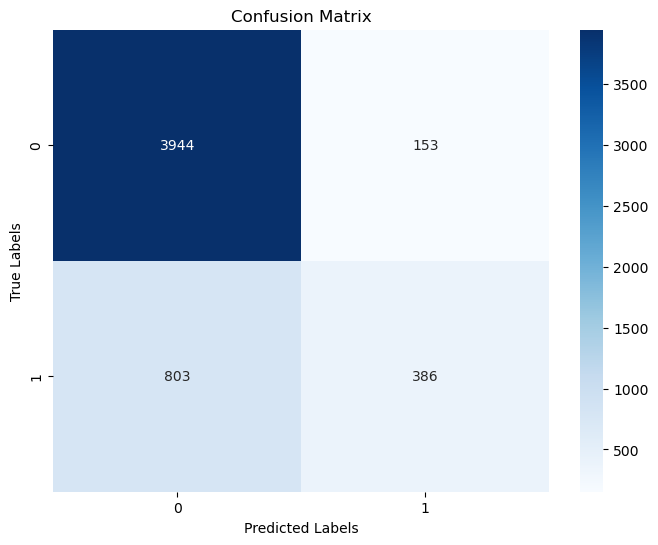

In [51]:
# Load the best saved model
best_ANN = load_model("best_ANN_model.h5")

# Make predictions on the test set
y_pred_probs = best_ANN.predict(X_test)
y_pred_labels = np.argmax(y_pred_probs, axis=1)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_labels)
print("Accuracy of predicted labels:", accuracy)

# Calculate the confusion matrix
cm = sklearn.metrics.confusion_matrix(y_test, y_pred_labels)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


True Positives (TP): 386
This represents the number of instances that were actually positive (default) and were correctly predicted as positive by the model.

True Negatives (TN): 3944
This represents the number of instances that were actually negative (non-default) and were correctly predicted as negative by the model.

False Positives (FP): 153
This represents the number of instances that were actually negative (non-default) but were incorrectly predicted as positive (default) by the model.

False Negatives (FN): 803
This represents the number of instances that were actually positive (default) but were incorrectly predicted as negative (non-default) by the model.

In [52]:
# Classification report
from sklearn.metrics import classification_report

# Convert the predicted probabilities to class labels
Y_pred_class = np.argmax(y_pred_probs, axis=1).reshape(-1)

report_ann = classification_report(y_test, Y_pred_class)
print("Classification Report:\n", report_ann)

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.96      0.89      4097
           1       0.72      0.32      0.45      1189

    accuracy                           0.82      5286
   macro avg       0.77      0.64      0.67      5286
weighted avg       0.81      0.82      0.79      5286



1) Precision: It represents the ability of the model to correctly predict positive instances (class 1) out of all instances it predicted as positive. A precision of 0.83 for class 0 and 0.72 for class 1 indicates that the model has higher precision for class 0 predictions compared to class 1 predictions.

2) Recall: It represents the ability of the model to correctly identify positive instances (class 1) out of all actual positive instances. A recall of 0.96 for class 0 and 0.32 for class 1 indicates that the model performs well in identifying class 0 instances but has a lower recall for class 1 instances.

3) F1-score: It is the harmonic mean of precision and recall, providing a balanced measure of the model's performance. The f1-score of 0.89 for class 0 and 0.45 for class 1 indicates that the model has better overall performance in predicting class 0 instances compared to class 1 instances.

4) Support: It represents the number of occurrences of each class in the testing dataset.

In [53]:
from keras.utils import to_categorical

# Convert the true labels to one-hot encoded format
y_test_encoded = to_categorical(y_test)

# Print the training and testing accuracy
train_accuracy3 = best_ANN.evaluate(X_train, to_categorical(y_train))
test_accuracy3 = best_ANN.evaluate(X_test, y_test_encoded)
print('Training Accuracy:', train_accuracy3)
print('Testing Accuracy:', test_accuracy3)


166/166 [==============================] - 0s 658us/step - loss: 0.4312 - accuracy: 0.8191
Training Accuracy: [0.4408125579357147, 0.8144066333770752]
Testing Accuracy: [0.4312366843223572, 0.8191449046134949]


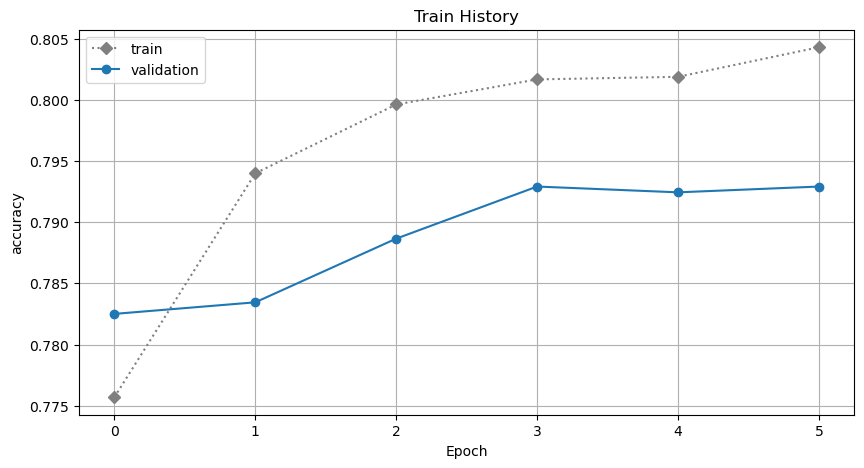

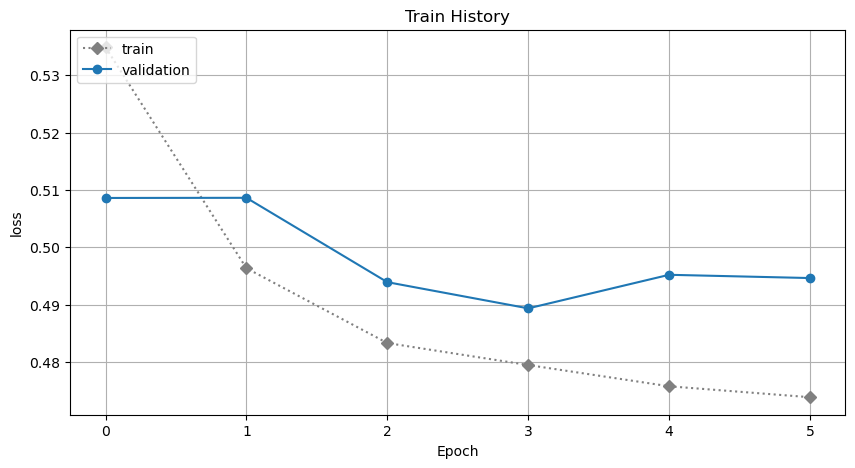

In [54]:
# Load the best training history
with open("best_ANN_train_history.pickle", "rb") as file:
    best_AAN_train_history = pickle.load(file)


def show_train_history(best_AAN_train_history,train,validation):
    plt.figure(figsize=(10, 5))
    plt.plot(train_history.history[train],'mp:' , color='0.5' , marker = 'D')
    plt.plot(train_history.history[validation],marker= 'o')
    #plt.plot(train_history.history[train],'mp:' , color='blue')
    #plt.plot(train_history.history[validation])

    plt.title('Train History')
    plt.ylabel(train)
    plt.xlabel('Epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.grid(True)
    plt.show()

# Call the function to show the train history graph    
show_train_history(best_AAN_train_history, 'accuracy', 'val_accuracy')
show_train_history(best_AAN_train_history, 'loss', 'val_loss')

In [56]:
from sklearn.metrics import auc

y_pred_labels = np.argmax(y_pred)

n_classes = y_test_encoded.shape[1]  # Number of classes
fpr = dict()
tpr = dict()
thresholds = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], thresholds[i] = roc_curve(y_test_encoded[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


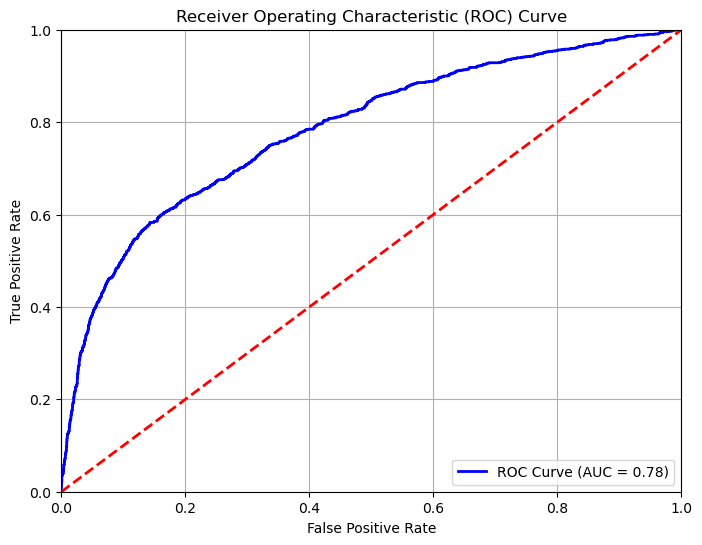

In [57]:
# Calculate the False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs[:, 1])

# Calculate the Area Under the ROC Curve (AUC)
auc = roc_auc_score(y_test, y_pred_probs[:, 1])

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], color='r', lw=2, linestyle='--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


The ROC curve with an AUC of 0.78, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.

In [58]:
# Test on unseen new data
new_data = pd.DataFrame({'LIMIT_BAL': [20000], 'SEX': [2], 'EDUCATION': [2], 'MARRIAGE': [1], 'AGE': [24], 'PAY_0': [2], 'PAY_2': [2], 'PAY_3': [-1], 'PAY_4': [-1], 'PAY_5': [-2], 'PAY_6': [-2],'BILL_AMT1':[3913],'BILL_AMT2':[3102],'BILL_AMT3':[689],'BILL_AMT4':[0],'BILL_AMT5':[0],'BILL_AMT6':[0],'PAY_AMT1':[0],'PAY_AMT2':[689],'PAY_AMT3':[0],'PAY_AMT4':[0],'PAY_AMT5':[0],'PAY_AMT6':[0]})

# Make predictions on the new data
min_max_scaler = MinMaxScaler()
new_data_scaled = min_max_scaler.fit_transform(new_data)

probabilities = best_ANN.predict(new_data_scaled)
predictions = probabilities[:, 1]

overall_prob_default = probabilities[:, 1].max()

# Print the overall probability of default
print('Probability of Default:', overall_prob_default)

# Print the predictions
for i, pred in enumerate(predictions):
    print(f"Customer {i+1}: {'Defaulter' if pred > 0.5 else 'Not Defaulter'}")

1/1 [==============================] - 0s 14ms/step
Probability of Default: 0.08851924
Customer 1: Not Defaulter


The prediction for the new data of probability is 0.0885, which means that the model predicts that the new customer will not default on their credit card payments.

## Conclusion of ANN Classifier

1) Define the hyperparameters to tune: 

   num_layers: The number of hidden layers in the neural network.

   dropout_rates: The dropout rates for regularization.

   learning_rates: The learning rates for the optimizer.

   batch_sizes: The batch sizes for training.

2) Define the activation functions to tune:

   activation_functions: The activation functions for the hidden layers.

3) Initialize the best accuracy and best parameters to track the highest validation accuracy achieved and the corresponding best parameters.

4) Loop through all combinations of hyperparameters and activation functions:

5) Create a Sequential model and add Dense layers based on the number of hidden layers.

6) Compile the model with the specified loss function, optimizer, and metrics.

7) Train the model using the training data, with early stopping based on the validation loss.

8) Calculate the accuracy on the validation set.

9) Update the best accuracy and best parameters if the current accuracy is higher than the previous best.

10) Print the best parameters.

11) Save the best model as "best_ANN_model.h5".

12) Save the best ANN training history using pickle.

Once the grid search is complete, we obtain the best parameters (best_params) and the best score (best_score). We then save the best ANN model and make predictions on the test set to evaluate the model's performance.

* The best parameters found for ANN Classifier, such as the optimal values for the hyperparameters 'n_layers': 4, 'dropout_rate': 0.2, 'lr': 0.001, 'batch_size': 320, 'activation_function': 'tanh', 'optimizer': <keras.optimizers.adam.Adam object at 0x0000024EBC2193D0>.
* The best score achieved during the parameter search process, which represents the model's performance on the cross-validated training set is 0.8075.
* Computation time:  5.610678672790527 seconds
* The accuracy score obtained by the model on the test set, which indicates how well the model generalized to unseen data is 0.8191.
* Plot the confusion matrix where (True Positives (TP): 386, True Negatives (TN): 3944, False Positives (FP):153, False Negatives (FN): 803)
* The classification report, which provides detailed metrics such as precision, recall, and F1-score for each class, allowing for a more comprehensive evaluation of the model's performance.
* Printed Training and Testing Accuracy (Training Accuracy: 0.8144, Testing Accuracy: 0.8191)
* Plotted Training History Graph
* The ROC curve with an AUC of 0.78, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.
* The prediction for the new data of probability is 0.0885, which means that the model predicts that the new customer will not default on their credit card payments.

## Random Forest Classifier

In [59]:
# Random Forest - Parameter tuning
param_grid = {
    'n_estimators': [25, 50, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'max_features': ['sqrt', 'log2', 10, None],
    'bootstrap': [True, False],
    'class_weight': [None, 'balanced']
}

In [60]:
# Define the SVM classifier
rf = RandomForestClassifier(random_state=42, n_jobs= -1)

# Perform grid search with cross-validation to find the best parameters
grid_search = GridSearchCV(rf, param_grid, cv=5, n_jobs= -1)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'class_weight': [None, 'balanced'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 5, 10, 15],
                         'max_features': ['sqrt', 'log2', 10, None],
                         'min_samples_leaf': [1, 2, 5],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [25, 50, 100]})

In [61]:
# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the result
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'bootstrap': False, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 5, 'max_features': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50}
Best Score: 0.8177173402641982


--- 2.3917911052703857 seconds ---


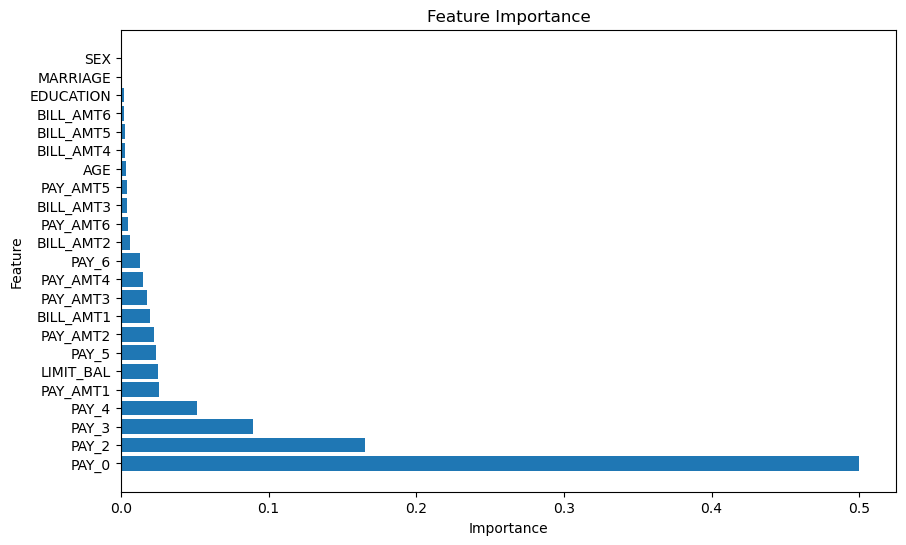

      Feature  Importance
5       PAY_0    0.499950
6       PAY_2    0.165175
7       PAY_3    0.089493
8       PAY_4    0.051781
17   PAY_AMT1    0.025437
0   LIMIT_BAL    0.025201
9       PAY_5    0.023610
18   PAY_AMT2    0.022231
11  BILL_AMT1    0.019577
19   PAY_AMT3    0.017387
20   PAY_AMT4    0.014881
10      PAY_6    0.012900
12  BILL_AMT2    0.005878
22   PAY_AMT6    0.004426
13  BILL_AMT3    0.004263
21   PAY_AMT5    0.003994
4         AGE    0.003479
14  BILL_AMT4    0.002804
15  BILL_AMT5    0.002411
16  BILL_AMT6    0.002302
2   EDUCATION    0.001926
3    MARRIAGE    0.000628
1         SEX    0.000266


In [62]:
# Start the timer
start_time = time.time()

# Train the Random Forest model with best parameters
rf_best = RandomForestClassifier(**best_params, random_state=42)
rf_best.fit(X_train, y_train)

print("--- %s seconds ---" % (time.time() - start_time))

importances = rf_best.feature_importances_

feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importances = feature_importances.sort_values('Importance', ascending=False)

# Plotting the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

# Printing the feature importances
print(feature_importances)

Accuracy of predicted labels: 0.8206583427922814


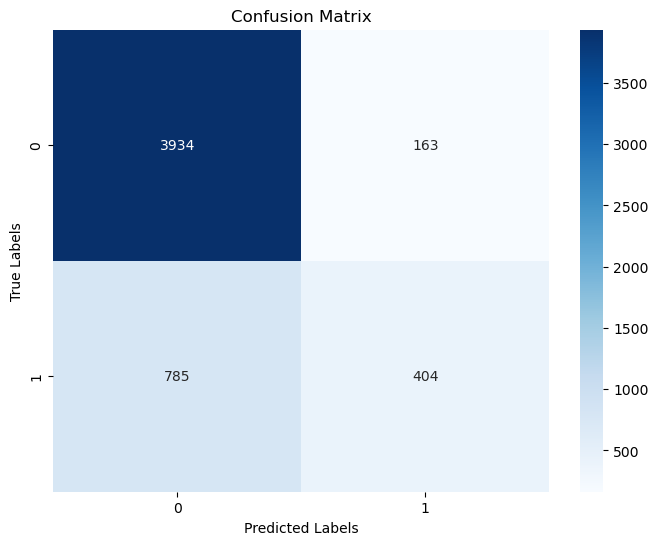

In [63]:
# Make predictions on the test set
y_pred = rf_best.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of predicted labels:", accuracy)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix using heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

True Positives (TP): 404
This represents the number of instances that were actually positive (default) and were correctly predicted as positive by the model.

True Negatives (TN): 3934
This represents the number of instances that were actually negative (non-default) and were correctly predicted as negative by the model.

False Positives (FP): 163
This represents the number of instances that were actually negative (non-default) but were incorrectly predicted as positive (default) by the model.

False Negatives (FN): 785
This represents the number of instances that were actually positive (default) but were incorrectly predicted as negative (non-default) by the model.

In [64]:
# Classification report
from sklearn.metrics import classification_report

rep = classification_report(y_test, y_pred)
print("Classification Report:\n", rep)

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.96      0.89      4097
           1       0.71      0.34      0.46      1189

    accuracy                           0.82      5286
   macro avg       0.77      0.65      0.68      5286
weighted avg       0.81      0.82      0.80      5286



1) Precision: It represents the ability of the model to correctly predict positive instances (class 1) out of all instances it predicted as positive. A precision of 0.83 for class 0 and 0.71 for class 1 indicates that the model has higher precision for class 0 predictions compared to class 1 predictions.

2) Recall: It represents the ability of the model to correctly identify positive instances (class 1) out of all actual positive instances. A recall of 0.96 for class 0 and 0.34 for class 1 indicates that the model performs well in identifying class 0 instances but has a lower recall for class 1 instances.

3) F1-score: It is the harmonic mean of precision and recall, providing a balanced measure of the model's performance. The f1-score of 0.89 for class 0 and 0.46 for class 1 indicates that the model has better overall performance in predicting class 0 instances compared to class 1 instances.

4) Support: It represents the number of occurrences of each class in the testing dataset.

In [65]:
# Training and testing accuracy
train_accuracy4 = rf_best.score(X_train, y_train)
test_accuracy4 = accuracy_score(y_test, y_pred)
print("Training Accuracy:", train_accuracy4)
print("Testing Accuracy:", test_accuracy4)

Training Accuracy: 0.8206971574516388
Testing Accuracy: 0.8206583427922814


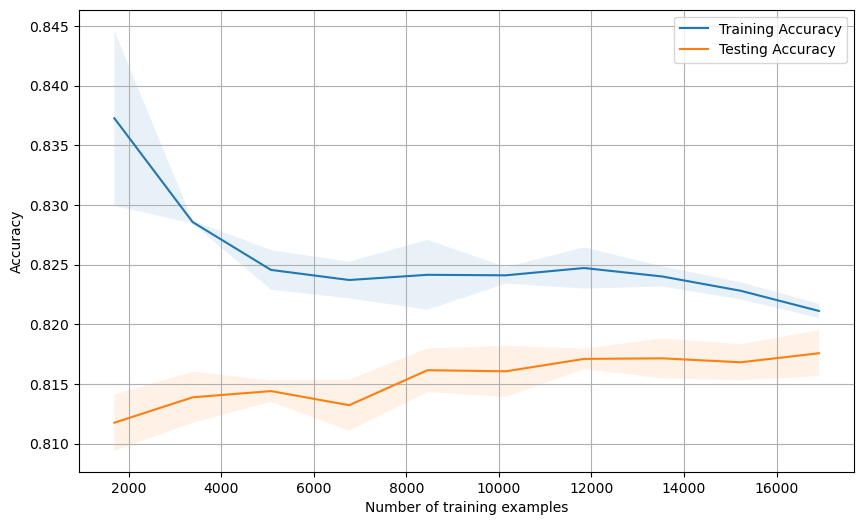

In [66]:
# Define the sizes of the training dataset to use
train_sizes = np.linspace(0.1, 1.0, 10)

# Calculate the learning curve for the logistic regression classifier
train_sizes, train_scores, test_scores = learning_curve(rf_best, X_train, y_train, train_sizes=train_sizes, cv=5)

# Calculate the mean and standard deviation of the training and testing accuracies
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
plt.plot(train_sizes, test_mean, label='Testing Accuracy')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1)
plt.xlabel('Number of training examples')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


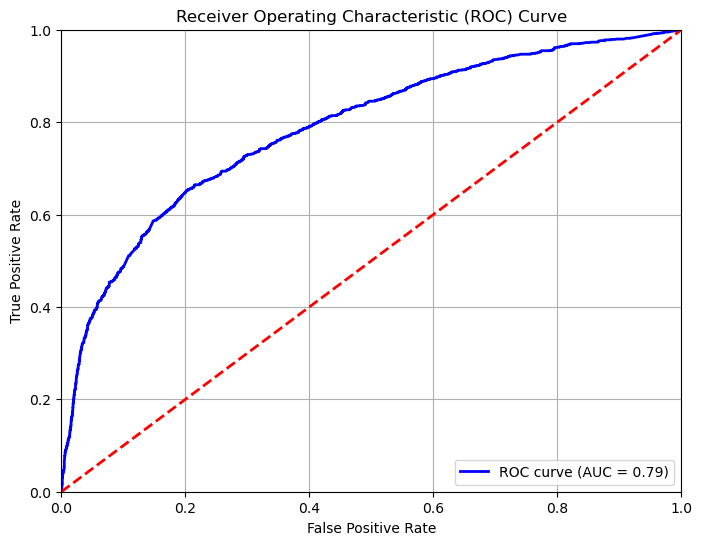

In [67]:
# ROC curve
y_prob = rf_best.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = roc_auc_score(y_test, y_prob)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='r', lw=2, linestyle='--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

The ROC curve with an AUC of 0.79, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.

In [68]:
# Test on unseen new data
new_data = pd.DataFrame({'LIMIT_BAL': [20000], 'SEX': [2], 'EDUCATION': [2], 'MARRIAGE': [1], 'AGE': [24], 'PAY_0': [2], 'PAY_2': [2], 'PAY_3': [-1], 'PAY_4': [-1], 'PAY_5': [-2], 'PAY_6': [-2],'BILL_AMT1':[3913],'BILL_AMT2':[3102],'BILL_AMT3':[689],'BILL_AMT4':[0],'BILL_AMT5':[0],'BILL_AMT6':[0],'PAY_AMT1':[0],'PAY_AMT2':[689],'PAY_AMT3':[0],'PAY_AMT4':[0],'PAY_AMT5':[0],'PAY_AMT6':[0]})

# Make predictions on the new data
min_max_scaler = MinMaxScaler()
new_data_scaled = min_max_scaler.fit_transform(new_data)

probabilities = rf_best.predict_proba(new_data_scaled)
predictions = probabilities[:, 1]

overall_prob_default = probabilities[:, 1].max()

# Print the overall probability of default
print('Probability of Default:', overall_prob_default)

# Print the predictions
for i, pred in enumerate(predictions):
    print(f"Customer {i+1}: {'Defaulter' if pred > 0.5 else 'Not Defaulter'}")

Probability of Default: 0.23589482875490625
Customer 1: Not Defaulter


The prediction for the new data of probability is 0.2358, which means that the model predicts that the new customer will not default on their credit card payments.

## Conclusion of Random Forest Classifier

We define a parameter grid param_grid with different values for the hyperparameters'n_estimators', 'criterion', 'max_depth', 'min_samples_split', 'min_samples_leaf', 'max_features', 'bootstrap', 'class_weight'.

We create a Random Forest Classifier model and then we define the hyperparameters for Random Forest Classifier and perform hyperparameter tuning using GridSearchCV() from sklearn.model_selection with cross-validation. The GridSearchCV will iterate over all possible combinations of the hyperparameters and evaluate the model's performance using cross-validation.

Once the grid search is complete, we obtain the best parameters (best_params) and the best score (best_score). We then train a new Random Forest Classifier model with the best parameters and make predictions on the test set to evaluate the model's performance.

* The best parameters found for Random Forest Classifier, such as the optimal values for the hyperparameters 'bootstrap': False, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 5, 'max_features': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50.
* The best score achieved during the parameter search process, which represents the model's performance on the cross-validated training set is 0.8177.
* Computation time: 2.3917911052703857 seconds
* The accuracy score obtained by the model on the test set, which indicates how well the model generalized to unseen data is 0.8206.
* Plot the confusion matrix where (True Positives (TP): 404, True Negatives (TN): 3934, False Positives (FP): 163, False Negatives (FN): 785)
* The classification report, which provides detailed metrics such as precision, recall, and F1-score for each class, allowing for a more comprehensive evaluation of the model's performance.
* Printed Training and Testing Accuracy (Training Accuracy: 0.8206, Testing Accuracy: 0.8206)
* Plotted Training v/s Testing Accuracy Graph
* The ROC curve with an AUC of 0.79, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.
* The prediction for the new data of probability is 0.2358, which means that the model predicts that the new customer will not default on their credit card payments.

## XGBoost Classifier

In [69]:
# Define a parameter grid of random search cv
reduced_param_grid ={
    'n_estimators': [25, 50, 100],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5],
    'scale_pos_weight': [1, 3, 5],
    'base_score': [0.5],
    'booster': ['gbtree', 'gblinear', 'dart'],
    'importance_type': ['gain', 'weight', 'cover', 'total_gain', 'total_cover'],
    'tree_method': ['auto', 'exact', 'approx', 'hist', 'gpu_hist'],
    'validate_parameters': [True, False],
    'early_stopping_rounds': [None, 5, 10],
    'eval_metric': ['rmse', 'mae', 'logloss', 'error', 'auc'],
    'objective': ['reg:squarederror', 'reg:logistic', 'binary:logistic', 'multi:softmax'],
    'num_class': [None, 2, 3, 4],
    'random_state': [42]
}

In [70]:
# Define the XGBoost classifier
xgb_model = xgb.XGBClassifier()

# Perform randomized search with cross-validation to find the best parameters
random_search = RandomizedSearchCV(estimator=xgb_model, param_distributions=reduced_param_grid, cv=5, n_jobs=-1, n_iter=100)
random_search.fit(X_train, y_train)


[01:10:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "scale_pos_weight" } are not used.



RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                        'n_estimators': [25, 50, 100],
                        

In [71]:
# Access the best score and best parameters
best_score = random_search.best_score_
best_params = random_search.best_params_

# Print the best score and best parameters
print("Best Score:", best_score)
print("Best Parameters:", best_params)


Best Score: 0.8169604029303456
Best Parameters: {'validate_parameters': False, 'tree_method': 'hist', 'subsample': 0.8, 'scale_pos_weight': 1, 'reg_lambda': 0.1, 'reg_alpha': 0.1, 'random_state': 42, 'objective': 'multi:softmax', 'num_class': 4, 'n_estimators': 50, 'min_child_weight': 5, 'max_depth': 5, 'learning_rate': 0.1, 'importance_type': 'total_gain', 'gamma': 0.2, 'eval_metric': 'rmse', 'early_stopping_rounds': None, 'colsample_bytree': 1.0, 'booster': 'dart', 'base_score': 0.5}


In [72]:
# Start the timer
start_time = time.time()

# Train the model with the best parameters
best_xgb = xgb.XGBClassifier(**best_params)
best_xgb.fit(X_train, y_train)

print("--- %s seconds ---" % (time.time() - start_time))

[01:11:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "scale_pos_weight" } are not used.

--- 13.415041208267212 seconds ---


Accuracy of predicted labels: 0.8227393113885736


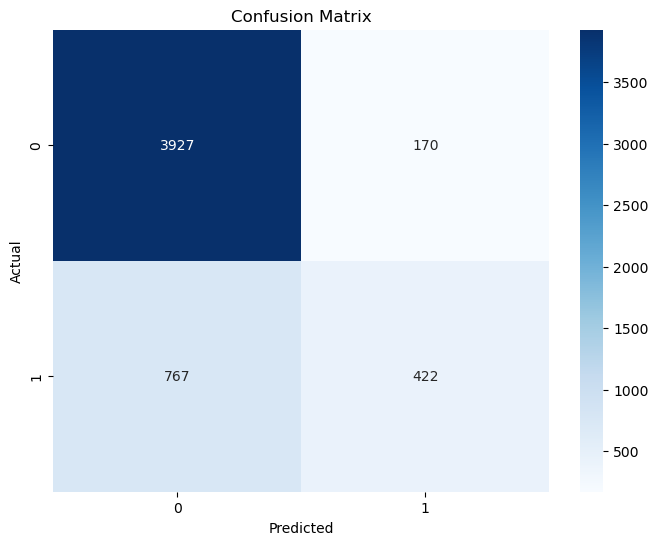

In [73]:
# Make predictions on the test set
y_pred = best_xgb.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of predicted labels:", accuracy)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix using heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

True Positives (TP): 422
This represents the number of instances that were actually positive (default) and were correctly predicted as positive by the model.

True Negatives (TN): 3927
This represents the number of instances that were actually negative (non-default) and were correctly predicted as negative by the model.

False Positives (FP): 170
This represents the number of instances that were actually negative (non-default) but were incorrectly predicted as positive (default) by the model.

False Negatives (FN): 767
This represents the number of instances that were actually positive (default) but were incorrectly predicted as negative (non-default) by the model.

In [74]:
# Classification report
from sklearn.metrics import classification_report

rep_xgb = classification_report(y_test, y_pred)
print("Classification Report:\n", rep_xgb)

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.96      0.89      4097
           1       0.71      0.35      0.47      1189

    accuracy                           0.82      5286
   macro avg       0.77      0.66      0.68      5286
weighted avg       0.81      0.82      0.80      5286



1) Precision: It represents the ability of the model to correctly predict positive instances (class 1) out of all instances it predicted as positive. A precision of 0.84 for class 0 and 0.71 for class 1 indicates that the model has higher precision for class 0 predictions compared to class 1 predictions.

2) Recall: It represents the ability of the model to correctly identify positive instances (class 1) out of all actual positive instances. A recall of 0.96 for class 0 and 0.35 for class 1 indicates that the model performs well in identifying class 0 instances but has a lower recall for class 1 instances.

3) F1-score: It is the harmonic mean of precision and recall, providing a balanced measure of the model's performance. The f1-score of 0.89 for class 0 and 0.47 for class 1 indicates that the model has better overall performance in predicting class 0 instances compared to class 1 instances.

4) Support: It represents the number of occurrences of each class in the testing dataset.

In [75]:
# Training and testing accuracy
train_accuracy5 = best_xgb.score(X_train, y_train)
test_accuracy5 = accuracy_score(y_test, y_pred)
print("Training Accuracy:", train_accuracy5)
print("Testing Accuracy:", test_accuracy5)

Training Accuracy: 0.8273187343328762
Testing Accuracy: 0.8227393113885736


[01:11:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "scale_pos_weight" } are not used.

[01:11:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "scale_pos_weight" } are not used.

[01:11:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "scale_pos_weight" } are not used.

[01:11:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "scale_pos_weight" } are not used.

[01:11:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "scale

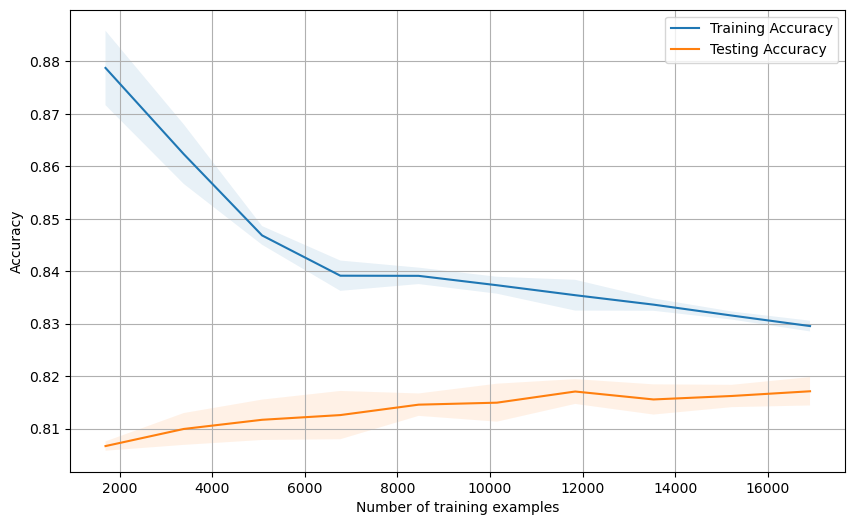

In [76]:
# Define the sizes of the training dataset to use
train_sizes = np.linspace(0.1, 1.0, 10)

# Calculate the learning curve for the logistic regression classifier
train_sizes, train_scores, test_scores = learning_curve(best_xgb, X_train, y_train, train_sizes=train_sizes, cv=5)

# Calculate the mean and standard deviation of the training and testing accuracies
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
plt.plot(train_sizes, test_mean, label='Testing Accuracy')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1)
plt.xlabel('Number of training examples')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


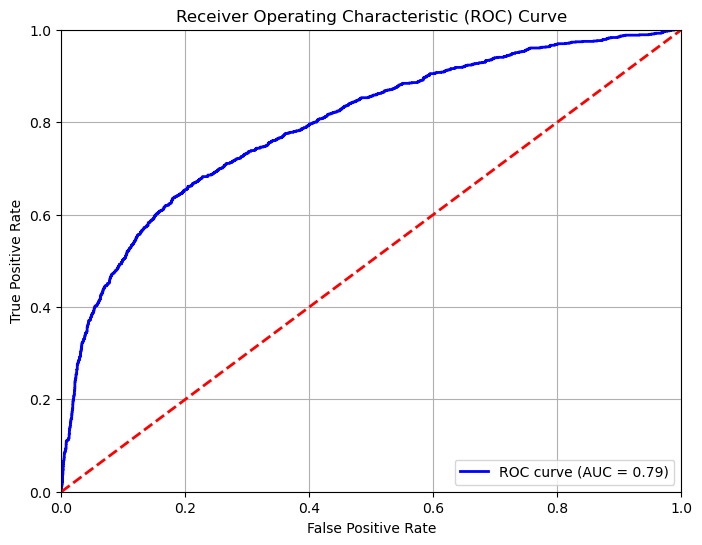

In [77]:
# ROC curve
y_prob = best_xgb.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = roc_auc_score(y_test, y_prob)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='r', lw=2, linestyle='--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

The ROC curve with an AUC of 0.79, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.

In [78]:
# Test on unseen new data
new_data = pd.DataFrame({'LIMIT_BAL': [20000], 'SEX': [2], 'EDUCATION': [2], 'MARRIAGE': [1], 'AGE': [24], 'PAY_0': [2], 'PAY_2': [2], 'PAY_3': [-1], 'PAY_4': [-1], 'PAY_5': [-2], 'PAY_6': [-2],'BILL_AMT1':[3913],'BILL_AMT2':[3102],'BILL_AMT3':[689],'BILL_AMT4':[0],'BILL_AMT5':[0],'BILL_AMT6':[0],'PAY_AMT1':[0],'PAY_AMT2':[689],'PAY_AMT3':[0],'PAY_AMT4':[0],'PAY_AMT5':[0],'PAY_AMT6':[0]})

# Make predictions on the new data
min_max_scaler = MinMaxScaler()
new_data_scaled = min_max_scaler.fit_transform(new_data)

probabilities = best_xgb.predict_proba(new_data_scaled)
predictions = probabilities[:, 1]

overall_prob_default = probabilities[:, 1].max()

# Print the overall probability of default
print('Probability of Default:', overall_prob_default)

# Print the predictions
for i, pred in enumerate(predictions):
    print(f"Customer {i+1}: {'Defaulter' if pred > 0.5 else 'Not Defaulter'}")

Probability of Default: 0.27898094
Customer 1: Not Defaulter


The prediction for the new data of probability is 0.2789, which means that the model predicts that the new customer will not default on their credit card payments.

## Conclusion of XGBoost Classifier

We define a parameter grid param_grid with different values for the hyperparameters 'n_estimators', 'learning_rate', 'max_depth', 'min_child_weight', 'subsample', 'colsample_bytree', 'gamma', 'reg_alpha', 'reg_lambda', 'scale_pos_weight', 'base_score', 'booster', 'importance_type', 'tree_method', 'validate_parameters', 'early_stopping_rounds', 'eval_metric', 'objective', 'num_class', 'random_state'.

We create a XGBoost Classifier model and then we define the hyperparameters for XGBoost Classifier and perform hyperparameter tuning using RandomSearchCV() from sklearn.model_selection with cross-validation. The RandomSearchCV will randomly iterate over all possible combinations of the hyperparameters and evaluate the model's performance using cross-validation.

Once the grid search is complete, we obtain the best parameters (best_params) and the best score (best_score). We then train a new XGBoost Classifier model with the best parameters and make predictions on the test set to evaluate the model's performance.

* The best parameters found for XGBoost Classifier, such as the optimal values for the hyperparameters 'validate_parameters': False, 'tree_method': 'hist', 'subsample': 0.8, 'scale_pos_weight': 1, 'reg_lambda': 0.1, 'reg_alpha': 0.1, 'random_state': 42, 'objective': 'multi:softmax', 'num_class': 4, 'n_estimators': 50, 'min_child_weight': 5, 'max_depth': 5, 'learning_rate': 0.1, 'importance_type': 'total_gain', 'gamma': 0.2, 'eval_metric': 'rmse', 'early_stopping_rounds': None, 'colsample_bytree': 1.0, 'booster': 'dart', 'base_score': 0.5.
* The best score achieved during the parameter search process, which represents the model's performance on the cross-validated training set is 0.8169.
* Computation time: 13.415041208267212 seconds
* The accuracy score obtained by the model on the test set, which indicates how well the model generalized to unseen data is 0.8227.
* Plot the confusion matrix where (True Positives (TP): 422, True Negatives (TN): 3927, False Positives (FP): 170, False Negatives (FN): 767)
* The classification report, which provides detailed metrics such as precision, recall, and F1-score for each class, allowing for a more comprehensive evaluation of the model's performance.
* Printed Training and Testing Accuracy (Training Accuracy: 0.8273, Testing Accuracy: 0.8227)
* Plotted Training v/s Testing Accuracy Graph
* The ROC curve with an AUC of 0.79, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.
* The prediction for the new data of probability is 0.2789, which means that the model predicts that the new customer will not default on their credit card payments.

## Convolution Neural Network (CNN) Classifier

In [ ]:
# Convert labels to one-hot encoded format
y_train_encoded = to_categorical(y_train)
y_test_encoded = to_categorical(y_test)

# Define the parameters to iterate over
param_grid = {
    'num_filters': [32, 64, 128],
    'filter_size': [3, 5],
    'pool_size': [2, 3],
    'dense_units': [64, 128],
    'dropout_rate': [0.4, 0.5],
    'learning_rate': [0.001, 0.0001],
    'activation_function': ['relu', 'sigmoid', 'tanh'],
    'optimizer': ['Adam', 'SGD', 'RMSprop'],
    'batch_size': [280, 300, 320]
}

# Initialize the best accuracy, best parameters, best model, and best training history
best_accuracy = -1
best_params = {}
best_model = None
best_train_history = None

# Initialize the best parameter computation time
best_param_computation_time = 0

# Loop through all combinations of parameters
for num_filters in param_grid['num_filters']:
    for filter_size in param_grid['filter_size']:
        for pool_size in param_grid['pool_size']:
            for dense_units in param_grid['dense_units']:
                for dropout_rate in param_grid['dropout_rate']:
                    for learning_rate in param_grid['learning_rate']:
                        for activation_function in param_grid['activation_function']:
                            for optimizer in param_grid['optimizer']:
                                for batch_size in param_grid['batch_size']:
                                    # Define the CNN model
                                    model = Sequential()
                                    model.add(Conv1D(filters=num_filters, kernel_size=filter_size, activation=activation_function, input_shape=(X_train.shape[1], 1)))
                                    model.add(MaxPooling1D(pool_size=pool_size))
                                    model.add(Flatten())
                                    model.add(Dense(dense_units, activation=activation_function))
                                    model.add(Dropout(dropout_rate))
                                    model.add(Dense(2, activation='softmax'))

                                    # Compile the model
                                    #optimizer = eval(optimizer)(learning_rate=learning_rate)
                                    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

                                    # Train the model
                                    early_stopping = EarlyStopping(monitor='val_loss', patience=2, verbose=1, mode='min')

                                    print('Neural Network Model Summary: ')
                                    model.summary()

                                    start_time = time.time()
                                    
                                    train_history = model.fit(X_train.reshape(X_train.shape[0], X_train.shape[1], 1), y_train_encoded, validation_split=0.1, epochs=200, batch_size=batch_size, callbacks=[early_stopping])

                                    param_computation_time = time.time() - start_time

                                        
                                    # Evaluate the model
                                    loss, accuracy = model.evaluate(X_test.reshape(X_test.shape[0], X_test.shape[1], 1), y_test_encoded)

                                    # Printing the parameters after each iteration
                                    print(f"learning_rate={learning_rate}, dropout_rate={dropout_rate}, batch_size={batch_size}, activation_function={activation_function}, optimizer={optimizer}, num_filters={num_filters}, filter_size={filter_size}, pool_size={pool_size}, dense_units={dense_units}")

                                    # Update the best accuracy and best parameters
                                    if accuracy > best_accuracy:
                                        best_accuracy = accuracy
                                        best_params = {
                                            'num_filters': num_filters,
                                            'filter_size': filter_size,
                                            'pool_size': pool_size,
                                            'dense_units': dense_units,
                                            'dropout_rate': dropout_rate,
                                            'learning_rate': learning_rate,
                                            'activation_function': activation_function,
                                            'optimizer': optimizer,
                                            'batch_size': batch_size
                                        }
                                        best_model = model
                                        best_train_history = train_history.history
                                        best_param_computation_time = param_computation_time


# Print the best parameters and best score
print("Best Parameters:", best_params)
print("Best Score:", best_accuracy)
print("--- %s seconds ---" % (best_param_computation_time))

# Save the best model
best_model.save("best_CNN_model.h5")

# Save the best training history
with open("best_CNN_train_history.pickle", "wb") as file:
    pickle.dump(best_train_history, file)


Neural Network Model Summary: 
Model: "sequential_9502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8638 (Conv1D)        (None, 21, 32)            128       
                                                                 
 max_pooling1d_8638 (MaxPool  (None, 10, 32)           0         
 ing1D)                                                          
                                                                 
 flatten_8638 (Flatten)      (None, 320)               0         
                                                                 
 dense_20300 (Dense)         (None, 64)                20544     
                                                                 
 dropout_10798 (Dropout)     (None, 64)                0         
                                                                 
 dense_20301 (Dense)         (None, 2)                 130       
                    

166/166 [==============================] - 2s 15ms/step
Accuracy of predicted labels: 0.8123344684071131


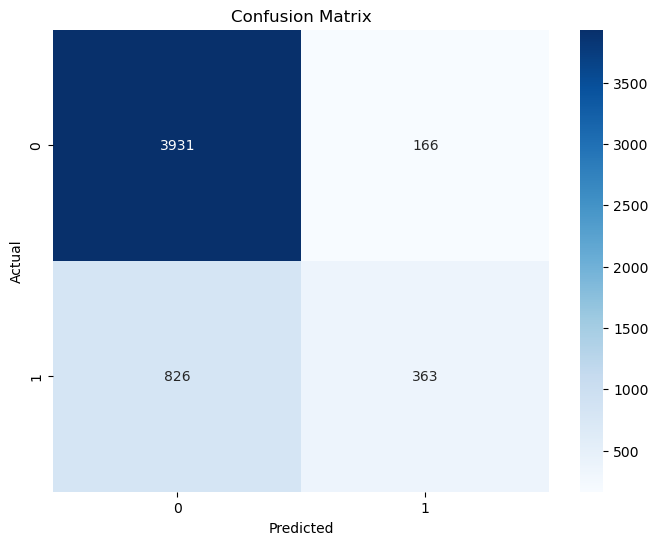

In [87]:
# Load the best saved model
best_CNN = load_model("best_CNN_model.h5")

# Make predictions on the test set
y_pred_accuracy = best_CNN.predict(X_test)
y_pred_labels = np.argmax(y_pred_accuracy, axis=1)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_labels)
print("Accuracy of predicted labels:", accuracy)

# Plot confusion matrix
cm = sklearn.metrics.confusion_matrix(y_test, y_pred_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

True Positives (TP): 363
This represents the number of instances that were actually positive (default) and were correctly predicted as positive by the model.

True Negatives (TN): 3931
This represents the number of instances that were actually negative (non-default) and were correctly predicted as negative by the model.

False Positives (FP): 166
This represents the number of instances that were actually negative (non-default) but were incorrectly predicted as positive (default) by the model.

False Negatives (FN): 826
This represents the number of instances that were actually positive (default) but were incorrectly predicted as negative (non-default) by the model.

In [90]:
# Classification report
from sklearn.metrics import classification_report

# Convert the predicted probabilities to class labels
Y_pred_class = np.argmax(y_pred_accuracy, axis=1).reshape(-1)

print("Classification Report:\n",classification_report(y_test, Y_pred_class))

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.96      0.89      4097
           1       0.69      0.31      0.42      1189

    accuracy                           0.81      5286
   macro avg       0.76      0.63      0.66      5286
weighted avg       0.79      0.81      0.78      5286



1) Precision: It represents the ability of the model to correctly predict positive instances (class 1) out of all instances it predicted as positive. A precision of 0.83 for class 0 and 0.69 for class 1 indicates that the model has higher precision for class 0 predictions compared to class 1 predictions.

2) Recall: It represents the ability of the model to correctly identify positive instances (class 1) out of all actual positive instances. A recall of 0.96 for class 0 and 0.31 for class 1 indicates that the model performs well in identifying class 0 instances but has a lower recall for class 1 instances.

3) F1-score: It is the harmonic mean of precision and recall, providing a balanced measure of the model's performance. The f1-score of 0.89 for class 0 and 0.42 for class 1 indicates that the model has better overall performance in predicting class 0 instances compared to class 1 instances.

4) Support: It represents the number of occurrences of each class in the testing dataset.

In [91]:
# Training and testing accuracy
train_accuracy6 = train_history.history['accuracy'][-1]
test_accuracy6 = best_score
print("Training Accuracy:", train_accuracy6)
print("Testing Accuracy:", test_accuracy6)

Training Accuracy: 0.8073365688323975
Testing Accuracy: 0.8169604029303456


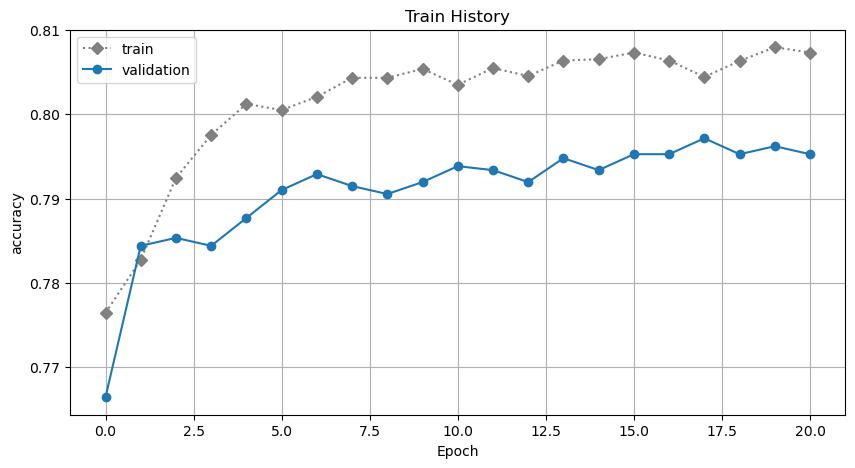

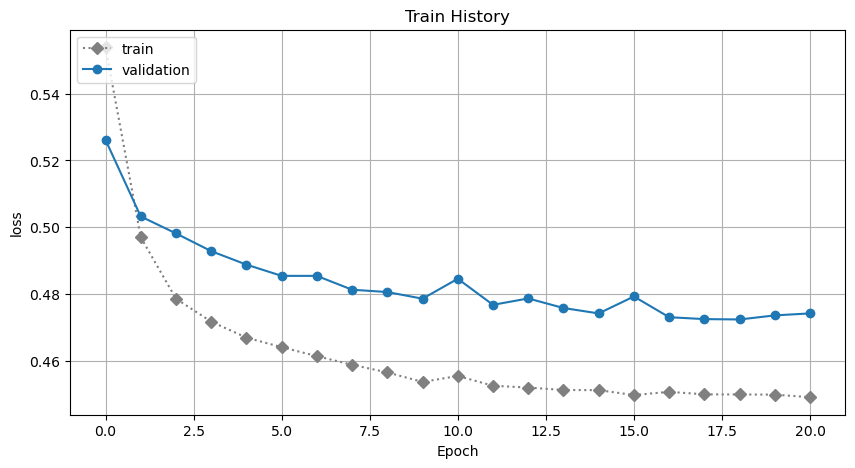

In [92]:
# Load the best training history
with open("best_CNN_train_history.pickle", "rb") as file:
    best_CNN_train_history = pickle.load(file)


def show_train_history(best_CNN_train_history,train,validation):
    plt.figure(figsize=(10, 5))
    plt.plot(train_history.history[train],'mp:' , color='0.5' , marker = 'D')
    plt.plot(train_history.history[validation],marker= 'o')
    #plt.plot(train_history.history[train],'mp:' , color='blue')
    #plt.plot(train_history.history[validation])

    plt.title('Train History')
    plt.ylabel(train)
    plt.xlabel('Epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.grid(True)
    plt.show()

# Call the function to show the train history graph    
show_train_history(best_CNN_train_history, 'accuracy', 'val_accuracy')
show_train_history(best_CNN_train_history, 'loss', 'val_loss')

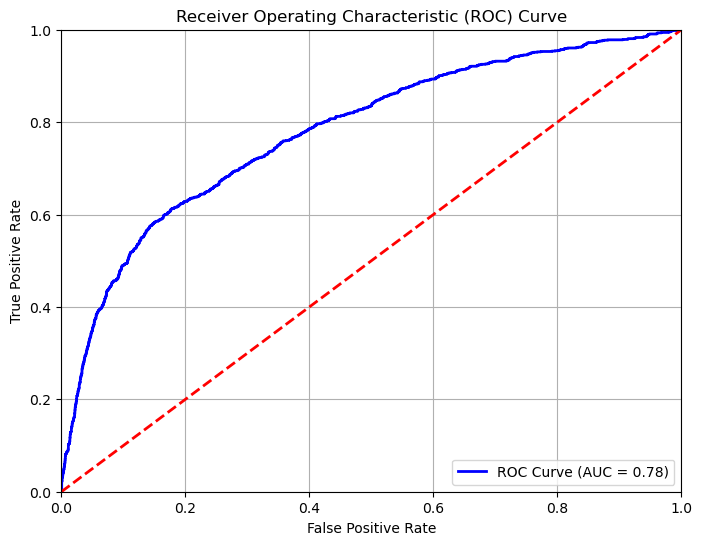

In [94]:
# Calculate the False Positive Rate (FPR) and True Positive Rate (TPR)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_accuracy[:, 1])

# Calculate the Area Under the ROC Curve (AUC)
auc = roc_auc_score(y_test, y_pred_accuracy[:, 1])

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], color='r', lw=2, linestyle='--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

The ROC curve with an AUC of 0.78, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.

In [96]:
# Test on unseen new data
new_data = pd.DataFrame({'LIMIT_BAL': [20000], 'SEX': [2], 'EDUCATION': [2], 'MARRIAGE': [1], 'AGE': [24], 'PAY_0': [2], 'PAY_2': [2], 'PAY_3': [-1], 'PAY_4': [-1], 'PAY_5': [-2], 'PAY_6': [-2],'BILL_AMT1':[3913],'BILL_AMT2':[3102],'BILL_AMT3':[689],'BILL_AMT4':[0],'BILL_AMT5':[0],'BILL_AMT6':[0],'PAY_AMT1':[0],'PAY_AMT2':[689],'PAY_AMT3':[0],'PAY_AMT4':[0],'PAY_AMT5':[0],'PAY_AMT6':[0]})

# Make predictions on the new data
min_max_scaler = MinMaxScaler()
new_data_scaled = min_max_scaler.fit_transform(new_data)

probabilities = best_CNN.predict(new_data_scaled)
predictions = probabilities[:, 1]

overall_prob_default = probabilities[:, 1].max()

# Print the overall probability of default
print('Probability of Default:', overall_prob_default)

# Print the predictions
for i, pred in enumerate(predictions):
    print(f"Customer {i+1}: {'Defaulter' if pred > 0.5 else 'Not Defaulter'}")

1/1 [==============================] - 0s 23ms/step
Probability of Default: 0.11264794
Customer 1: Not Defaulter


The prediction for the new data of probability is 0.1126, which means that the model predicts that the new customer will not default on their credit card payments.

## Conclusion of CNN Classifier

We begins by converting the labels into a one-hot encoded format. Then defines a parameter grid containing various combinations of hyperparameters to explore during the grid search.

Initializes variables to keep track of the best accuracy, best parameters, best model, and best training history found during the search.

Next, we iterates through all combinations of the parameters in the grid. For each combination, a CNN model is defined with the specified architecture, including convolutional layers, pooling layers, dense layers, and dropout layers. The model is compiled with the chosen optimizer and learning rate, and the training is performed using the training data and validation split. Early stopping is employed to monitor the validation loss and prevent overfitting.

The model is then evaluated using the test data, and the loss and accuracy are recorded. After each iteration, the parameters and corresponding accuracy are printed.

Throughout the search, the code keeps track of the best accuracy achieved so far and updates the best parameters and best model accordingly.

After the grid search completes, then we prints the best parameters and the corresponding best accuracy achieved. It saves the best model to a file named "best_CNN_model.h5" and the best training history to a file named "best_CNN_train_history.pickle".

The code provides a systematic approach to finding the optimal hyperparameters for a CNN model. By performing a grid search over various combinations of hyperparameters, it helps identify the configuration that yields the best performance on the given task.


* The best parameters found for CNN Classifier, such as the optimal values for the hyperparameters 'num_filters': 32, 'filter_size': 3, 'pool_size': 2, 'dense_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.001, 'activation_function': 'relu', 'optimizer': 'Adam', 'batch_size': 320.
* The best score achieved during the parameter search process, which represents the model's performance on the cross-validated training set is 0.8123.
* Computation time: 182.43867897987366 seconds
* The accuracy score obtained by the model on the test set, which indicates how well the model generalized to unseen data is 0.8123.
* Plot the confusion matrix where (True Positives (TP): 363, True Negatives (TN): 3931, False Positives (FP): 166, False Negatives (FN): 826)
* The classification report, which provides detailed metrics such as precision, recall, and F1-score for each class, allowing for a more comprehensive evaluation of the model's performance.
* Printed Training and Testing Accuracy (Training Accuracy: 0.8073, Testing Accuracy: 0.8169)
* Plotted Training v/s Testing Accuracy Graph
* The ROC curve with an AUC of 0.78, the model's discriminative ability is moderate. It implies that the model has some ability to differentiate between default and non-default instances in the credit card dataset, but there is still room for improvement to enhance its predictive performance.
* The prediction for the new data of probability is 0.1126, which means that the model predicts that the new customer will not default on their credit card payments.

### All 6 Algorithms Models Training and Testing Accuracy Comparison

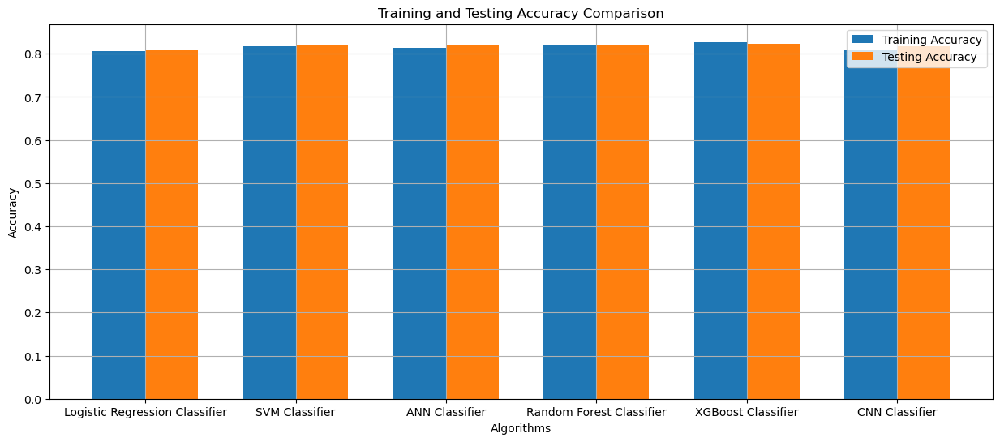

In [111]:
# List of models and their training/testing accuracy values
Algorithms = ['Logistic Regression Classifier', 'SVM Classifier', 'ANN Classifier','Random Forest Classifier', 'XGBoost Classifier', 'CNN Classifier']
train_acc = [0.8055, 0.8181, 0.8144, 0.8206, 0.8273, 0.8073]
test_acc = [0.8076, 0.8199, 0.8191, 0.8206, 0.8227, 0.8169]

# Set the width of each bar
bar_width = 0.35

# Set the x positions of the bars
x_train = np.arange(len(Algorithms))
x_test = x_train + bar_width

# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(15, 6))

# Plot the training accuracy bars
ax.bar(x_train, train_acc, width=bar_width, label='Training Accuracy')

# Plot the testing accuracy bars
ax.bar(x_test, test_acc, width=bar_width, label='Testing Accuracy')

# Set the x-axis tick labels
ax.set_xticks(x_train + bar_width/2)
ax.set_xticklabels(Algorithms)

# Customize the plot
plt.xlabel('Algorithms')
plt.ylabel('Accuracy')
plt.title('Training and Testing Accuracy Comparison')
plt.legend()
plt.grid(True)

#Display the plot
plt.show()

Plots the training and testing accuracy values for different machine learning models. The models included are Logistic Regression Classifier, SVM Classifier, ANN Classifier, Random Forest Classifier, XGBoost Classifier, and CNN Classifier.

By plotting the training and testing accuracy for each algorithm, the code provides a visual comparison of their performance. The x-axis represents the algorithms, and the y-axis represents the accuracy. The plot shows two bars: one for training accuracy and one for testing accuracy.

Based on the plot, we can observe that the XGBoost Classifier has the highest training and testing accuracy among the models. The Random Forest Classifier also performs well, with comparable accuracy values. The Logistic Regression Classifier, SVM Classifier, ANN Classifier, and CNN Classifier show similar performance with slightly lower accuracy values.

Overall, the XGBoost Classifier appears to be the most accurate model based on the training and testing accuracy data, followed closely by the Random Forest Classifier. However, it's important to note that the conclusion is based on the given accuracy values, and other factors such as data quality, model complexity, and specific problem requirements should also be considered when selecting the best algorithm for a given task.

### All 6 Algorithms Models Computation Time Comparison

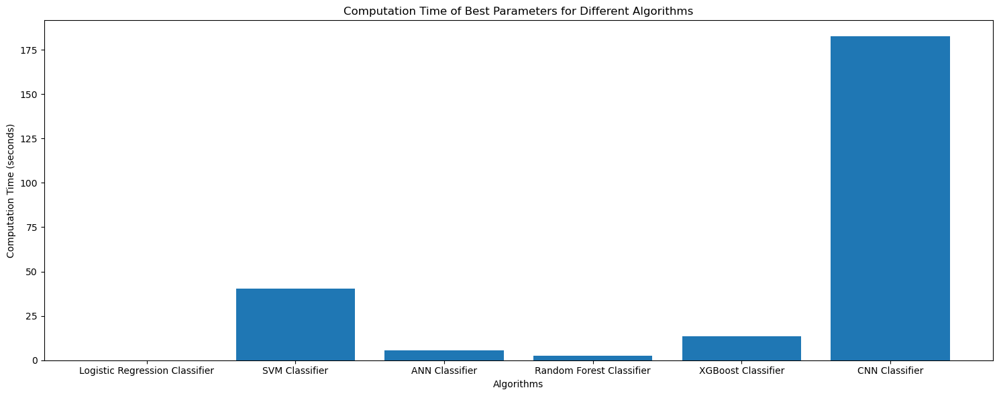

In [114]:
import matplotlib.pyplot as plt

# Computation times for each algorithm
computation_times = [ 0.07808208465576172 , 40.52541470527649, 5.610678672790527,  2.3917911052703857,  13.415041208267212,  182.43867897987366]

# Algorithms
algorithms = ['Logistic Regression Classifier', 'SVM Classifier', 'ANN Classifier', 'Random Forest Classifier', 'XGBoost Classifier', 'CNN Classifier']

# Plotting the graph
plt.figure(figsize=(15, 6))
plt.bar(algorithms, computation_times)
plt.xlabel('Algorithms')
plt.ylabel('Computation Time (seconds)')
plt.title('Computation Time of Best Parameters for Different Algorithms')
plt.xticks
plt.tight_layout()
plt.show()


1. Computation Times: The computation times vary significantly among the algorithms, ranging from less than a second to several minutes.

2. Fast Algorithms: The Logistic Regression Classifier and ANN Classifier have the shortest computation times, taking less than 1 second and approximately 5.6 seconds, respectively. These algorithms are computationally efficient and suitable for tasks that require quick results.

3. Moderate Algorithms: The Random Forest Classifier and XGBoost Classifier exhibit moderate computation times, taking around 2.4 seconds and 13.4 seconds, respectively. These algorithms strike a balance between accuracy and computation time, making them suitable for various applications.

4. Time-Intensive Algorithm: The CNN Classifier (Convolutional Neural Network) has the longest computation time, approximately 182.4 seconds. CNNs are known for their complexity, as they involve multiple layers and extensive computations. While CNNs may provide high accuracy, their longer computation times should be considered when deploying them in time-critical scenarios.

In conclusion, the bar plot highlights the significant differences in computation times among the evaluated algorithms. It allows us to assess the trade-off between accuracy and computation time, enabling us to choose the most appropriate algorithm based on the specific requirements and constraints of the task.

### Conclusion (Comparison of All 6 Algorithms)

Based on the above information from each of the Model, the performance of the algorithms can be evaluated as follows:

1. Logistic Regression:
   - Training Accuracy: 0.8055
   - Testing Accuracy: 0.8076
   - F1-score (Class 1): 0.37
   - Computation Time: 0.0781 seconds

2. SVM:
   - Training Accuracy: 0.8181
   - Testing Accuracy: 0.8199
   - F1-score (Class 1): 0.45
   - Computation Time: 40.5254 seconds

3. ANN:
   - Training Accuracy: 0.8144
   - Testing Accuracy: 0.8191
   - F1-score (Class 1): 0.45
   - Computation Time: 5.6107 seconds

4. Random Forest:
   - Training Accuracy: 0.8206
   - Testing Accuracy: 0.8206
   - F1-score (Class 1): 0.46
   - Computation Time: 2.3918 seconds

5. XGBoost:
   - Training Accuracy: 0.8273
   - Testing Accuracy: 0.8227
   - F1-score (Class 1): 0.47
   - Computation Time: 13.4150 seconds

6. CNN:
   - Training Accuracy: 0.8073
   - Testing Accuracy: 0.8169
   - F1-score (Class 1): 0.42
   - Computation Time: 182.4387 seconds

Considering the given information, the XGBoost algorithm appears to be performing relatively well compared to the other algorithms. It has the highest training and testing accuracies, along with the highest F1-score for class 1. Additionally, it achieves a reasonable computation time of 13.4150 seconds, which is lower compared to the CNN algorithm.